# Setup

In [4]:
import re
import numpy as np
import scanpy as sc
import scanpy.external as sce
import anndata as ad
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from bbknn import bbknn
import venn
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from math import ceil
import seaborn as sns
import decoupler as dc
from pydeseq2.dds import DeseqDataSet
from pydeseq2.default_inference import DefaultInference
from pydeseq2.ds import DeseqStats
from gprofiler import GProfiler
import omnipath
import importlib
import gc
import os
import sys
import importlib
from pathlib import Path
import warnings


# add the project root to sys.path for imports
notebook_dir = Path.cwd().resolve()
project_root = notebook_dir.parents[1]
if str(project_root) not in sys.path:
    sys.path.append(str(project_root))

# import and reload helper functions
import func_lib as f
importlib.reload(f)

# ignore pandas performance warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

# set random seed for reproducibility
seed = 2

# define where to save figures and tables
FIG_DIR = project_root / "results" / "transcriptomic" / "figures"
TABLE_DIR = project_root / "results" / "transcriptomic" / "tables"

for d in (FIG_DIR, TABLE_DIR):
    d.mkdir(parents=True, exist_ok=True)

2025-10-22 15:34:35 | [INFO] Downloading data from `https://omnipathdb.org/queries/enzsub?format=json`
2025-10-22 15:34:35 | [INFO] Downloading data from `https://omnipathdb.org/queries/interactions?format=json`
2025-10-22 15:34:35 | [INFO] Downloading data from `https://omnipathdb.org/queries/complexes?format=json`
2025-10-22 15:34:35 | [INFO] Downloading data from `https://omnipathdb.org/queries/annotations?format=json`
2025-10-22 15:34:35 | [INFO] Downloading data from `https://omnipathdb.org/queries/intercell?format=json`
2025-10-22 15:34:35 | [INFO] Downloading data from `https://omnipathdb.org/about?format=text`


# Data Import

In [6]:

# Step 1: Get human MSigDB hallmark gene sets
msigdb_human = dc.op.resource('MSigDB', organism='human')

# Take a quick look
print(msigdb_human.head())

# Step 2: Extract unique human genes to map
unique_human_genes = msigdb_human['genesymbol'].unique().tolist()

# Step 3: Use g:Profiler to map from human to mouse
gp = GProfiler(return_dataframe=True)

# Perform orthology conversion from human to mouse using gene symbols
orthologs = gp.orth(
    organism='hsapiens',
    query=unique_human_genes,
    target='mmusculus'
)

# Check the results
print(orthologs.head())

# Step 4: Merge the orthology map with MSigDB
# Prepare map: original human symbol to mapped mouse symbol
ortholog_map = orthologs[['incoming', 'name']]
ortholog_map.columns = ['genesymbol', 'mouse_genesymbol']

# Merge with MSigDB hallmark gene sets
msigdb_mouse = msigdb_human.merge(ortholog_map, on='genesymbol')

# Drop 'genesymbol' column
msigdb_mouse = msigdb_mouse.drop(columns=['genesymbol'])

# Rename 'mouse_genesymbol' to 'genesymbol', keep all other columns
msigdb_mouse = msigdb_mouse.rename(columns={'mouse_genesymbol': 'genesymbol'})



# Remove duplicates
msigdb_mouse = msigdb_mouse.drop_duplicates()

# Final structure: source (pathway), genesymbol (mouse gene)
print(msigdb_mouse.head())


#subset reactome
msigdb_mouse_reactome = msigdb_mouse[msigdb_mouse['collection'] == 'reactome_pathways']

# ubset hallmark
msigdb_mouse_hallmark = msigdb_mouse[msigdb_mouse['collection'] == 'hallmark']

# subset kegg
msigdb_mouse_kegg = msigdb_mouse[msigdb_mouse['collection'] == 'kegg_pathways']

  genesymbol                          collection  \
                                                   
0       A1BG                   reactome_pathways   
1       A1BG               go_cellular_component   
2       A1BG  chemical_and_genetic_perturbations   
3       A1BG                         immunesigdb   
4       A1BG                         immunesigdb   

                                             geneset  
                                                      
0                                REACTOME_HEMOSTASIS  
1                  GOCC_PLATELET_ALPHA_GRANULE_LUMEN  
2                       CHENG_IMPRINTED_BY_ESTRADIOL  
3  GSE13522_WT_VS_IFNG_KO_SKING_T_CRUZI_Y_STRAIN_...  
4  GSE25088_CTRL_VS_IL4_AND_ROSIGLITAZONE_STIM_MA...  
  incoming        converted       ortholog_ensg  n_incoming  n_converted  \
0     A1BG  ENSG00000121410  ENSMUSG00000022347           1            1   
1     A1CF  ENSG00000148584  ENSMUSG00000052595           2            1   
2      A2M  ENSG000001

In [7]:
adatas = {
    "D1": sc.read_10x_mtx(
        "/Users/loganlarlham/Documents/BINP52/data/transcriptomic/raw/Results_HT/collect_tube_1_batch_3_June_outs/filtered_feature_bc_matrix",
        var_names="gene_symbols",
        cache=False,
        make_unique=True,
        gex_only=False
    ),
    "D2": sc.read_10x_mtx(
        "/Users/loganlarlham/Documents/BINP52/data/transcriptomic/raw/Results_HT/collect_tube_2_batch_3_june_outs/filtered_feature_bc_matrix",
        var_names="gene_symbols",
        cache=False,
        make_unique=True,
        gex_only=False
    ),
    "D3": sc.read_10x_mtx(
        "/Users/loganlarlham/Documents/BINP52/data/transcriptomic/raw/Results_HT/Isol_Microglia_EFAD_TD_august_outs/filtered_feature_bc_matrix",
        var_names="gene_symbols",
        cache=False,
        make_unique=True,
        gex_only=False
    ),
    "D4": sc.read_10x_mtx(
        "/Users/loganlarlham/Documents/BINP52/data/transcriptomic/raw/Results_HT/MICROGLIA_E3E4FAD_TD_23_05_2023_outs/filtered_feature_bc_matrix",
        var_names="gene_symbols",
        cache=False,
        make_unique=True,
        gex_only=False
    ),
    "D5": sc.read_10x_mtx(
        "/Users/loganlarlham/Documents/BINP52/data/transcriptomic/raw/Results_HT/Tube_1_July_20_TD_YYRFC_outs/filtered_feature_bc_matrix",
        var_names="gene_symbols",
        cache=False,
        make_unique=True,
        gex_only=False
    ),
    "D6": sc.read_10x_mtx(
        "/Users/loganlarlham/Documents/BINP52/data/transcriptomic/raw/Results_HT/Tube2_July_20_TD_outs/filtered_feature_bc_matrix",
        var_names="gene_symbols",
        cache=False,
        make_unique=True,
        gex_only=False
    ),
    "D7": sc.read_10x_mtx(
        "/Users/loganlarlham/Documents/BINP52/data/transcriptomic/raw/Results_HT/Tube3_july_20_TD_outs/filtered_feature_bc_matrix",
        var_names="gene_symbols",
        cache=False,
        make_unique=True,
        gex_only=False
    ),
    "D8": sc.read_10x_mtx(
        "/Users/loganlarlham/Documents/BINP52/data/transcriptomic/raw/Results_HT/Isol_microglia_EFAD_Sept_outs/outs/filtered_feature_bc_matrix",
        var_names="gene_symbols",
        cache=False,
        make_unique=True,
        gex_only=False
    ),
}
# genotype and treatment map for samples
genotype_map = {"K191" : "E3FAD", "K192" : "E3FAD", "K190" : "E3WT", "K193" : "E3WT", 
                "G118" : "E4FAD", "G119" : "E4FAD", "G120" : "E4FAD", "G122" : "E4WT",
                "K231" : "E3FAD", "K233" : "E3FAD", "K234" : "E3FAD", "K219" : "E4FAD",
                "G143" : "E4WT", "G146" : "E4WT", "K232" : "E3WT", "G180" : "E4WT", 
                "G183" : "E4WT", "G184" : "E4WT", "G185" : "E4WT", "G186" : "E4FAD",
                "K248" : "E3WT", "K249" : "E3WT", "K250" : "E3FAD", "K252" : "E3FAD", 
                "G177" : "E4FAD", "G178" : "E4FAD", "G179" : "E4FAD", "G145" : "E4FAD",
                "K257" : "E3WT", "K261" : "E3WT", "K262" : "E3WT", "K268" : "E3FAD",
                "K283" : "E3WT", "K284" : "E3FAD"}
treatment_map = {"K191" : "LPS", "K192" : "LPS", "K190" : "LPS", "K193" : "LPS", 
                "G118" : "VEHICLE", "G119" : "VEHICLE", "G120" : "VEHICLE", "G122" : "VEHICLE",
                "K231" : "VEHICLE", "K233" : "VEHICLE", "K234" : "VEHICLE", "K219" : "LPS",
                "G143" : "LPS", "G146" : "LPS", "K232" : "VEHICLE", "G180" : "LPS", 
                "G183" : "VEHICLE", "G184" : "VEHICLE", "G185" : "VEHICLE", "G186" : "VEHICLE",
                "K248" : "LPS", "K249" : "LPS", "K250" : "LPS", "K252" : "LPS", 
                "G177" : "LPS", "G178" : "LPS", "G179" : "LPS", "G145" : "LPS",
                "K257" : "VEHICLE", "K261" : "VEHICLE", "K262" : "VEHICLE", "K268" : "VEHICLE",
                "K283" : "LPS", "K284" : "LPS"}


# Load the CSV file containing manual annotations
manual_annotations = pd.read_csv('/Users/loganlarlham/Documents/BINP52/data/transcriptomic/raw/manual_annotation.csv', index_col=0)




In [8]:
len(treatment_map), len(genotype_map), len(manual_annotations)

(34, 34, 26309)

In [9]:
print(f"Number of hashtags in D7: {adatas['D7'].var[adatas['D7'].var['feature_types'] == 'Antibody Capture'].shape[0]}")
for idx, row in adatas["D7"].var.iterrows():
    if row["feature_types"] == "Antibody Capture":
        print(f"gene_ids: {row['gene_ids']}")
        print(f"index: {idx}")
        # Convert the feature name to an integer index
        col_index = adatas['D7'].var_names.get_loc(idx)
        # Use the integer index to access the data
        count = adatas['D7'].X[:, col_index].sum()
        print(f"Number of {idx} in D7: {count}")
        print("\n")

Number of hashtags in D7: 4
gene_ids: Hashtag_1
index: G177
Number of G177 in D7: 284658.0


gene_ids: Hashtag_2
index: G178
Number of G178 in D7: 617854.0


gene_ids: Hashtag_3
index: G179
Number of G179 in D7: 343050.0


gene_ids: Hashtag_4
index: G145
Number of G145 in D7: 365141.0




In [10]:
print(f"Number of hashtags in D8: {adatas['D8'].var[adatas['D8'].var['feature_types'] == 'Antibody Capture'].shape[0]}")
for idx, row in adatas["D8"].var.iterrows():
    if row["feature_types"] == "Antibody Capture":
        print(f"gene_ids: {row['gene_ids']}")
        print(f"index: {idx}")
        # Convert the feature name to an integer index
        col_index = adatas['D8'].var_names.get_loc(idx)
        # Use the integer index to access the data
        count = adatas['D8'].X[:, col_index].sum()
        print(f"Number of {idx} in D8: {count}")
        print("\n")

Number of hashtags in D8: 4
gene_ids: Hashtag_1
index: K257
Number of K257 in D8: 1327360.0


gene_ids: Hashtag_2
index: K261
Number of K261 in D8: 205424.0


gene_ids: Hashtag_3
index: K262
Number of K262 in D8: 410.0


gene_ids: Hashtag_4
index: K268
Number of K268 in D8: 2.0




# Hashtag Correction & Demultiplexing

In [11]:
# The index of the rows which are feature_types == antibody capture of D8 is incorrect, so we need to fix it



# Print the number of cells in D8
print(f"Number of vars in D8: {adatas['D8'].var.shape[0]}")

# Create a copy of the var DataFrame for modification
var_df = adatas['D8'].var.copy()

# Create a list to store indices of variables to remove
variables_to_remove = []

# Create a dictionary to map old variable names to new ones
rename_dict = {}

# Iterate over the var DataFrame
for index, row in var_df.iterrows():
    if row["feature_types"] == "Antibody Capture":
        if row['gene_ids'] == "Hashtag_1":
            # Rename 'Hashtag_1' to 'K283'
            rename_dict[index] = 'K283'
        elif row['gene_ids'] == "Hashtag_2":
            # Rename 'Hashtag_2' to 'K284'
            rename_dict[index] = 'K284'
        elif row['gene_ids'] == "Hashtag_3":
            # Add the index to the list of variables to remove
            variables_to_remove.append(index)
        elif row['gene_ids'] == "Hashtag_4":
            variables_to_remove.append(index)

# Apply the renaming to var
var_df.rename(index=rename_dict, inplace=True)

# Update the var DataFrame in the AnnData object
adatas['D8'].var = var_df

# Update var_names to match var.index
adatas['D8'].var_names = var_df.index

# Remove the variables from the AnnData object
adatas['D8'] = adatas['D8'][:, ~adatas['D8'].var.index.isin(variables_to_remove)]

print(f"Number of vars in D8 after removing hashtag_3/4: {adatas['D8'].var.shape[0]}")

# Verify the changes
for index, row in adatas["D8"].var.iterrows():
    if row["feature_types"] == "Antibody Capture":
        print(f"gene_ids: {row['gene_ids']}")
        print(f"index: {index}")
        print("\n")

Number of vars in D8: 33993
Number of vars in D8 after removing hashtag_3/4: 33991
gene_ids: Hashtag_1
index: K283


gene_ids: Hashtag_2
index: K284




# Demultiplex by HTO

In [12]:
for adata in adatas.values():
    hashtag_var_mask = adata.var['feature_types'] == 'Antibody Capture'
    hashtag_vars = adata.var_names[hashtag_var_mask]
    print(hashtag_vars)
    for hashtag_var in hashtag_vars:
        # .X is typically in CSR format, so convert to array for the single column
        # (take .A1 or .toarray()[:, 0] or similar)
        adata.obs[hashtag_var] = adata[:, hashtag_var].X.toarray().ravel()
        print(adata.obs.columns)
        print(adata.obs[hashtag_var])

Index(['K231', 'K233', 'K234', 'K219'], dtype='object')
Index(['K231'], dtype='object')
AAACCCACACACCTAA-1      5.0
AAACCCACACTGTGTA-1      5.0
AAACCCAGTTCTTGCC-1    356.0
AAACGAATCATTCCTA-1      3.0
AAACGCTAGACGCCAA-1     97.0
                      ...  
TTTGGTTTCGCGTGCA-1      2.0
TTTGTTGAGCGCTTCG-1    660.0
TTTGTTGAGCTAATCC-1      5.0
TTTGTTGCAACTGCTA-1    261.0
TTTGTTGGTGCCTTCT-1      4.0
Name: K231, Length: 3723, dtype: float32
Index(['K231', 'K233'], dtype='object')
AAACCCACACACCTAA-1     6.0
AAACCCACACTGTGTA-1     4.0
AAACCCAGTTCTTGCC-1    11.0
AAACGAATCATTCCTA-1     6.0
AAACGCTAGACGCCAA-1     3.0
                      ... 
TTTGGTTTCGCGTGCA-1     6.0
TTTGTTGAGCGCTTCG-1     1.0
TTTGTTGAGCTAATCC-1     5.0
TTTGTTGCAACTGCTA-1     8.0
TTTGTTGGTGCCTTCT-1     8.0
Name: K233, Length: 3723, dtype: float32
Index(['K231', 'K233', 'K234'], dtype='object')
AAACCCACACACCTAA-1      1.0
AAACCCACACTGTGTA-1      5.0
AAACCCAGTTCTTGCC-1      3.0
AAACGAATCATTCCTA-1    283.0
AAACGCTAGACGCCAA-1      7

/var/folders/n8/l_thwp511tqdnvx3xvmjy3y80000gn/T/ipykernel_98454/504224979.py:8: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[hashtag_var] = adata[:, hashtag_var].X.toarray().ravel()


In [13]:
#Demultiplex hashtags from datasets
for adata_key, adata in adatas.items():
    print(f"{adata_key}:")
    if adata_key == "D8":
        f.hash_demulitplex(adata, hashtag_vars, number_of_noise_barcodes=1)
    else:
        f.hash_demulitplex(adata, adata.obs.columns)
    print("\n")

D1:
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2
Number of predicted singlets: 3403
Number of predicted doublets: 255
Number of predicted negatives: 65
Number of cells for each hashtag:
K234: 880
K219: 874
K233: 851
K231: 798
Doublet: 255
Negative: 65


D2:
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2
Number of predicted singlets: 5041
Number of predicted doublets: 275
Number of predicted negatives: 83
Number of cells for each hashtag:
G180: 1293
G146: 1267
G143: 1256
K232: 1225
Doublet: 275
Negative: 83


D3:
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(20)30195-2
Number of predicted singlets: 5029
Number of predicted doublets: 510
Number of predicted negatives: 45
Number of cells for each hashtag:
K261: 1461
K262: 1276
K257: 1276
K268: 1016
Doublet: 510
Negative: 45


D4:
Please cite HashSolo paper:
https://www.cell.com/cell-systems/fulltext/S2405-4712(

# Cell Filtering & Annotation

In [14]:
#remove doublets and empty droplets from datasets 
for adata_key, adata in adatas.items():
    print(f"Removing doublets and empty droplets from {adata_key}:")
    print(f"number of cells before: {adata.obs.shape[0]}")
    doublets = adata.obs['most_likely_hypothesis'] == 2
    negatives = adata.obs['most_likely_hypothesis'] == 0
    adata = adata[~doublets & ~negatives]
    adatas[adata_key] = adata
    print(f"number of cells after: {adata.obs.shape[0]}")
    print("\n")

Removing doublets and empty droplets from D1:
number of cells before: 3723
number of cells after: 3403


Removing doublets and empty droplets from D2:
number of cells before: 5399
number of cells after: 5041


Removing doublets and empty droplets from D3:
number of cells before: 5584
number of cells after: 5029


Removing doublets and empty droplets from D4:
number of cells before: 4315
number of cells after: 3892


Removing doublets and empty droplets from D5:
number of cells before: 4159
number of cells after: 3825


Removing doublets and empty droplets from D6:
number of cells before: 4757
number of cells after: 4408


Removing doublets and empty droplets from D7:
number of cells before: 4010
number of cells after: 3643


Removing doublets and empty droplets from D8:
number of cells before: 4057
number of cells after: 3903




In [15]:
# Apply genotype and treatment mapping for each adata separately
for adata_key, adata in adatas.items():
    print(f"Processing {adata_key}:")

    # Apply genotype mapping
    adata.obs["genotype"] = adata.obs["Classification"].map(lambda x: genotype_map.get(x, None))

    # Apply APOE mapping (first two characters of the genotype value)
    adata.obs["apoe"] = adata.obs["Classification"].map(lambda x: genotype_map.get(x, None)[:2] if genotype_map.get(x, None) else None)

    # Apply disease mapping (characters after the first two characters of the genotype value)
    adata.obs["disease"] = adata.obs["Classification"].map(lambda x: genotype_map.get(x, None)[2:] if genotype_map.get(x, None) else None)

    # Apply treatment mapping
    adata.obs["treatment"] = adata.obs["Classification"].map(lambda x: treatment_map.get(x, None))

    # Apply genotype_treatment mapping
    adata.obs['genotype_treatment'] = adata.obs['genotype'] + '_' + adata.obs['treatment']


    # Print statistics for each `adata`
    print(f"Number of cells of each genotype in {adata_key}:")
    print(adata.obs["genotype"].value_counts())
    print("\n")
    print(f"Number of cells of each treatment in {adata_key}:")
    print(adata.obs["treatment"].value_counts())
    print("\n")
    print(f"Number of cells of each genotype and treatment in {adata_key}:")
    print(adata.obs.groupby(["genotype", "treatment"]).size())
    print("\n")
    print(adata.obs.groupby(["Classification", "genotype"]).size().sort_values(ascending=False))
    print("\n")

Processing D1:
Number of cells of each genotype in D1:
genotype
E3FAD    2529
E4FAD     874
Name: count, dtype: int64


Number of cells of each treatment in D1:
treatment
VEHICLE    2529
LPS         874
Name: count, dtype: int64


Number of cells of each genotype and treatment in D1:
genotype  treatment
E3FAD     VEHICLE      2529
E4FAD     LPS           874
dtype: int64


Classification  genotype
K234            E3FAD       880
K219            E4FAD       874
K233            E3FAD       851
K231            E3FAD       798
dtype: int64


Processing D2:
Number of cells of each genotype in D2:
genotype
E4WT    3816
E3WT    1225
Name: count, dtype: int64


Number of cells of each treatment in D2:
treatment
LPS        3816
VEHICLE    1225
Name: count, dtype: int64


Number of cells of each genotype and treatment in D2:
genotype  treatment
E3WT      VEHICLE      1225
E4WT      LPS          3816
dtype: int64


Classification  genotype
G180            E4WT        1293
G146            E4WT    

/var/folders/n8/l_thwp511tqdnvx3xvmjy3y80000gn/T/ipykernel_98454/2729945753.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["genotype"] = adata.obs["Classification"].map(lambda x: genotype_map.get(x, None))
/var/folders/n8/l_thwp511tqdnvx3xvmjy3y80000gn/T/ipykernel_98454/2729945753.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["genotype"] = adata.obs["Classification"].map(lambda x: genotype_map.get(x, None))
/var/folders/n8/l_thwp511tqdnvx3xvmjy3y80000gn/T/ipykernel_98454/2729945753.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["genotype"] = adata.obs["Classification"].map(lambda x: genotype_map.get(x, None))
/var/folders/n8/l_thwp511tqdnvx3xvmjy3y80000gn/T/ipykernel_98454/2729945753.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing

genotype  treatment
E4FAD     VEHICLE       771
E4WT      VEHICLE      3054
dtype: int64


Classification  genotype
G184            E4WT        1072
G183            E4WT        1018
G185            E4WT         964
G186            E4FAD        771
dtype: int64


Processing D6:
Number of cells of each genotype in D6:
genotype
E3WT     2477
E3FAD    1931
Name: count, dtype: int64


Number of cells of each treatment in D6:
treatment
LPS    4408
Name: count, dtype: int64


Number of cells of each genotype and treatment in D6:
genotype  treatment
E3FAD     LPS          1931
E3WT      LPS          2477
dtype: int64


Classification  genotype
K248            E3WT        1255
K249            E3WT        1222
K252            E3FAD       1033
K250            E3FAD        898
dtype: int64


Processing D7:
Number of cells of each genotype in D7:
genotype
E4FAD    3643
Name: count, dtype: int64


Number of cells of each treatment in D7:
treatment
LPS    3643
Name: count, dtype: int64


Number of ce

/var/folders/n8/l_thwp511tqdnvx3xvmjy3y80000gn/T/ipykernel_98454/2729945753.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["genotype"] = adata.obs["Classification"].map(lambda x: genotype_map.get(x, None))
/var/folders/n8/l_thwp511tqdnvx3xvmjy3y80000gn/T/ipykernel_98454/2729945753.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["genotype"] = adata.obs["Classification"].map(lambda x: genotype_map.get(x, None))
/var/folders/n8/l_thwp511tqdnvx3xvmjy3y80000gn/T/ipykernel_98454/2729945753.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["genotype"] = adata.obs["Classification"].map(lambda x: genotype_map.get(x, None))


In [16]:
# Step 1: Group and calculate group sizes for each 'Classification' and 'disease', then compute mean sizes
for adata_key, adata in adatas.items():
    print(f"Processing {adata_key}:")
    
    # Group by 'Classification' and 'disease', then calculate the size of each group
    group_sizes = adata.obs.groupby(["Classification", "disease"]).size().reset_index(name='size')

    # Group by 'disease' and calculate the mean size for each classification within each disease group
    mean_sizes = group_sizes.groupby("disease")["size"].mean().reset_index()

    # Print the mean sizes
    print(f"Mean sizes for {adata_key}:")
    print(mean_sizes)
    print("\n")

# Step 2: Remove hashtag genes from each adata separately
for adata_key, adata in adatas.items():
    print(f"Removing hashtag genes from {adata_key}:")
    
    # Find hashtag genes
    hashtag_genes = [gene for gene in adata.var_names if any(ht in gene for ht in genotype_map.keys())]

    # Remove hashtag genes
    adata = adata[:, ~adata.var_names.isin(hashtag_genes)]

    # Update the adatas dictionary with the modified adata
    adatas[adata_key] = adata

    # Check if hashtag genes are present in the .var DataFrame
    print(f"Checking for presence of hashtag genes in {adata_key}:")
    for hashtag in genotype_map.keys():
        if hashtag in adata.var_names:
            print(f"{hashtag} is present in the .var DataFrame.")
        else:
            print(f"{hashtag} is not present in the .var DataFrame.")
    print("\n")

Processing D1:
Mean sizes for D1:
  disease    size
0     FAD  850.75


Processing D2:
Mean sizes for D2:
  disease     size
0      WT  1260.25


Processing D3:
Mean sizes for D3:
  disease         size
0     FAD  1016.000000
1      WT  1337.666667


Processing D4:
Mean sizes for D4:
  disease         size
0     FAD   910.666667
1      WT  1160.000000


Processing D5:
Mean sizes for D5:
  disease    size
0     FAD   771.0
1      WT  1018.0


Processing D6:
Mean sizes for D6:
  disease    size
0     FAD   965.5
1      WT  1238.5


Processing D7:
Mean sizes for D7:
  disease    size
0     FAD  910.75


Processing D8:
Mean sizes for D8:
  disease    size
0     FAD  1526.0
1      WT  2377.0


Removing hashtag genes from D1:
Checking for presence of hashtag genes in D1:
K191 is not present in the .var DataFrame.
K192 is not present in the .var DataFrame.
K190 is not present in the .var DataFrame.
K193 is not present in the .var DataFrame.
G118 is not present in the .var DataFrame.
G119 is n

# Quality Control

In [17]:
# Print Quality Control metric for each dataset
for adata_key, adata in adatas.items():
    print(f"{adata_key}:")
    f.summarize_adata(adata, mt_gene_prefix="mt-", ribo_gene_prefixes=("Rps", "Rpl"), min_counts=2000, min_genes=300, min_cells=3)
    print("\n")

D1:
Number of cells with fewer than 2000 UMI counts: 465
Number of cells with fewer than 300 genes: 2
Number of genes expressed in fewer than 3 cells: 18840


/Users/loganlarlham/Documents/BINP52/scripts/transcriptomic/func_lib.py:47: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)


Number of mitochondrial genes: 13
Number of ribosomal genes: 102
Percentage of total reads from mitochondrial genes: 1.82%
Percentage of total reads from ribosomal genes: 20.23%
Average reads per cell from mitochondrial genes: 145.82
Average reads per cell from ribosomal genes: 1763.14
Average percentage of mitochondrial reads per cell: 1.82%
Average percentage of ribosomal reads per cell: 20.23%
Current Anndata has 3403 cells and 33989 genes, with a total amount of 29313518.0 UMI counts


D2:
Number of cells with fewer than 2000 UMI counts: 316
Number of cells with fewer than 300 genes: 0
Number of genes expressed in fewer than 3 cells: 18408


/Users/loganlarlham/Documents/BINP52/scripts/transcriptomic/func_lib.py:47: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)


Number of mitochondrial genes: 13
Number of ribosomal genes: 102
Percentage of total reads from mitochondrial genes: 1.66%
Percentage of total reads from ribosomal genes: 15.06%
Average reads per cell from mitochondrial genes: 93.96
Average reads per cell from ribosomal genes: 885.79
Average percentage of mitochondrial reads per cell: 1.66%
Average percentage of ribosomal reads per cell: 15.06%
Current Anndata has 5041 cells and 33989 genes, with a total amount of 30709640.0 UMI counts


D3:
Number of cells with fewer than 2000 UMI counts: 890
Number of cells with fewer than 300 genes: 0
Number of genes expressed in fewer than 3 cells: 18339


/Users/loganlarlham/Documents/BINP52/scripts/transcriptomic/func_lib.py:47: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)


Number of mitochondrial genes: 13
Number of ribosomal genes: 102
Percentage of total reads from mitochondrial genes: 1.98%
Percentage of total reads from ribosomal genes: 15.90%
Average reads per cell from mitochondrial genes: 118.63
Average reads per cell from ribosomal genes: 1044.47
Average percentage of mitochondrial reads per cell: 1.98%
Average percentage of ribosomal reads per cell: 15.90%
Current Anndata has 5029 cells and 33989 genes, with a total amount of 31163496.0 UMI counts


D4:
Number of cells with fewer than 2000 UMI counts: 288
Number of cells with fewer than 300 genes: 2
Number of genes expressed in fewer than 3 cells: 18860


/Users/loganlarlham/Documents/BINP52/scripts/transcriptomic/func_lib.py:47: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)


Number of mitochondrial genes: 13
Number of ribosomal genes: 102
Percentage of total reads from mitochondrial genes: 1.98%
Percentage of total reads from ribosomal genes: 18.15%
Average reads per cell from mitochondrial genes: 135.64
Average reads per cell from ribosomal genes: 1377.25
Average percentage of mitochondrial reads per cell: 1.98%
Average percentage of ribosomal reads per cell: 18.15%
Current Anndata has 3892 cells and 33989 genes, with a total amount of 29884230.0 UMI counts


D5:
Number of cells with fewer than 2000 UMI counts: 194
Number of cells with fewer than 300 genes: 2
Number of genes expressed in fewer than 3 cells: 18663


/Users/loganlarlham/Documents/BINP52/scripts/transcriptomic/func_lib.py:47: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)


Number of mitochondrial genes: 13
Number of ribosomal genes: 102
Percentage of total reads from mitochondrial genes: 1.64%
Percentage of total reads from ribosomal genes: 16.88%
Average reads per cell from mitochondrial genes: 120.48
Average reads per cell from ribosomal genes: 1286.20
Average percentage of mitochondrial reads per cell: 1.64%
Average percentage of ribosomal reads per cell: 16.88%
Current Anndata has 3825 cells and 33989 genes, with a total amount of 29900872.0 UMI counts


D6:
Number of cells with fewer than 2000 UMI counts: 760
Number of cells with fewer than 300 genes: 0
Number of genes expressed in fewer than 3 cells: 17971


/Users/loganlarlham/Documents/BINP52/scripts/transcriptomic/func_lib.py:47: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)
/Users/loganlarlham/Documents/BINP52/scripts/transcriptomic/func_lib.py:47: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)


Number of mitochondrial genes: 13
Number of ribosomal genes: 102
Percentage of total reads from mitochondrial genes: 1.67%
Percentage of total reads from ribosomal genes: 14.90%
Average reads per cell from mitochondrial genes: 129.43
Average reads per cell from ribosomal genes: 1272.80
Average percentage of mitochondrial reads per cell: 1.67%
Average percentage of ribosomal reads per cell: 14.90%
Current Anndata has 4408 cells and 33989 genes, with a total amount of 35580800.0 UMI counts


D7:
Number of cells with fewer than 2000 UMI counts: 497
Number of cells with fewer than 300 genes: 4
Number of genes expressed in fewer than 3 cells: 18894
Number of mitochondrial genes: 13
Number of ribosomal genes: 102
Percentage of total reads from mitochondrial genes: 1.93%
Percentage of total reads from ribosomal genes: 21.77%
Average reads per cell from mitochondrial genes: 141.75
Average reads per cell from ribosomal genes: 1770.22
Average percentage of mitochondrial reads per cell: 1.93%
Ave

/Users/loganlarlham/Documents/BINP52/scripts/transcriptomic/func_lib.py:47: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["mt"] = adata.var_names.str.startswith(mt_gene_prefix)


Visualizations QC Measures for multiple datasets:


... storing 'Classification' as categorical
... storing 'genotype' as categorical
... storing 'apoe' as categorical
... storing 'disease' as categorical
... storing 'treatment' as categorical
... storing 'genotype_treatment' as categorical
... storing 'feature_types' as categorical


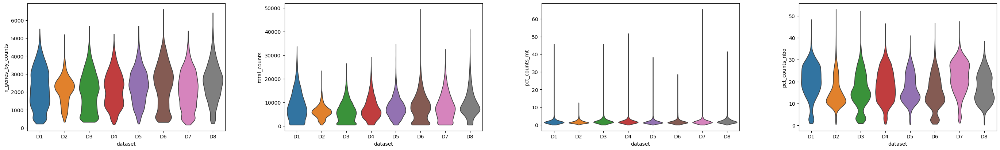

... storing 'Classification' as categorical
... storing 'genotype' as categorical
... storing 'apoe' as categorical
... storing 'disease' as categorical
... storing 'treatment' as categorical
... storing 'genotype_treatment' as categorical
... storing 'feature_types' as categorical


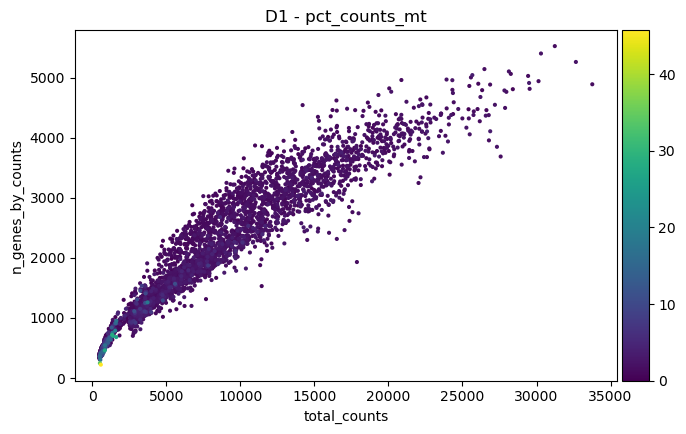

... storing 'Classification' as categorical
... storing 'genotype' as categorical
... storing 'apoe' as categorical
... storing 'disease' as categorical
... storing 'treatment' as categorical
... storing 'genotype_treatment' as categorical
... storing 'feature_types' as categorical


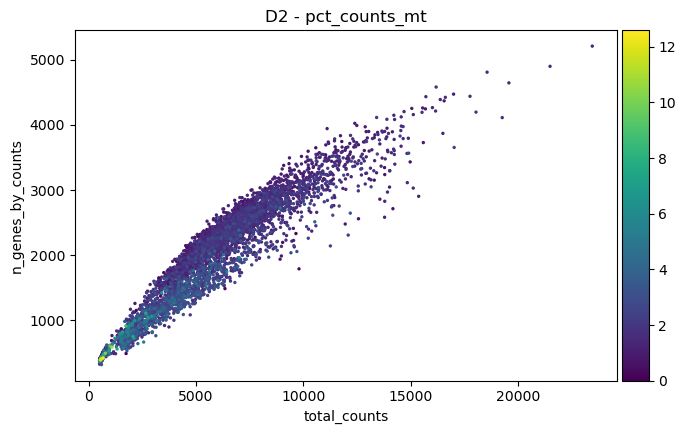

... storing 'Classification' as categorical
... storing 'genotype' as categorical
... storing 'apoe' as categorical
... storing 'disease' as categorical
... storing 'treatment' as categorical
... storing 'genotype_treatment' as categorical
... storing 'feature_types' as categorical


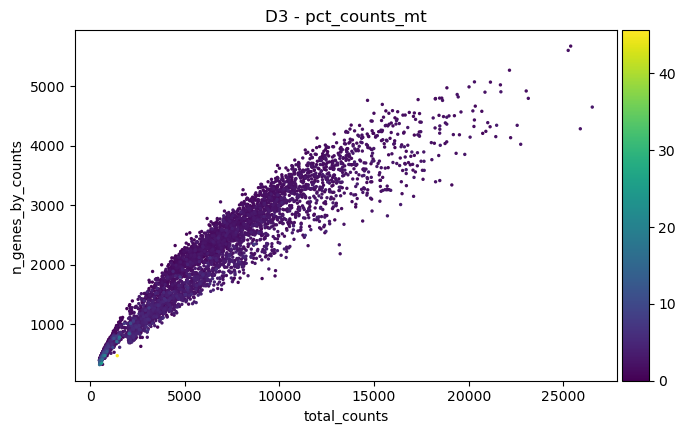

... storing 'Classification' as categorical
... storing 'genotype' as categorical
... storing 'apoe' as categorical
... storing 'disease' as categorical
... storing 'treatment' as categorical
... storing 'genotype_treatment' as categorical
... storing 'feature_types' as categorical


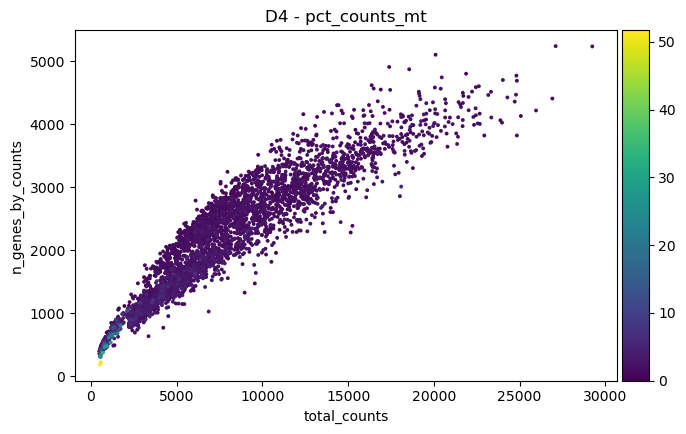

... storing 'Classification' as categorical
... storing 'genotype' as categorical
... storing 'apoe' as categorical
... storing 'disease' as categorical
... storing 'treatment' as categorical
... storing 'genotype_treatment' as categorical
... storing 'feature_types' as categorical


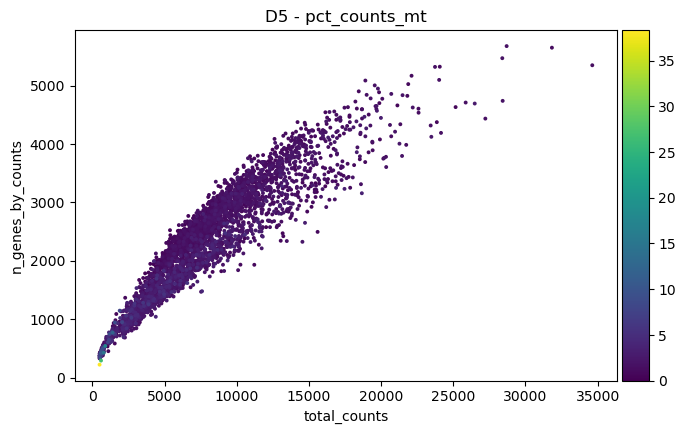

... storing 'Classification' as categorical
... storing 'genotype' as categorical
... storing 'apoe' as categorical
... storing 'disease' as categorical
... storing 'treatment' as categorical
... storing 'genotype_treatment' as categorical
... storing 'feature_types' as categorical


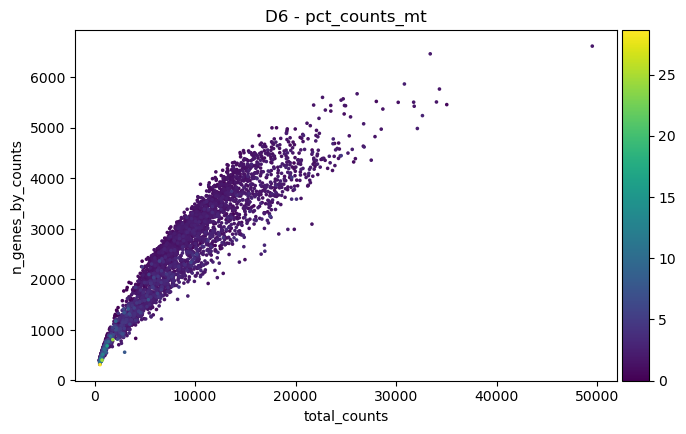

... storing 'Classification' as categorical
... storing 'genotype' as categorical
... storing 'apoe' as categorical
... storing 'disease' as categorical
... storing 'treatment' as categorical
... storing 'genotype_treatment' as categorical
... storing 'feature_types' as categorical


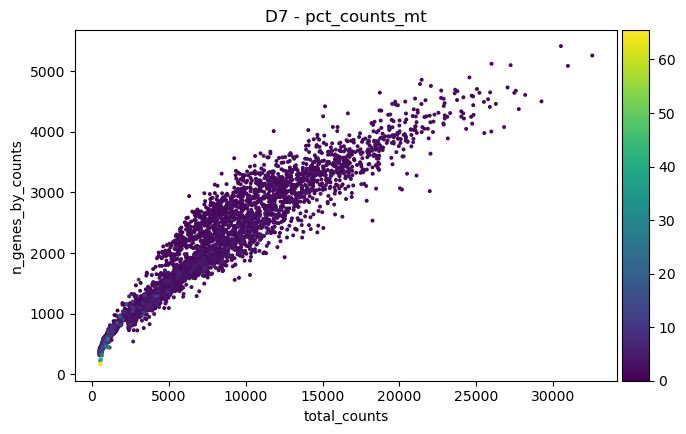

... storing 'Classification' as categorical
... storing 'genotype' as categorical
... storing 'apoe' as categorical
... storing 'disease' as categorical
... storing 'treatment' as categorical
... storing 'genotype_treatment' as categorical
... storing 'feature_types' as categorical


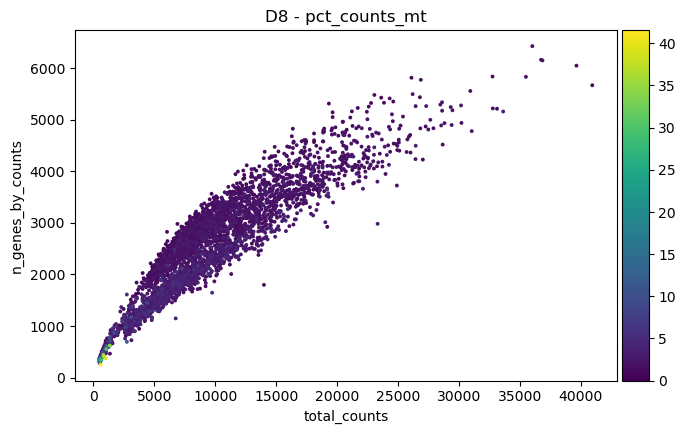

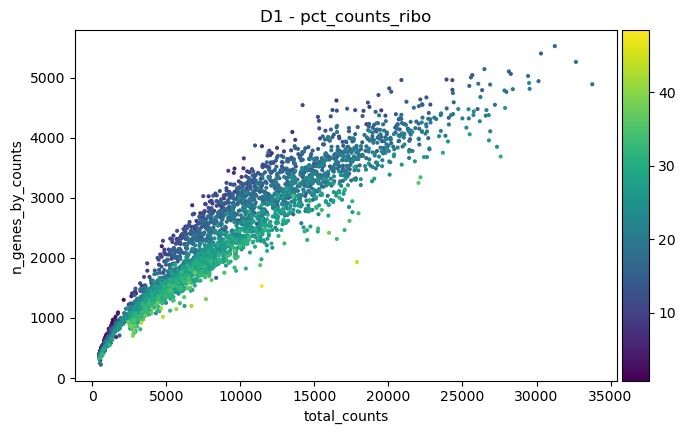

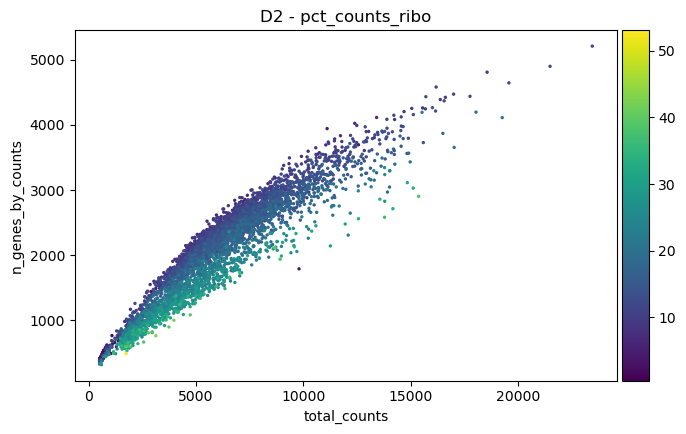

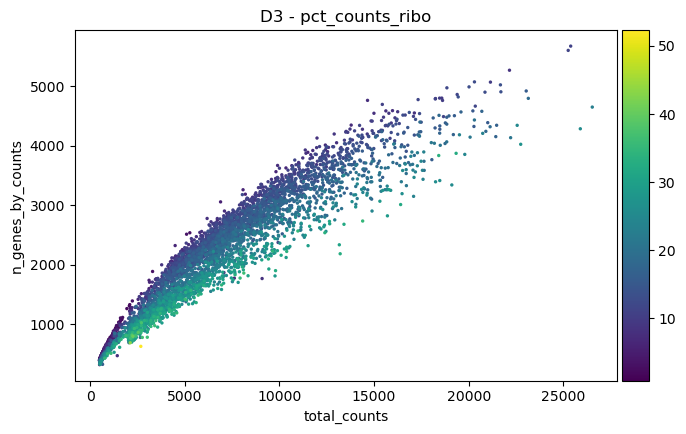

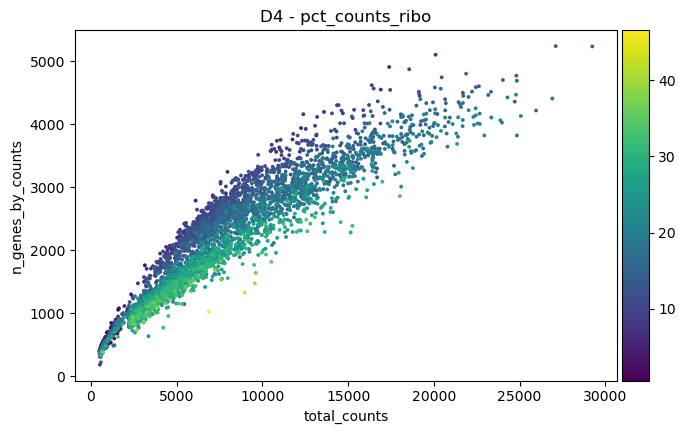

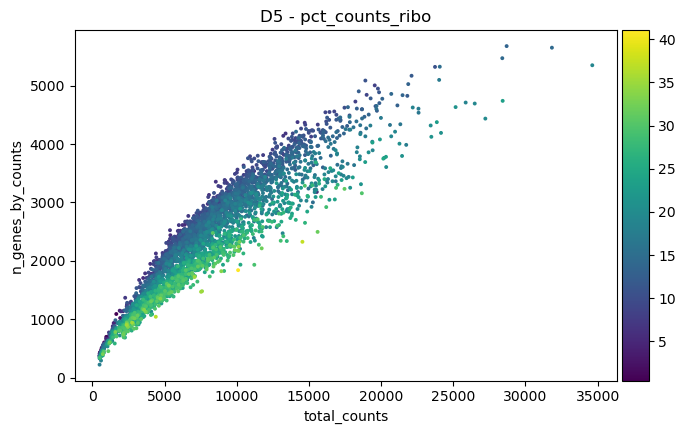

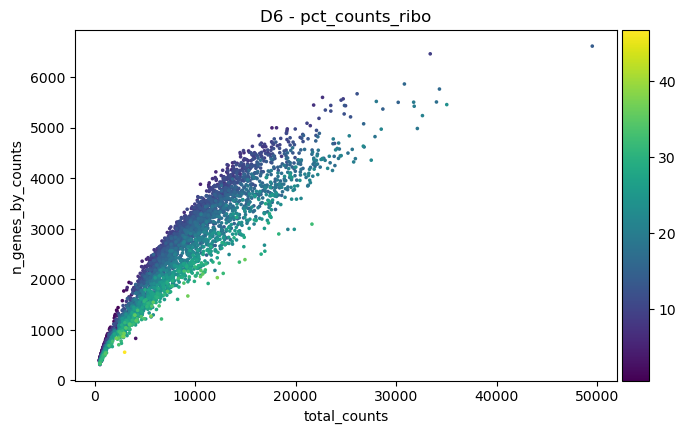

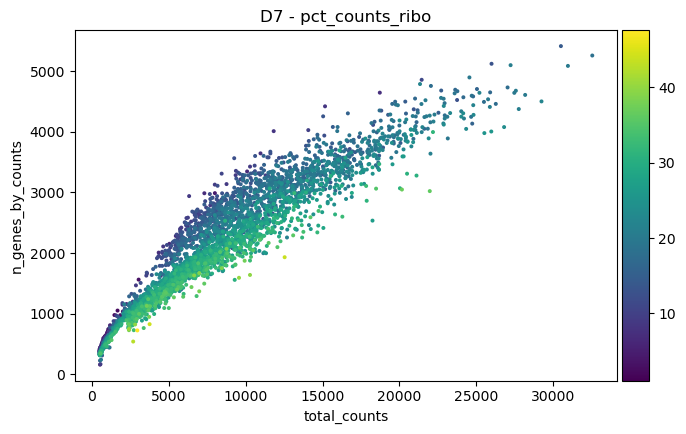

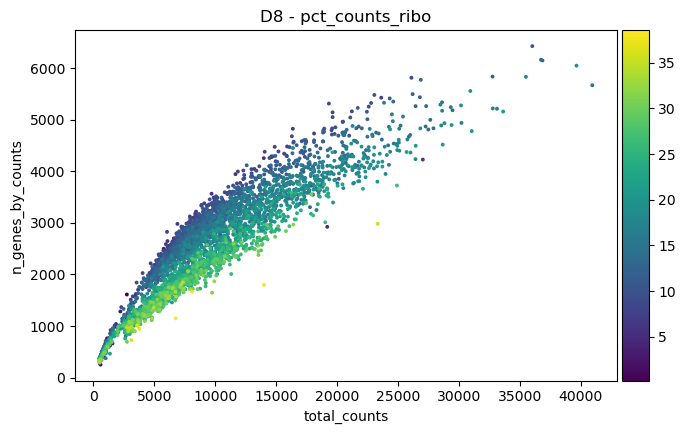

In [18]:
# Visualize pre-filtering QC measures
f.visualize_QC_measures(adatas)

In [19]:
# Basic QC thresholds
QC_filtered_adatas = {}
for adata_key, adata in adatas.items():
    print(f"{adata_key}:")
    QC_filtered_adatas[adata_key] =f.QC_filter_adata(adata, mt_threshold=5, ribo_threshold=5, min_counts=2000, min_genes=300, min_cells=3)
    print("\n")

D1:
Initial AnnData has 3403 cells and 33989 genes
97 cells have >5% mitochondrial genes.
197 cells have <5% ribosomal genes.
465 cells have <2000 total counts.
2 cells have <300 expressed genes.
500 unique cells will be removed based on combined QC thresholds.
19002 genes are expressed in fewer than 3 cells. Will be filtered.
Filtered AnnData has 2903 cells and 14987 genes


D2:
Initial AnnData has 5041 cells and 33989 genes
54 cells have >5% mitochondrial genes.
85 cells have <5% ribosomal genes.
316 cells have <2000 total counts.
0 cells have <300 expressed genes.
343 unique cells will be removed based on combined QC thresholds.
18475 genes are expressed in fewer than 3 cells. Will be filtered.
Filtered AnnData has 4698 cells and 15514 genes


D3:
Initial AnnData has 5029 cells and 33989 genes
137 cells have >5% mitochondrial genes.
616 cells have <5% ribosomal genes.
890 cells have <2000 total counts.
0 cells have <300 expressed genes.
948 unique cells will be removed based on comb

Visualizations QC Measures for multiple datasets:


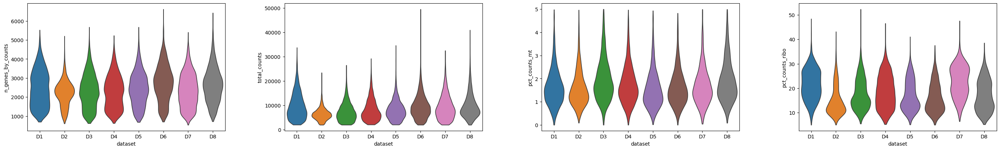

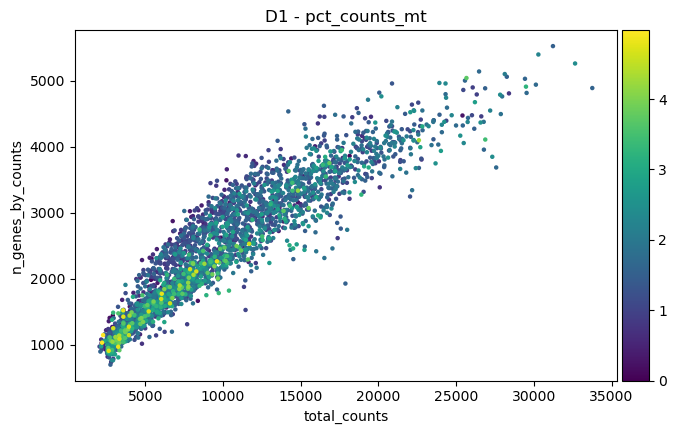

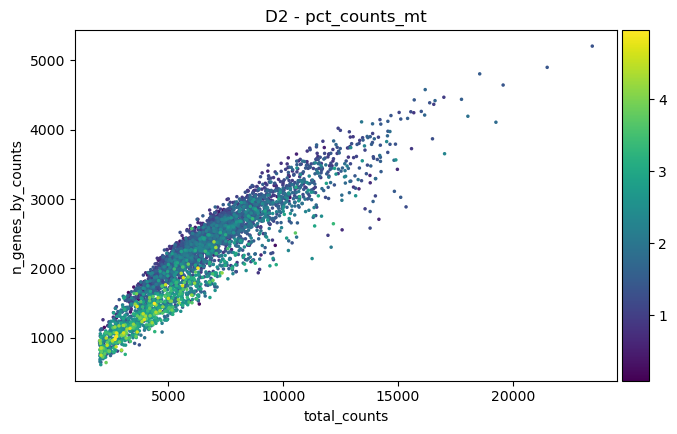

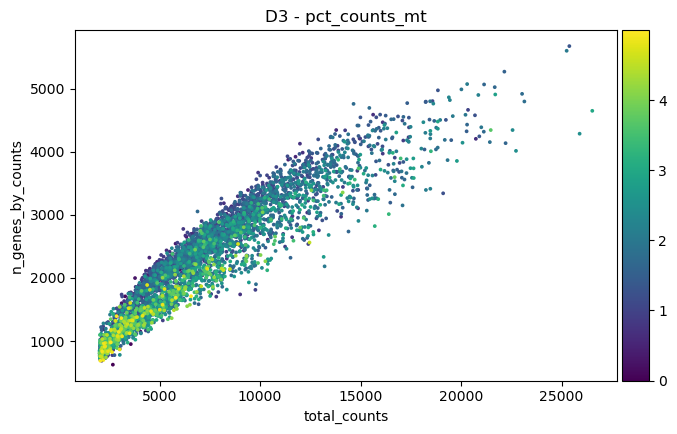

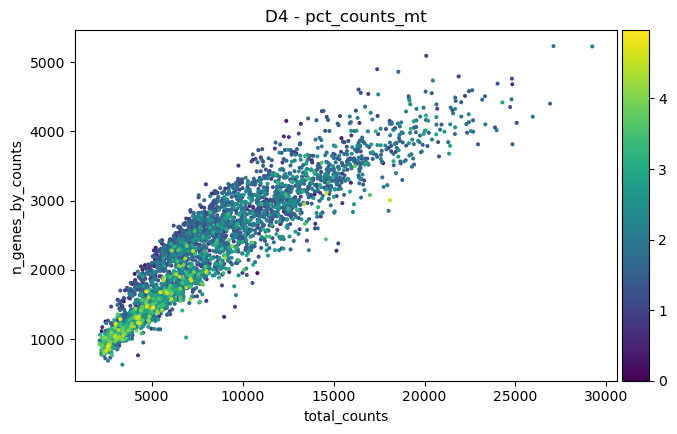

...

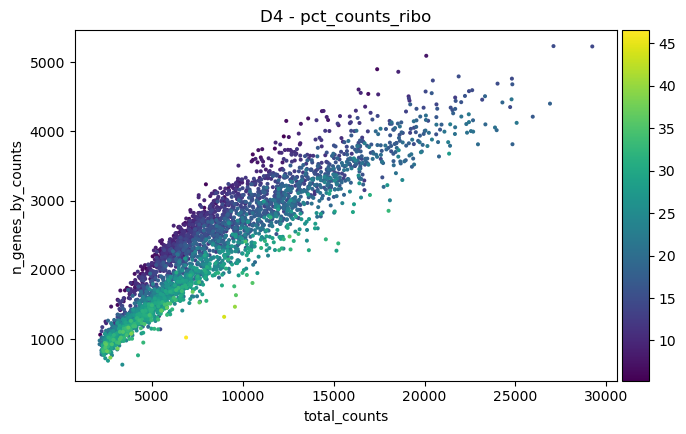

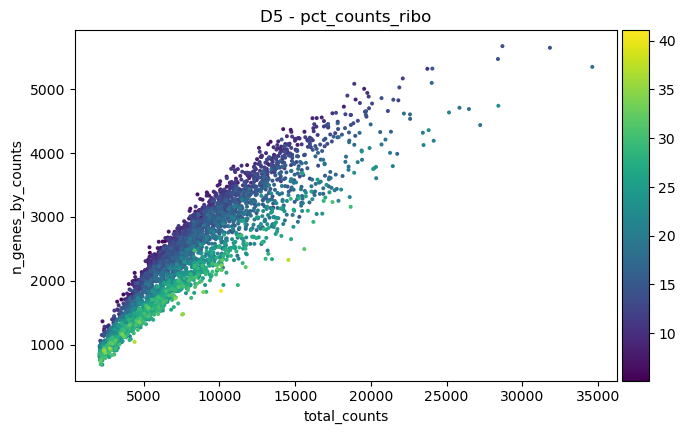

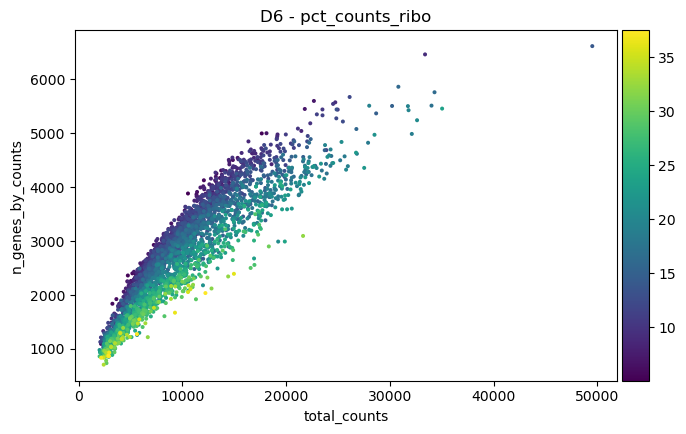

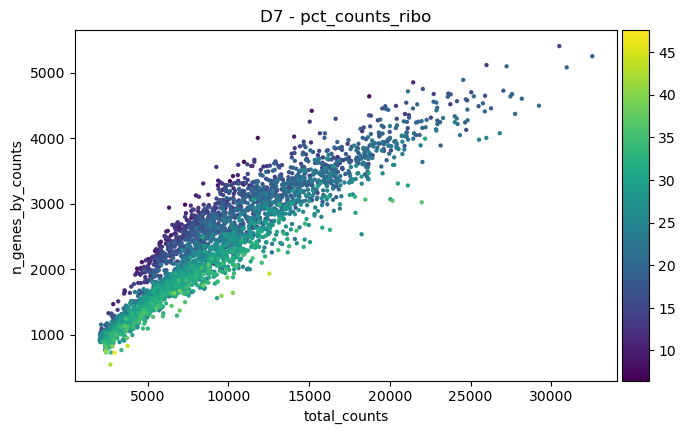

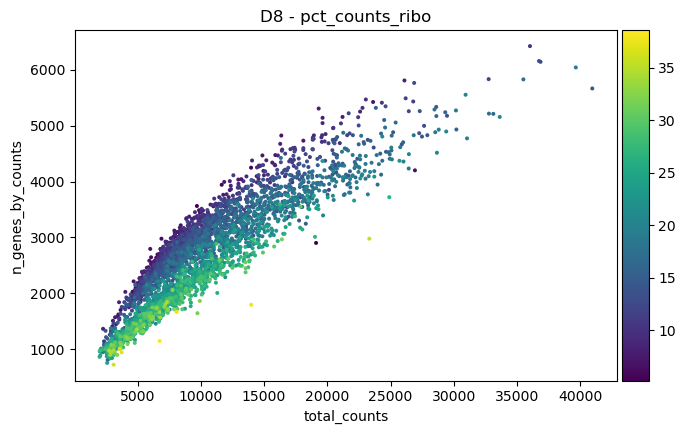

In [20]:
f.visualize_QC_measures(QC_filtered_adatas)

# Remove Non-Microglia (need to add manual annotation step from analysis1 notebook)

In [21]:
# Initialize counters for total cells before and after removal
total_cells_before = 0
total_cells_after = 0

# Loop through each adata in the QC_filtered_adatas dictionary
for i, (adata_key, adata) in enumerate(QC_filtered_adatas.items()):
    print(f"Processing {adata_key}:")

    # Get the cells that are in the adata
    adata_cell_ids = adata.obs.index

    # Add the number of cells in the current adata to the total before removal
    total_cells_before += len(adata_cell_ids)

    # Define the expected suffix based on the current index (e.g., _0 for first, _1 for second)
    expected_suffix = f'_{i}'

    # Filter manual_annotations to include only the cells with the matching suffix
    manual_annotation_cells_with_suffix = manual_annotations[manual_annotations.index.str.endswith(expected_suffix)]

    # Remove the suffix from manual_annotations to match the format in adata_cell_ids
    manual_annotation_cells = manual_annotation_cells_with_suffix.index.str.replace(expected_suffix, '')

    # Find the cells present in both adata and manual_annotations (after suffix removal)
    matching_cells = adata_cell_ids.intersection(manual_annotation_cells)

    # Find cells annotated as 'Other' in the matching manual_annotations
    other_cells = manual_annotation_cells_with_suffix[manual_annotation_cells_with_suffix['manual_annotation'] == 'Other'].index

    # Ensure the 'Other' cells have the suffix properly formatted before removal
    other_cells_no_suffix = other_cells.str.replace(expected_suffix, '')

    # Remove these 'Other' cells from the adata
    print(f"Removing {len(other_cells)} cells annotated as 'Other' from {adata_key}")
    adata = adata[~adata.obs.index.isin(other_cells_no_suffix)].copy()

    # Add the number of cells in the current adata to the total after removal
    total_cells_after += adata.obs.shape[0]

    # Update the adatas dictionary with the filtered adata
    QC_filtered_adatas[adata_key] = adata

    print(f"Number of cells after removal in {adata_key}: {adata.obs.shape[0]}")
    print("\n")

# Print the total cell counts before and after removal
print(f"Total number of cells before removing 'Other' cells: {total_cells_before}")
print(f"Total number of cells after removing 'Other' cells: {total_cells_after}")

Processing D1:
Removing 67 cells annotated as 'Other' from D1
Number of cells after removal in D1: 2840


Processing D2:
Removing 509 cells annotated as 'Other' from D2
Number of cells after removal in D2: 4239


Processing D3:
Removing 387 cells annotated as 'Other' from D3
Number of cells after removal in D3: 3727


Processing D4:
Removing 124 cells annotated as 'Other' from D4
Number of cells after removal in D4: 3441


Processing D5:
Removing 209 cells annotated as 'Other' from D5
Number of cells after removal in D5: 3397


Processing D6:
Removing 207 cells annotated as 'Other' from D6
Number of cells after removal in D6: 3405


Processing D7:
Removing 31 cells annotated as 'Other' from D7
Number of cells after removal in D7: 3072


Processing D8:
Removing 0 cells annotated as 'Other' from D8
Number of cells after removal in D8: 3601


Total number of cells before removing 'Other' cells: 29153
Total number of cells after removing 'Other' cells: 27722


# Merge & Subset

In [22]:
adata = ad.concat(list(QC_filtered_adatas.values()), axis=0, label="sample", join="outer", merge="unique")
adata.obs_names_make_unique()


print(adata)

AnnData object with n_obs × n_vars = 27722 × 17341
    obs: 'K231', 'K233', 'K234', 'K219', 'Classification', 'most_likely_hypothesis', 'genotype', 'apoe', 'disease', 'treatment', 'genotype_treatment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'G143', 'G146', 'K232', 'G180', 'K257', 'K261', 'K262', 'K268', 'G118', 'G119', 'G120', 'G122', 'G183', 'G184', 'G185', 'G186', 'K248', 'K249', 'K250', 'K252', 'G177', 'G178', 'G179', 'G145', 'K283', 'K284', 'sample'


/opt/homebrew/Caskroom/mambaforge/envs/sc_env3_omni/lib/python3.12/site-packages/anndata/_core/anndata.py:1792: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [23]:

# remove and gc the QC_filtered_adatas and adatas
del QC_filtered_adatas
del adatas
gc.collect()

31016

In [24]:
# Group by 'genotype', 'treatment', and count unique 'classification' values
breakdown = adata.obs.groupby(['genotype', 'treatment'])['Classification'].nunique().reset_index()

# Rename columns for clarity
breakdown.columns = ['Genotype', 'Treatment', 'Number of individuals']

# Print the resulting table
print(breakdown)

  Genotype Treatment  Number of individuals
0    E3FAD       LPS                      3
1    E3FAD   VEHICLE                      4
2     E3WT       LPS                      3
3     E3WT   VEHICLE                      4
4    E4FAD       LPS                      5
5    E4FAD   VEHICLE                      4
6     E4WT       LPS                      3
7     E4WT   VEHICLE                      4


In [25]:
 # Count the number of unique classifications
num_classifications = adata.obs['Classification'].nunique()
num_genotype_treatment = adata.obs['genotype_treatment'].nunique()

# Print the result
print(f"Number of unique classifications: {num_classifications}")
print(f"Number of unique genotype_treatment combinations: {num_genotype_treatment}")

Number of unique classifications: 30
Number of unique genotype_treatment combinations: 8


# Make Subsets for Experimental Conditions

In [26]:
adata.obs

,K231,K233,K234,K219,Classification,most_likely_hypothesis,genotype,apoe,disease,treatment,...,K249,K250,K252,G177,G178,G179,G145,K283,K284,sample
AAACCCACACACCTAA-1,5.0,6.0,1.0,339.0,K219,1.0,E4FAD,E4,FAD,LPS,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
AAACCCACACTGTGTA-1,5.0,4.0,5.0,313.0,K219,1.0,E4FAD,E4,FAD,LPS,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
AAACGAATCATTCCTA-1,3.0,6.0,283.0,7.0,K234,1.0,E3FAD,E3,FAD,VEHICLE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
AAACGCTAGACGCCAA-1,97.0,3.0,7.0,1.0,K231,1.0,E3FAD,E3,FAD,VEHICLE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
AAACGCTAGCCAAGGT-1,2.0,4.0,162.0,3.0,K234,1.0,E3FAD,E3,FAD,VEHICLE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGAGGGTTAAT-1,NaN,NaN,NaN,NaN,K283,1.0,E3WT,E3,WT,LPS,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,455.0,1.0,7
TTTGTTGCATTGGATC-1,NaN,NaN,NaN,NaN,K283,1.0,E3WT,E3,WT,LPS,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,490.0,0.0,7
TTTGTTGGTACGGATG-1,NaN,NaN,NaN,NaN,K283,1.0,E3WT,E3,WT,LPS,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,540.0,4.0,7
TTTGTTGGTTCGTAAC-1,NaN,NaN,NaN,NaN,K283,1.0,E3WT,E3,WT,LPS,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,998.0,1.0,7


In [27]:
adata.uns['name'] = 'Full Dataset (All Samples, only Microglia, MT-regressed, QC-filtered)'

# Now create subsets for each genotype
adata_e3fad = adata[adata.obs['genotype'] == 'E3FAD'].copy()
adata_e3fad.uns['name'] = 'E3FAD'
adata_e4fad = adata[adata.obs['genotype'] == 'E4FAD'].copy()
adata_e4fad.uns['name'] = 'E4FAD'
adata_e3wt = adata[adata.obs['genotype'] == 'E3WT'].copy()
adata_e3wt.uns['name'] = 'E3WT'
adata_e4wt = adata[adata.obs['genotype'] == 'E4WT'].copy()
adata_e4wt.uns['name'] = 'E4WT'
# Now subset for each specific genotype and treatment
adata_e3fad_lps = adata_e3fad[adata_e3fad.obs['treatment'] == 'LPS'].copy()
adata_e3fad_lps.uns['name'] = 'E3FAD_LPS'
adata_e3fad_vehicle = adata_e3fad[adata_e3fad.obs['treatment'] == 'VEHICLE'].copy()
adata_e3fad_vehicle.uns['name'] = 'E3FAD_VEHICLE'
adata_e4fad_lps = adata_e4fad[adata_e4fad.obs['treatment'] == 'LPS'].copy()
adata_e4fad_lps.uns['name'] = 'E4FAD_LPS'
adata_e4fad_vehicle = adata_e4fad[adata_e4fad.obs['treatment'] == 'VEHICLE'].copy()
adata_e4fad_vehicle.uns['name'] = 'E4FAD_VEHICLE'
adata_e3wt_lps = adata_e3wt[adata_e3wt.obs['treatment'] == 'LPS'].copy()
adata_e3wt_lps.uns['name'] = 'E3WT_LPS'
adata_e3wt_vehicle = adata_e3wt[adata_e3wt.obs['treatment'] == 'VEHICLE'].copy()
adata_e3wt_vehicle.uns['name'] = 'E3WT_VEHICLE'
adata_e4wt_lps = adata_e4wt[adata_e4wt.obs['treatment'] == 'LPS'].copy()
adata_e4wt_lps.uns['name'] = 'E4WT_LPS'
adata_e4wt_vehicle = adata_e4wt[adata_e4wt.obs['treatment'] == 'VEHICLE'].copy()
adata_e4wt_vehicle.uns['name'] = 'E4WT_VEHICLE'
# Also creat subset for 'apoe' and 'treatment
adata_e4 = adata[adata.obs['apoe'] == 'E4'].copy()
adata_e4.uns['name'] = 'E4'
adata_e3 = adata[adata.obs['apoe'] == 'E3'].copy()
adata_e3.uns['name'] = 'E3'
adata_e4_lps = adata_e4[adata_e4.obs['treatment'] == 'LPS'].copy()
adata_e4_lps.uns['name'] = 'E4_LPS'
adata_e4_vehicle = adata_e4[adata_e4.obs['treatment'] == 'VEHICLE'].copy()
adata_e4_vehicle.uns['name'] = 'E4_VEHICLE'
adata_e3_lps = adata_e3[adata_e3.obs['treatment'] == 'LPS'].copy()
adata_e3_lps.uns['name'] = 'E3_LPS'
adata_e3_vehicle = adata_e3[adata_e3.obs['treatment'] == 'VEHICLE'].copy()
adata_e3_vehicle.uns['name'] = 'E3_VEHICLE'





adata_subs = [adata_e4, adata_e3, adata_e4_lps, adata_e4_vehicle, adata_e3_lps, adata_e3_vehicle, adata_e3fad, adata_e4fad, adata_e3wt, adata_e4wt, adata_e3fad_lps, adata_e3fad_vehicle, adata_e4fad_lps, adata_e4fad_vehicle, adata_e3wt_lps, adata_e3wt_vehicle, adata_e4wt_lps, adata_e4wt_vehicle]
print(adata_subs)
print(adata)

[AnnData object with n_obs × n_vars = 13831 × 17341
    obs: 'K231', 'K233', 'K234', 'K219', 'Classification', 'most_likely_hypothesis', 'genotype', 'apoe', 'disease', 'treatment', 'genotype_treatment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'G143', 'G146', 'K232', 'G180', 'K257', 'K261', 'K262', 'K268', 'G118', 'G119', 'G120', 'G122', 'G183', 'G184', 'G185', 'G186', 'K248', 'K249', 'K250', 'K252', 'G177', 'G178', 'G179', 'G145', 'K283', 'K284', 'sample'
    uns: 'name', AnnData object with n_obs × n_vars = 13891 × 17341
    obs: 'K231', 'K233', 'K234', 'K219', 'Classification', 'most_likely_hypothesis', 'genotype', 'apoe', 'disease', 'treatment', 'genotype_treatment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'G143', 'G146', 'K232', 'G180', 'K257', 'K261', 'K262', 'K268', 'G118', 'G119', 'G120', 'G122', 'G183', 'G184', 'G185', 'G186', 'K248',

# Normalization & Feature Selection

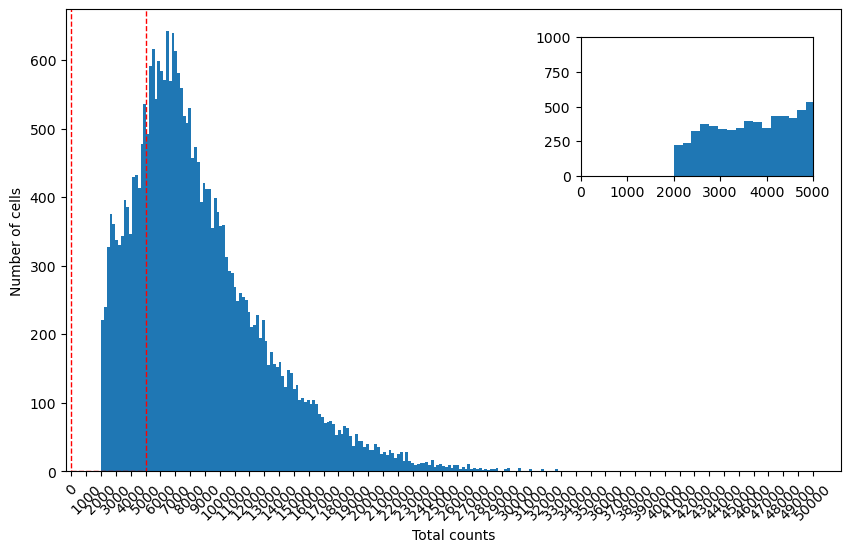

In [28]:
# before normalizing, save the raw counts
adata.layers["counts"] = adata.X.copy()
f.plot_total_counts_vs_cells(adata, bins=250, zoom_x_range=(0, 5000), zoom_y_range=(0, 1000))
#  same for the subsets
for adata_sub in adata_subs:
    adata_sub.layers["counts"] = adata_sub.X.copy()

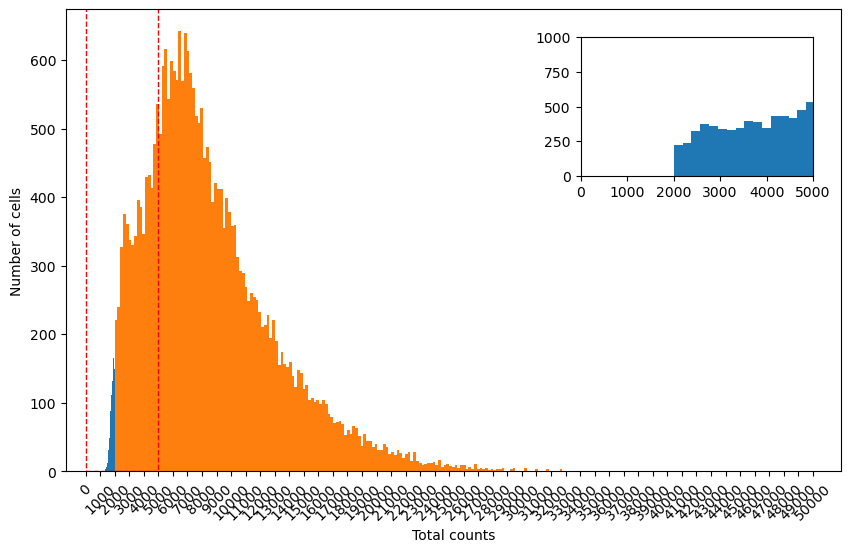

In [29]:
# normalize and log the data and store that in a different layer too incase we need to switch between them.
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata.layers['log_norm'] = adata.X.copy()
#so we can plot a histogram of the total counts/cells after norm
adata.obs["norm_total_counts"] = adata.X.sum(axis=1)    
f.plot_total_counts_vs_cells(adata, norm=True, bins=250, zoom_x_range=(0, 5000), zoom_y_range=(0, 1000))
#  same for the subsets (without plot)      
for adata_sub in adata_subs:
    sc.pp.normalize_total(adata_sub)
    sc.pp.log1p(adata_sub)
    adata_sub.layers['log_norm'] = adata_sub.X.copy()

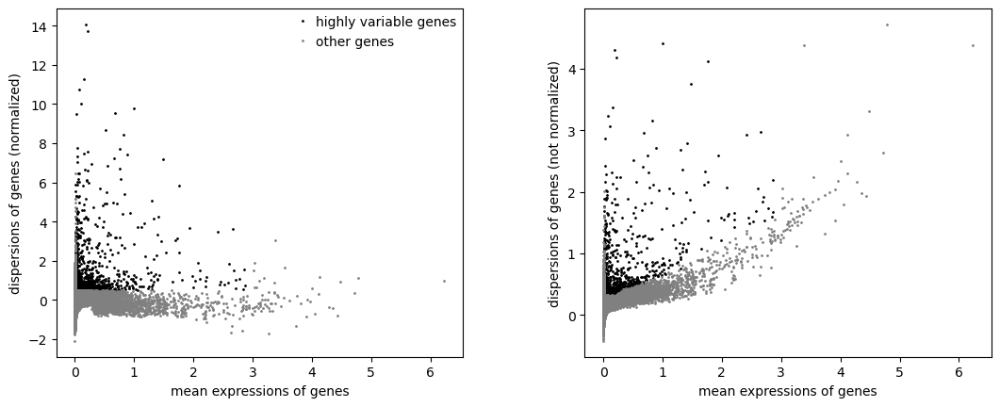

1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly variable.
1124 out of 17341 genes are considered highly va

In [30]:
sc.pp.highly_variable_genes(adata, batch_key="sample")
sc.pl.highly_variable_genes(adata)
#make some variables to print a nice little summary
num_highly_variable_genes_t = adata.var['highly_variable'].sum()
total_genes_t = adata.var.shape[0]

print(f"{num_highly_variable_genes_t} out of {total_genes_t} genes are considered highly variable.")

#  same for the subsets
for adata_sub in adata_subs:
    sc.pp.highly_variable_genes(adata_sub, batch_key="sample")
    num_highly_variable_genes_t = adata.var['highly_variable'].sum()
    total_genes_t = adata.var.shape[0]

    print(f"{num_highly_variable_genes_t} out of {total_genes_t} genes are considered highly variable.")   

# Cell Cycle Scoring & Regression

In [31]:
adata.X = adata.layers["counts"].copy()
adata=f.annotate_cellcycle_mouse(adata)

df = adata.obs[['phase', 'genotype', 'apoe', 'treatment', 'disease']]


# Calculate and print the total percentages for each phase
total_phase_percentages = {}
total_count = adata.obs.shape[0]

for p in adata.obs['phase'].unique():
    phase_count = len(adata.obs[adata.obs['phase'] == p])
    phase_percentage = round(phase_count / total_count * 100, 2)
    total_phase_percentages[p] = phase_percentage
    print(f"The percent of {p} phase in the total dataset is {phase_percentage}%")
print("\n")

# Calculate and print the percentages for each sample and compare to the total dataset
for s in adata.obs['sample'].unique():
    for p in adata.obs['phase'].unique():
        phase_count = adata[(adata.obs['phase'] == p) & (adata.obs['sample'] == s)].shape[0]
        sample_total_count = adata[adata.obs['sample'] == s].shape[0]
        sample_phase_percentage = round(phase_count / sample_total_count * 100, 2)
        total_phase_percentage = total_phase_percentages[p]
        difference = sample_phase_percentage - total_phase_percentage
        difference_statement = f"{difference:.2f}% higher" if difference > 0 else f"{-difference:.2f}% lower"
        print(f"{s} : The percent of {p} phase is {sample_phase_percentage}% ({difference_statement} than the total dataset)")
    print('\n')


for s in adata.obs['genotype'].dropna().unique():
    for p in adata.obs['phase'].unique():
        phase_count = adata[(adata.obs['phase'] == p) & (adata.obs['genotype'] == s)].shape[0]
        sample_total_count = adata[adata.obs['genotype'] == s].shape[0]
        sample_phase_percentage = round(phase_count / sample_total_count * 100, 2)
        total_phase_percentage = total_phase_percentages[p]
        difference = sample_phase_percentage - total_phase_percentage
        difference_statement = f"{difference:.2f}% higher" if difference > 0 else f"{-difference:.2f}% lower"
        print(f"{s} : The percent of {p} phase is {sample_phase_percentage}% ({difference_statement} than the total dataset)")
    print('\n')

       'Kif20B', 'Hn1', 'Cdc25C', 'Kif2C', 'G2E3', 'Gas2L3'],
      dtype='object')
The percent of S phase in the total dataset is 26.87%
The percent of G1 phase in the total dataset is 67.37%
The percent of G2M phase in the total dataset is 5.76%


0 : The percent of S phase is 31.65% (4.78% higher than the total dataset)
0 : The percent of G1 phase is 63.45% (3.92% lower than the total dataset)
0 : The percent of G2M phase is 4.89% (0.87% lower than the total dataset)


1 : The percent of S phase is 23.17% (3.70% lower than the total dataset)
1 : The percent of G1 phase is 70.23% (2.86% higher than the total dataset)
1 : The percent of G2M phase is 6.61% (0.85% higher than the total dataset)


2 : The percent of S phase is 25.28% (1.59% lower than the total dataset)
2 : The percent of G1 phase is 68.69% (1.32% higher than the total dataset)
2 : The percent of G2M phase is 6.04% (0.28% higher than the total dataset)


3 : The percent of S phase is 29.29% (2.42% higher than the total d

# Regress Mitochondrial genes

In [32]:
adata.X = adata.layers['log_norm'].copy()

#  same for the subsets
for adata_sub in adata_subs:
    adata_sub.X = adata_sub.layers['log_norm'].copy()

In [33]:

adata = sc.pp.regress_out(adata, 'pct_counts_mt', copy=True)

#  same for the subsets
for adata_sub in adata_subs:
    adata_sub = sc.pp.regress_out(adata_sub, 'pct_counts_mt', copy=True)
    


... storing 'phase' as categorical
... storing 'cellcycle' as categorical
/opt/homebrew/Caskroom/mambaforge/envs/sc_env3_omni/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:666: NumbaPerformanceWarning: '@' is faster on contiguous arrays, called on (Array(float64, 1, 'A', False, aligned=True), Array(float64, 2, 'C', False, aligned=True))
  data[i] -= regressor[i] @ coeff
/opt/homebrew/Caskroom/mambaforge/envs/sc_env3_omni/lib/python3.12/site-packages/scanpy/preprocessing/_simple.py:666: NumbaPerformanceWarning: '@' is faster on contiguous arrays, called on (Array(float64, 1, 'A', False, aligned=True), Array(float64, 2, 'C', False, aligned=True))
  data[i] -= regressor[i] @ coeff


# Dimensionality Reduction

In [34]:
# Prior to various plots, Lets the levels of the categorical variable 'genotype_treatment' in the dataset so it is ordered correctly in the plots
adata.obs['genotype_treatment'] = pd.Categorical(adata.obs['genotype_treatment'], categories=['E3WT_VEHICLE', 'E3WT_LPS', 'E3FAD_VEHICLE', 'E3FAD_LPS', 'E4WT_VEHICLE', 'E4WT_LPS', 'E4FAD_VEHICLE', 'E4FAD_LPS'], ordered=True)

In [35]:
adata

AnnData object with n_obs × n_vars = 27722 × 17341
    obs: 'K231', 'K233', 'K234', 'K219', 'Classification', 'most_likely_hypothesis', 'genotype', 'apoe', 'disease', 'treatment', 'genotype_treatment', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'G143', 'G146', 'K232', 'G180', 'K257', 'K261', 'K262', 'K268', 'G118', 'G119', 'G120', 'G122', 'G183', 'G184', 'G185', 'G186', 'K248', 'K249', 'K250', 'K252', 'G177', 'G178', 'G179', 'G145', 'K283', 'K284', 'sample', 'norm_total_counts', 'S_score', 'G2M_score', 'phase', 'cellcycle'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'name', 'log1p', 'hvg'
    layers: 'counts', 'log_norm'

In [36]:

sc.tl.pca(adata)
sc.pl.pca_variance_ratio(adata, n_pcs=50, show=False)
plt.savefig(FIG_DIR / "pca_variance_ratio.pdf", dpi=300, bbox_inches='tight', transparent=True)
plt.close()

colors = [
    "sample", "sample", "pct_counts_mt", "pct_counts_mt", 
    "genotype", "genotype", "treatment", "treatment", 
    "apoe", "apoe", "disease", "disease"
]

dimensions = [
    (0, 1), (2, 3), (0, 1), (2, 3), 
    (0, 1), (2, 3), (0, 1), (2, 3), 
    (0, 1), (2, 3), (0, 1), (2, 3)
]

for i, (color, dims) in enumerate(zip(colors, dimensions)):
    fig, ax = plt.subplots()
    sc.pl.pca(
        adata,
        color=color,
        dimensions=[dims],
        size=2,
        show=False,
        ax=ax
    )
    fig.savefig(FIG_DIR / f"pca_{color}_{dims[0]}_{dims[1]}.pdf", dpi=300, bbox_inches='tight', transparent=True)
    plt.close(fig)

#  same for the subsets (without plot)
for adata_sub in adata_subs:
    sc.tl.pca(adata_sub)

In [37]:
sc.pp.neighbors(adata, n_pcs=25)

sc.tl.umap(adata, min_dist=0.5)


# same for the subsets
for adata_sub in adata_subs:
    sc.pp.neighbors(adata_sub, n_pcs=25)
    sc.tl.umap(adata_sub)

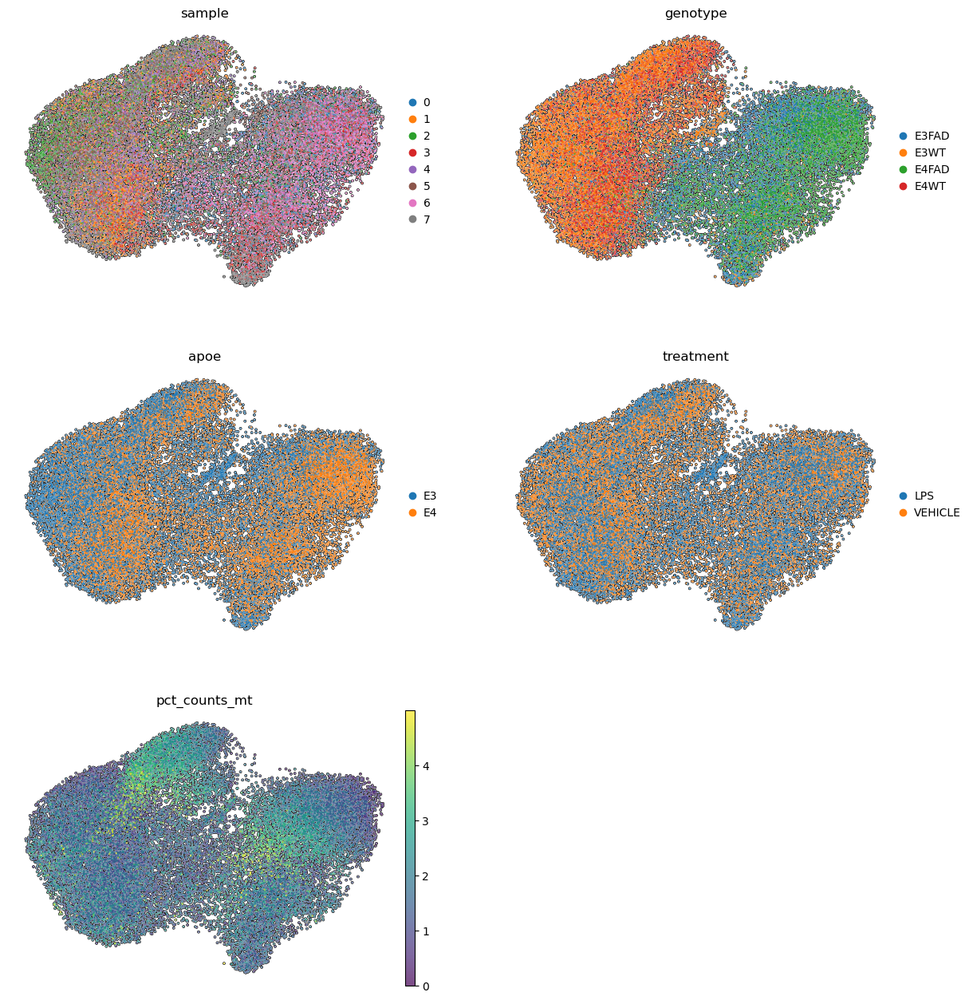

In [38]:
sc.pl.umap(adata, color=['sample','genotype', 'apoe', 'treatment', 'pct_counts_mt'], size =10, ncols=2,  frameon=False, add_outline=True)

In [39]:
sc.tl.umap(adata, min_dist=0.5, n_components=3)

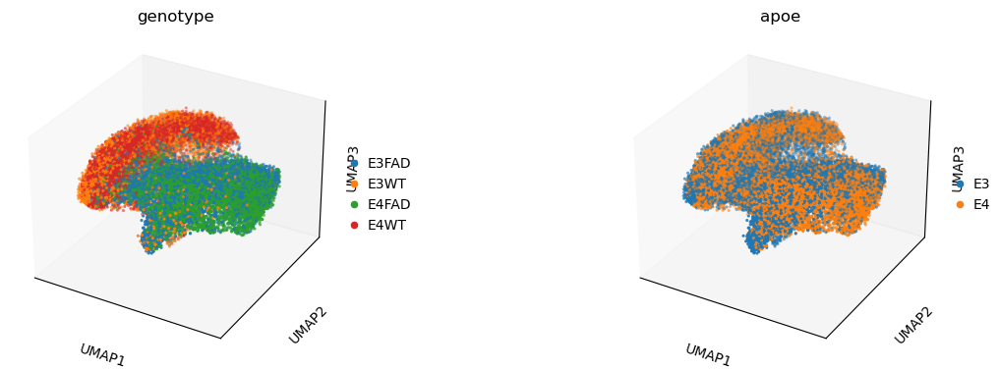

In [40]:
sc.pl.umap(adata, color=['genotype', 'apoe'], size=15,  add_outline=True, projection='3d')

# Clustering

In [42]:
i = 0.1
while i <= 1.9:
    key = f"leiden_{i}"
    if key not in adata.obs:
        sc.tl.leiden(
            adata,
            resolution=i,
            random_state=0,
            n_iterations=2,
            directed=False,
            key_added=key,
            flavor="igraph"
        )
    i += 0.2
    i = round(i, 2)

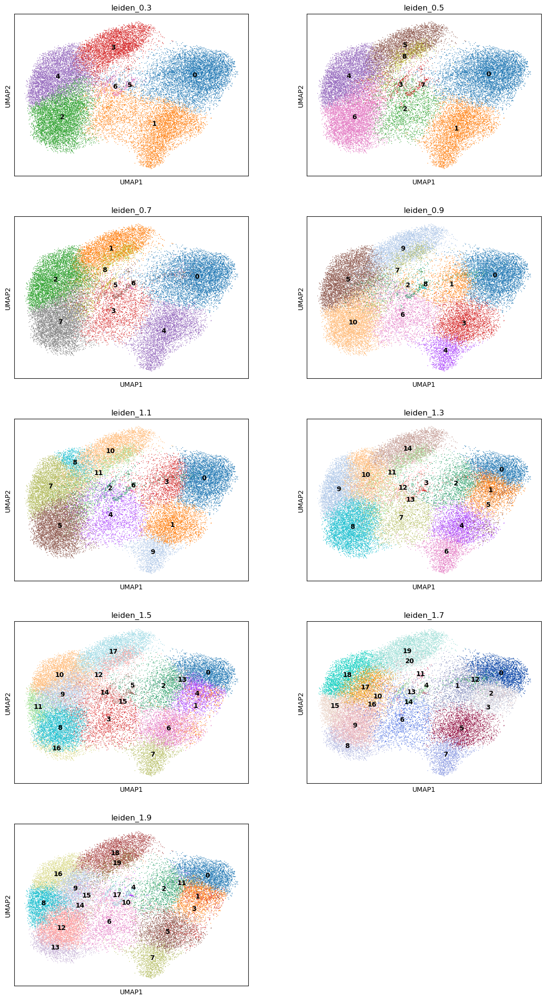

In [43]:


sc.pl.umap(adata, color=['leiden_0.3', 'leiden_0.5', 'leiden_0.7', 'leiden_0.9', 'leiden_1.1', 'leiden_1.3', 'leiden_1.5', 'leiden_1.7', 'leiden_1.9'], legend_loc="on data", ncols=2)



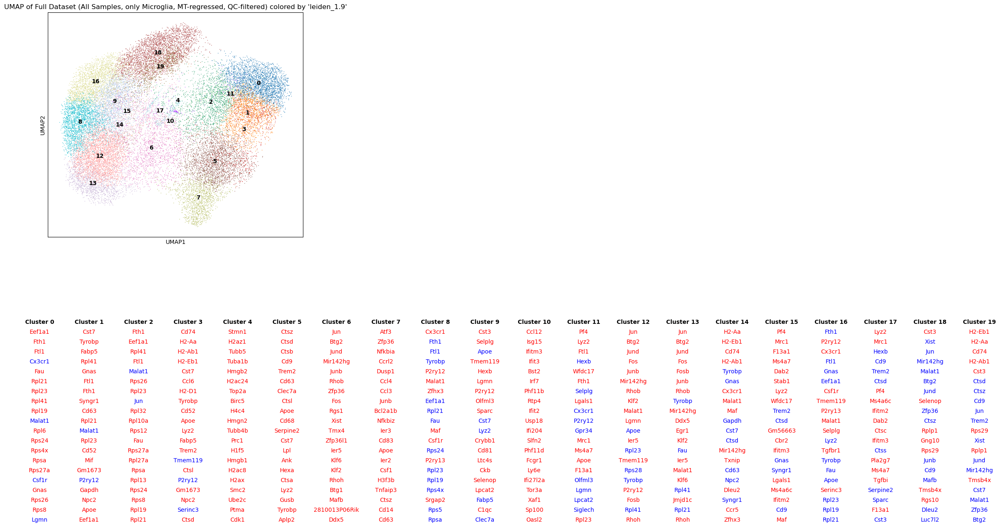

In [44]:
# plot with DEGs by cluster
f.plot_umap_with_gene_list(adata, 'leiden_1.9', n_top_genes=20)

# Cell-Type Assignment

In [45]:
def assign_cell_types2(adata):
    # Assign tentative cell type labels in adata.obs called ['anno2'] based on the top genes
    # Initialize the 'anno2' column with empty strings or any default value
    adata.obs['anno2'] = ''

    adata.obs.loc[adata.obs['leiden_1.9'].isin(['0','4']) , 'anno2'] = 'Ribosomal with DAM markers'

    adata.obs.loc[adata.obs['leiden_1.9'].isin(['1','6','7']), 'anno2'] = 'DAM'

    adata.obs.loc[adata.obs['leiden_1.9'].isin(['5']), 'anno2'] = 'Cycling (G2M/Cdk1+)'

    adata.obs.loc[adata.obs['leiden_1.9'].isin(['8', '10','18']), 'anno2'] = 'IEG-enriched Homeostatic'

    adata.obs.loc[adata.obs['leiden_1.9'].isin(['2','3','9','15','16','17','22','23']), 'anno2'] = 'Homeostatic'

    adata.obs.loc[adata.obs['leiden_1.9'].isin(['11']), 'anno2'] = 'Cytokine Response'

    adata.obs.loc[adata.obs['leiden_1.9'].isin(['12']), 'anno2'] = 'MHC-II DAM'

    adata.obs.loc[adata.obs['leiden_1.9'].isin(['14', '19']), 'anno2'] = 'BAM-like'

    adata.obs.loc[adata.obs['leiden_1.9'].isin(['13', '20']), 'anno2'] = 'Ribosomal Biogenesis'
    
    adata.obs.loc[adata.obs['leiden_1.9'].isin(['21']), 'anno2'] = 'BAM-like'

    # Assign 'Unknown' to cells where 'anno2' is still empty
    adata.obs.loc[adata.obs['anno2'] == '', 'anno2'] = 'Unknown'

assign_cell_types2(adata)

In [46]:
adata.obs['anno2'].value_counts()

anno2
Homeostatic                   7055
IEG-enriched Homeostatic      5312
DAM                           4660
MHC-II DAM                    2811
Ribosomal with DAM markers    2803
Cycling (G2M/Cdk1+)           2281
Ribosomal Biogenesis          1319
BAM-like                      1304
Cytokine Response              177
Name: count, dtype: int64

... storing 'anno2' as categorical



=== Ranking genes: reference = Ribosomal with DAM markers; testing groups = ['Cycling (G2M/Cdk1+)', 'DAM', 'Homeostatic', 'Cytokine Response', 'IEG-enriched Homeostatic', 'MHC-II DAM', 'Ribosomal Biogenesis', 'BAM-like'] ===


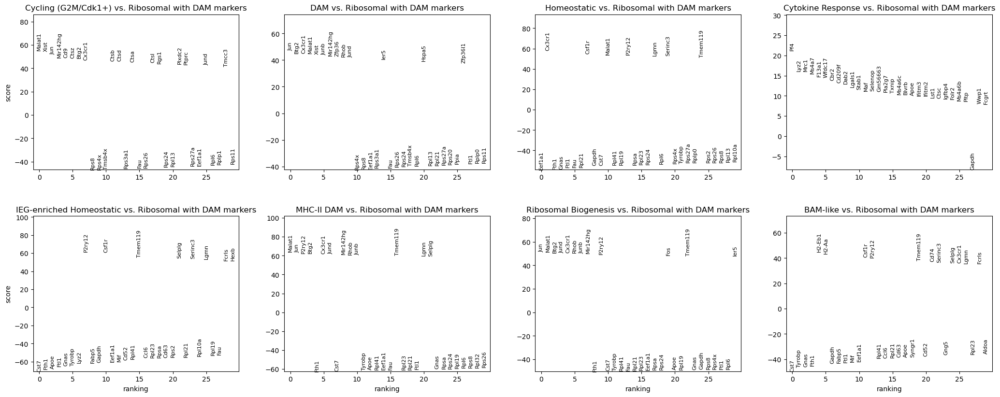


=== Ranking genes: reference = Cycling (G2M/Cdk1+); testing groups = ['Ribosomal with DAM markers', 'DAM', 'Homeostatic', 'Cytokine Response', 'IEG-enriched Homeostatic', 'MHC-II DAM', 'Ribosomal Biogenesis', 'BAM-like'] ===


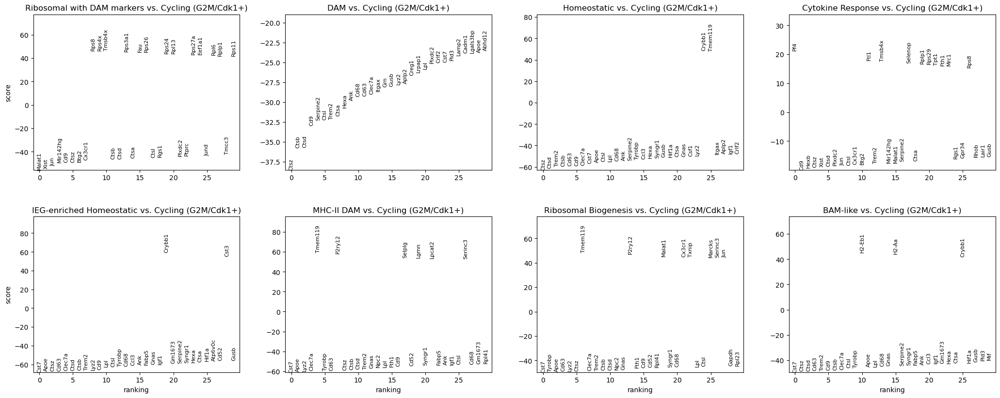


=== Ranking genes: reference = DAM; testing groups = ['Ribosomal with DAM markers', 'Cycling (G2M/Cdk1+)', 'Homeostatic', 'Cytokine Response', 'IEG-enriched Homeostatic', 'MHC-II DAM', 'Ribosomal Biogenesis', 'BAM-like'] ===


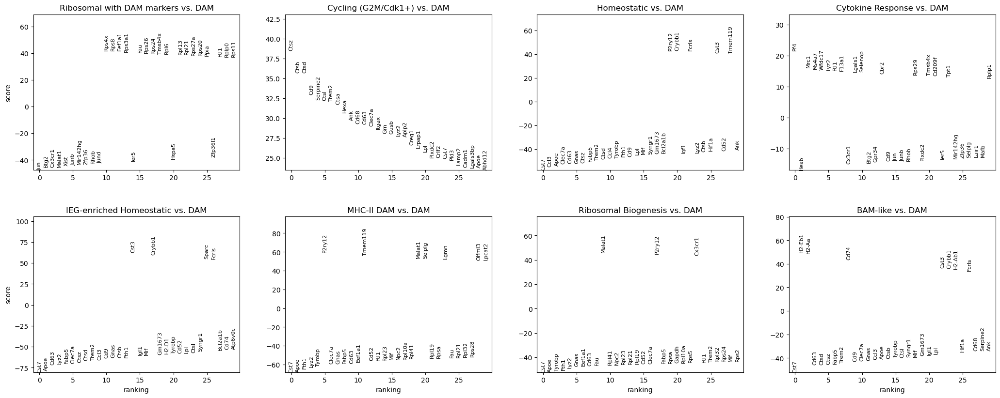


=== Ranking genes: reference = Homeostatic; testing groups = ['Ribosomal with DAM markers', 'Cycling (G2M/Cdk1+)', 'DAM', 'Cytokine Response', 'IEG-enriched Homeostatic', 'MHC-II DAM', 'Ribosomal Biogenesis', 'BAM-like'] ===


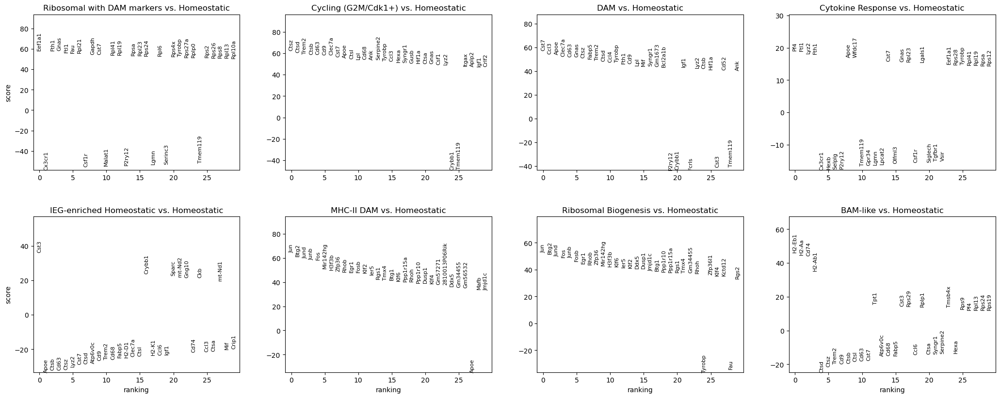


=== Ranking genes: reference = Cytokine Response; testing groups = ['Ribosomal with DAM markers', 'Cycling (G2M/Cdk1+)', 'DAM', 'Homeostatic', 'IEG-enriched Homeostatic', 'MHC-II DAM', 'Ribosomal Biogenesis', 'BAM-like'] ===


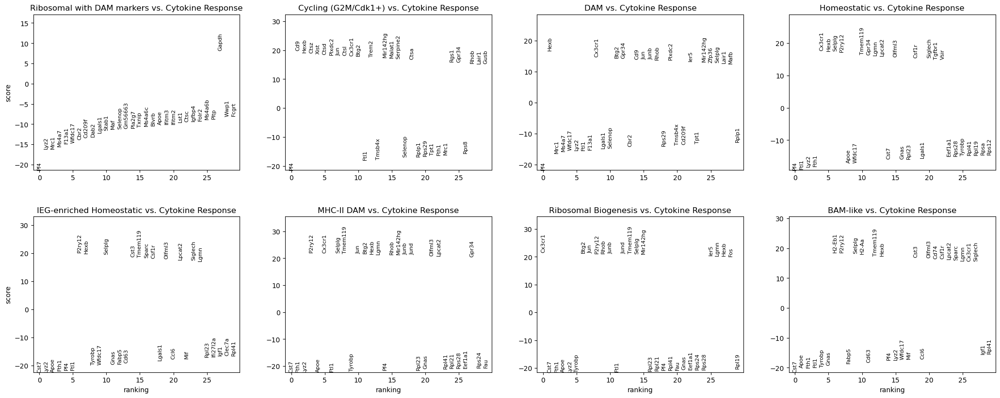


=== Ranking genes: reference = IEG-enriched Homeostatic; testing groups = ['Ribosomal with DAM markers', 'Cycling (G2M/Cdk1+)', 'DAM', 'Homeostatic', 'Cytokine Response', 'MHC-II DAM', 'Ribosomal Biogenesis', 'BAM-like'] ===


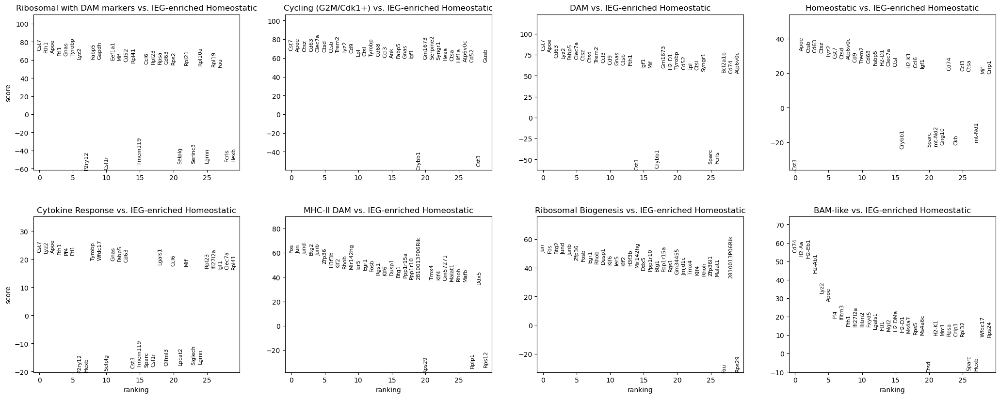


=== Ranking genes: reference = MHC-II DAM; testing groups = ['Ribosomal with DAM markers', 'Cycling (G2M/Cdk1+)', 'DAM', 'Homeostatic', 'Cytokine Response', 'IEG-enriched Homeostatic', 'Ribosomal Biogenesis', 'BAM-like'] ===


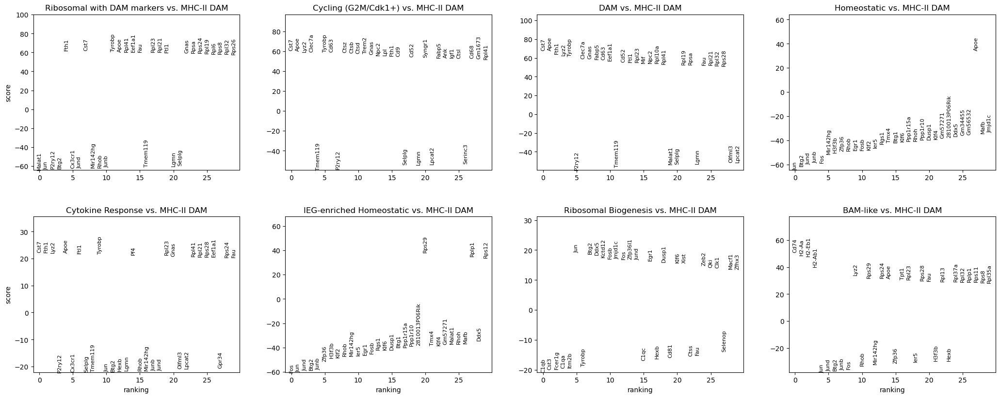


=== Ranking genes: reference = Ribosomal Biogenesis; testing groups = ['Ribosomal with DAM markers', 'Cycling (G2M/Cdk1+)', 'DAM', 'Homeostatic', 'Cytokine Response', 'IEG-enriched Homeostatic', 'MHC-II DAM', 'BAM-like'] ===


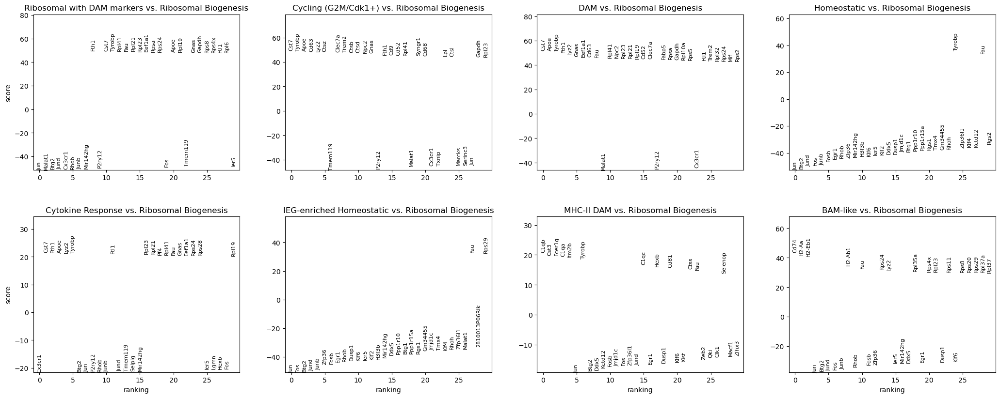


=== Ranking genes: reference = BAM-like; testing groups = ['Ribosomal with DAM markers', 'Cycling (G2M/Cdk1+)', 'DAM', 'Homeostatic', 'Cytokine Response', 'IEG-enriched Homeostatic', 'MHC-II DAM', 'Ribosomal Biogenesis'] ===


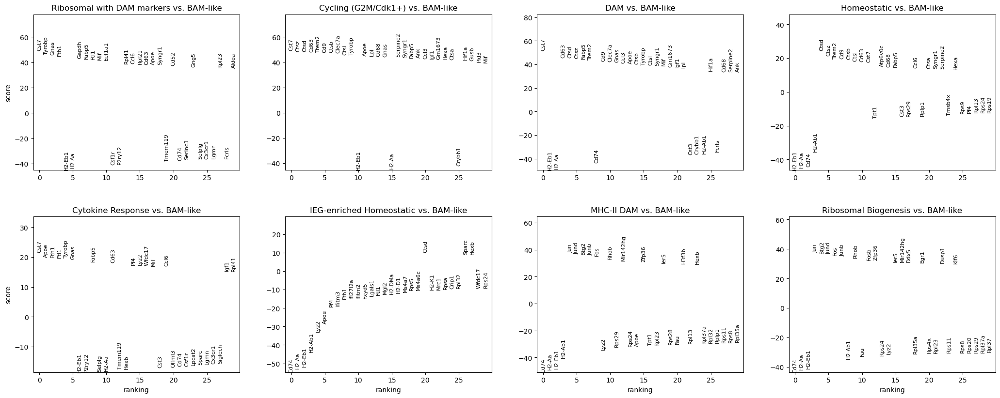

In [47]:
# make sure you’re using the log-normalized layer
adata.X = adata.layers['log_norm'].copy()

# get all the distinct labels
all_labels = adata.obs['anno2'].unique().tolist()

# loop: for each label as reference, compare all the others against it
for ref in all_labels:
    others = [lbl for lbl in all_labels if lbl != ref]
    print(f"\n=== Ranking genes: reference = {ref}; testing groups = {others} ===")

    # compute DE
    sc.tl.rank_genes_groups(
        adata,
        groupby='anno2',
        groups=others,
        reference=ref,
        method='wilcoxon',
        use_raw=False,
        rankby_abs=True  # if you want absolute log-fold changes
    )

    # plot the top 30 genes per tested group
    sc.pl.rank_genes_groups(
        adata,
        groups=others,
        n_genes=30,
        sharey=False,            # prevents y-axis autoscaling across panels
        title=f"vs {ref}",       # puts the reference in the figure title
        show=True
    )

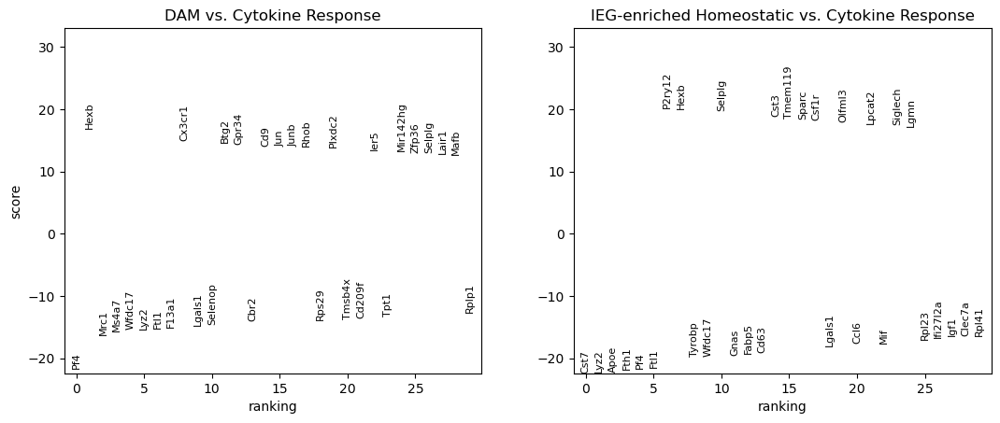

Lowest score for DAM: -7.710023403167725
Lowest score for IEG-enriched Homeostatic: -11.264979362487793
TNFA via NF-κB pathway genes: ['Abca1', 'Ackr3', 'Areg', 'Atf3', 'Atp2b1', 'B4galt1', 'B4galt5', 'Bcl2a1a', 'Bcl2a1b', 'Bcl2a1c', 'Bcl2a1d', 'Bcl3', 'Bcl6', 'Bhlhe40', 'Birc2', 'Birc3', 'Bmp2', 'Bmyc', 'Btg1', 'Btg2', 'Btg3', 'Ccl2', 'Ccl20', 'Ccl4', 'Ccl5', 'Ccn1', 'Ccnd1', 'Ccnl1', 'Ccrl2', 'Cd44', 'Cd69', 'Cd80', 'Cd83', 'Cdkn1a', 'Cebpb', 'Cebpd', 'Cflar', 'Clcf1', 'Csf1', 'Csf2', 'Cxcl10', 'Cxcl5', 'Dennd5a', 'Dnajb4', 'Dram1', 'Dusp1', 'Dusp2', 'Dusp4', 'Dusp5', 'Edn1', 'Efna1', 'Egr1', 'Egr2', 'Egr3', 'Ehd1', 'Ets2', 'F2rl1', 'F3', 'Fjx1', 'Fos', 'Fosb', 'Fosl1', 'Fosl2', 'Fut4', 'G0s2', 'Gadd45a', 'Gadd45b', 'Gch1', 'Gem', 'Gfpt2', 'Gpr183', 'Hbegf', 'Hes1', 'Icam1', 'Icosl', 'Id2', 'Ier2', 'Ier3', 'Ier5', 'Ifih1', 'Ifit2', 'Ifngr2', 'Il12b', 'Il15ra', 'Il18', 'Il1a', 'Il1b', 'Il23a', 'Il6', 'Il6st', 'Il7r', 'Inhba', 'Irf1', 'Irs2', 'Jag1', 'Jun', 'Junb', 'Kdm6b', 'Klf10', 'K

In [48]:
tnfa_nfkb_genes = msigdb_mouse_hallmark[msigdb_mouse_hallmark['geneset'] == 'HALLMARK_TNFA_SIGNALING_VIA_NFKB']['genesymbol'].tolist()


adata.X = adata.layers['log_norm'].copy()

# 1) Pairwise DE vs Cytokine Response for IEG-enriched Homeostatic & DAM
sc.tl.rank_genes_groups(
    adata,
    groupby='anno2',
    groups=['IEG-enriched Homeostatic', 'DAM'],
    reference='Cytokine Response',
    method='wilcoxon',
    use_raw=False,
    rankby_abs=True
)

sc.pl.rank_genes_groups(
    adata,
    groups=['DAM', 'IEG-enriched Homeostatic'],
    n_genes=30,
)

group_ids = ['DAM', 'IEG-enriched Homeostatic']
top_genes = {}

for group_id in group_ids:
    uns = adata.uns['rank_genes_groups']
    scores = uns['scores'][group_id]
    names = uns['names'][group_id]

    df = pd.DataFrame({'gene': names, 'score': scores.astype(float)})
    df_sorted = df.sort_values('score', ascending=True).head(100)
    print(f"Lowest score for {group_id}: {df_sorted['score'].max()}")

    top_genes[group_id] = set(df_sorted['gene'])

unique_to_dam = top_genes['DAM'] - top_genes['IEG-enriched Homeostatic']
unique_to_tim = top_genes['IEG-enriched Homeostatic'] - top_genes['DAM']
shared_genes = top_genes['DAM'] & top_genes['IEG-enriched Homeostatic']
shared_tnfa_nfkb = shared_genes & set(tnfa_nfkb_genes)

print(f"TNFA via NF-κB pathway genes: {sorted(tnfa_nfkb_genes)}\n")
print(f"Genes unique to DAM:\n{sorted(unique_to_dam)}\n")
print(f"Genes unique to IEG-enriched Homeostatic:\n{sorted(unique_to_tim)}\n")
print(f"Genes shared between DAM and IEG-enriched Homeostatic:\n{sorted(shared_genes)}\n")
print(f"Shared in TNF-NF-κB pathway:\n{sorted(shared_tnfa_nfkb)}\n")


# 2) “Vs Rest” DE for all groups
groups_of_interest = ['IEG-enriched Homeostatic', 'DAM', 'Cytokine Response']
sc.tl.rank_genes_groups(
    adata,
    groupby='anno2',
    method='wilcoxon',
    use_raw=False,
    rankby_abs=False,
    n_genes=adata.raw.shape[1] if adata.raw is not None else adata.shape[1]
)

sig_genes_by_group = {}
uns = adata.uns['rank_genes_groups']
for group in groups_of_interest:
    pvals_adj = np.array(uns['pvals_adj'][group])
    gene_names = np.array(uns['names'][group])
    scores = np.array(uns['scores'][group])

    up = set(gene_names[(pvals_adj < 0.05) & (scores > 0)])
    down = set(gene_names[(pvals_adj < 0.05) & (scores < 0)])
    sig_genes_by_group[group] = {'up': up, 'down': down}

tim_up, tim_down = sig_genes_by_group['IEG-enriched Homeostatic'].values()
dam_up, dam_down = sig_genes_by_group['DAM'].values()
cyt_up, cyt_down = sig_genes_by_group['Cytokine Response'].values()

print(f"UP shared by all: {len(tim_up & dam_up & cyt_up)}")
print(f"UP TIM & Cyt: {len(tim_up & cyt_up)}")
print(f"UP DAM & Cyt: {len(dam_up & cyt_up)}")
print(f"UP unique Cyt: {len(cyt_up - (tim_up | dam_up))}\n")

print(f"DOWN shared by all: {len(tim_down & dam_down & cyt_down)}")
print(f"DOWN TIM & Cyt: {len(tim_down & cyt_down)}")
print(f"DOWN DAM & Cyt: {len(dam_down & cyt_down)}")
print(f"DOWN unique Cyt: {len(cyt_down - (tim_down | dam_down))}\n")


# 3) Pairwise vs Cytokine Response (signed) and inline overlap comparison
sc.tl.rank_genes_groups(
    adata,
    groupby='anno2',
    groups=['IEG-enriched Homeostatic', 'DAM'],
    reference='Cytokine Response',
    method='wilcoxon',
    use_raw=False,
    rankby_abs=False
)

# extract pairwise DE
uns = adata.uns['rank_genes_groups']
pairwise_sig = {}
for group in ['IEG-enriched Homeostatic', 'DAM']:
    pvals_adj = np.array(uns['pvals_adj'][group])
    names = np.array(uns['names'][group])
    scores = np.array(uns['scores'][group])
    up = set(names[(pvals_adj < 0.05) & (scores > 0)])
    down = set(names[(pvals_adj < 0.05) & (scores < 0)])
    pairwise_sig[group] = {'up': up, 'down': down}

# inline overlap for IEG-enriched Homeostatic
tim_up_pair = pairwise_sig['IEG-enriched Homeostatic']['up']
tim_down_pair = pairwise_sig['IEG-enriched Homeostatic']['down']
print("--- IEG-enriched Homeostatic vs Cytokine Response ---")
print(f"UP overlap: {len(tim_up & tim_up_pair)} | rest only: {len(tim_up - tim_up_pair)} | pair only: {len(tim_up_pair - tim_up)}")
print(f"DOWN overlap: {len(tim_down & tim_down_pair)} | rest only: {len(tim_down - tim_down_pair)} | pair only: {len(tim_down_pair - tim_down)}\n")

# inline overlap for DAM
dam_up_pair = pairwise_sig['DAM']['up']
dam_down_pair = pairwise_sig['DAM']['down']
print("--- DAM vs Cytokine Response ---")
print(f"UP overlap: {len(dam_up & dam_up_pair)} | rest only: {len(dam_up - dam_up_pair)} | pair only: {len(dam_up_pair - dam_up)}")
print(f"DOWN overlap: {len(dam_down & dam_down_pair)} | rest only: {len(dam_down - dam_down_pair)} | pair only: {len(dam_down_pair - dam_down)}\n")


# 4) Optional TNF/NF-κB pathway hits
if 'tnfa_nfkb_genes' in globals():
    for group, label in zip(groups_of_interest, ['TIM','DAM','Cytokine']):
        up_hits = sig_genes_by_group[group]['up'] & set(tnfa_nfkb_genes)
        down_hits = sig_genes_by_group[group]['down'] & set(tnfa_nfkb_genes)
        print(f"{label}: {len(up_hits)} TNF/NF-κB UP, {len(down_hits)} DOWN")

In [49]:
genes = [
    'Ccl3', 'Ccl4',
    'Nfkbia', 'Nfkbiz',
    'Il1a', 'Il1b',
    'Tnf', 'Tnfaip3',
    'Atf3', 'Gadd45b',
    'Ccrl2', 'Bcl2a1b',
    'Tlr2', 'Zfp36',
    'Cd83', 'Csf1',
]

# Ensure that adata.X contains the log-normalized data
adata.X = adata.layers['log_norm'].copy()

for gene in genes:
    fig = sc.pl.umap(
        adata,
        color=[gene],
        size=50,
        use_raw=False,
        add_outline=False,
        vmax=5,
        return_fig=True
    )
    fig.savefig(str(FIG_DIR/f'umap_{gene}.pdf'), dpi=300, bbox_inches='tight', transparent=True)
    plt.close(fig)

    fig, ax = plt.subplots(figsize=(6, 4))
    sc.pl.violin(
        adata,
        [gene],
        groupby='anno2',
        use_raw=False,
        rotation=90,
        stripplot=False,
        ylabel=None,
        ax=ax,
        show=False,
    )

    # Add title
    ax.set_title(gene, fontsize=12)
    
    # Adjust x-axis tick label font size
    ax.tick_params(axis='x', labelsize=8)  # Adjust this number to your needs

    fig.savefig(str(FIG_DIR/f'violin_{gene}.pdf'), dpi=300, bbox_inches='tight', transparent=True)
    plt.close(fig)

# Wilcoxon DEGs 

In [50]:

for adata_subset in adata_subs:
    adata_subset.X = adata_subset.layers['log_norm'].copy()
    sc.tl.rank_genes_groups(adata_subset, groupby='treatment', method='wilcoxon')

/opt/homebrew/Caskroom/mambaforge/envs/sc_env3_omni/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:380: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
/opt/homebrew/Caskroom/mambaforge/envs/sc_env3_omni/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:380: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
/opt/homebrew/Caskroom/mambaforge/envs/sc_env3_omni/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:380: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
/opt/homebrew/Caskroom/mambaforge/envs/sc_env3_omni/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:380: RuntimeWarning: invalid value encountered in divide
  scores[group_index, :] = (
/opt/homebrew/Caskroom/mambaforge/envs/sc_env3_omni/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:380: RuntimeWarning: invalid value encountered in divide
  scores[group_inde

In [51]:
# e3fad_LPS_sig_genes = f.plot_volcano(adata_e3fad, group='LPS', logfc_threshold=0.25, pval_threshold=0.05, top_n=200 )

# print(f"Up-Regulated {len(e3fad_LPS_sig_genes['Up-regulated'])}: {e3fad_LPS_sig_genes['Up-regulated']}")
# print(f"Down-Regulated {len(e3fad_LPS_sig_genes['Down-regulated'])} : {e3fad_LPS_sig_genes['Down-regulated']}")


In [52]:
# e4fad_LPS_sig_genes = f.plot_volcano(adata_e4fad, group='LPS', logfc_threshold=0.1, pval_threshold=0.05, top_n=15 )

# print(f"Up-Regulated {len(e4fad_LPS_sig_genes['Up-regulated'])} : {e4fad_LPS_sig_genes['Up-regulated']}")
# print(f"Down-Regulated {len(e4fad_LPS_sig_genes['Down-regulated'])} : {e4fad_LPS_sig_genes['Down-regulated']}")

# Cell Type Visualizations

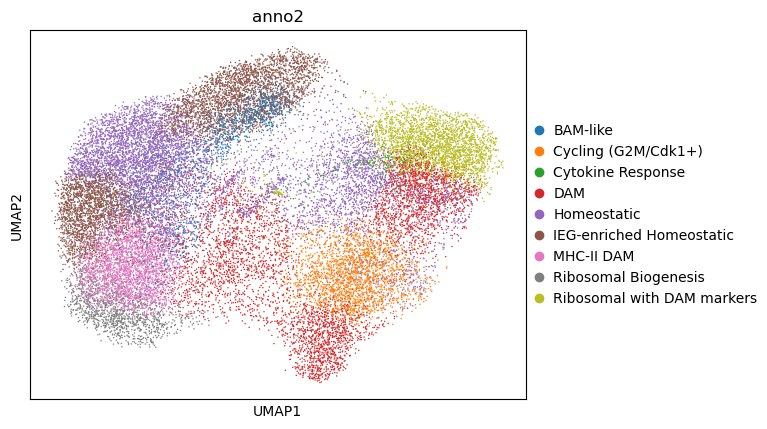

In [53]:
sc.pl.umap(adata, color='anno2')

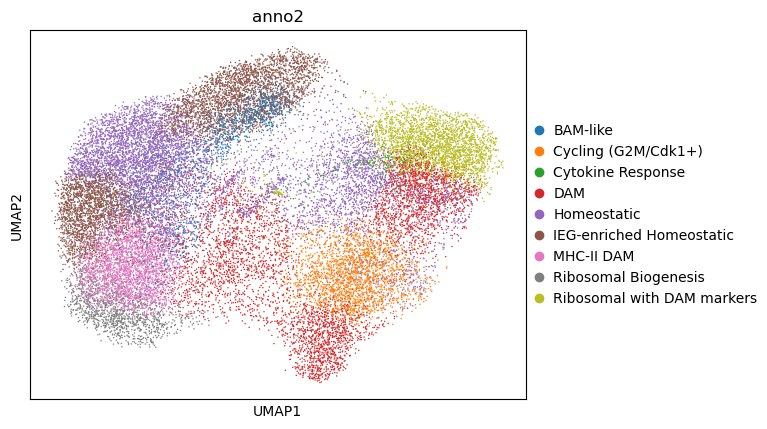

In [54]:

sc.pl.umap(adata, color='anno2')

... storing 'anno2' as categorical
... storing 'anno2' as categorical
... storing 'anno2' as categorical
... storing 'anno2' as categorical
... storing 'anno2' as categorical
... storing 'anno2' as categorical
... storing 'anno2' as categorical
... storing 'anno2' as categorical
... storing 'anno2' as categorical


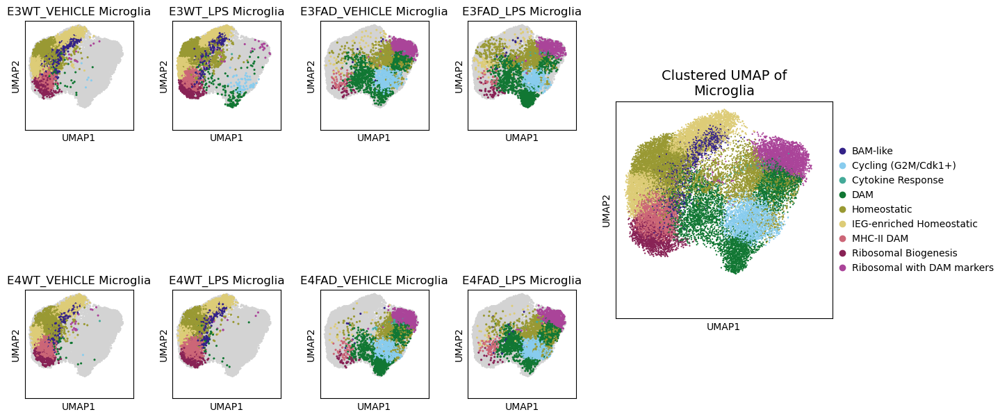

In [55]:
# Define the desired order of categories
desired_order = [
    'E3WT_VEHICLE', 'E4WT_VEHICLE', 'E3WT_LPS', 'E4WT_LPS', 
    'E3FAD_VEHICLE', 'E4FAD_VEHICLE', 'E3FAD_LPS', 'E4FAD_LPS'
]

# Create a contingency table (crosstab) of counts
counts = pd.crosstab(
    adata.obs['genotype_treatment'],
    adata.obs['anno2']
)

# Compute proportions by dividing each count by the row sum
proportions = counts.div(counts.sum(axis=1), axis=0)

#Get colors for the cell clusters
custom_colors = [
    "#332288",  # dark blue
    "#88CCEE",  # light blue
    "#44AA99",  # teal
    "#117733",  # dark green
    "#999933",  # olive
    "#DDCC77",  # sand
    "#CC6677",  # pink
    "#882255",  # dark red
    "#AA4499",  # magenta
    "#661100",  # brown
    "#6699CC",  # steel blue
    "#AA4466",  # rose
    "#4477AA",  # slate blue
    "#77AADD",  # sky blue
    "#DDAA33",  # orange
]


# Ensure you only use as many colors as there are cell types
num_cell_types = proportions.shape[1]
colors = custom_colors[:num_cell_types]


# Enforce the order on the 'genotype_treatment' column
adata.obs['genotype_treatment'] = pd.Categorical(
    adata.obs['genotype_treatment'],
    categories=desired_order,
    ordered=True
)

# Get the categories directly from the Categorical object
categories = adata.obs['genotype_treatment'].cat.categories.tolist()
n_categories = len(categories)

# Determine the number of columns needed for the category UMAPs
n_category_cols = ceil(n_categories / 2)

# Set up the figure and gridspec with adjusted spacing
fig = plt.figure(figsize=(15, 10), constrained_layout=False)
width_ratios = [1]*n_category_cols + [2]  # General UMAP is wider and on the right
gs = fig.add_gridspec(nrows=2, ncols=n_category_cols + 1, width_ratios=width_ratios)

# Adjust the spacing between subplots
fig.subplots_adjust(hspace=0.01, wspace=0.3)  # Reduce hspace and wspace for better layout

# Create the general UMAP axes on the right
ax_general = fig.add_subplot(gs[:, -1])  # Spans both rows, last column

# Plot the general UMAP
assign_cell_types2(adata)
sc.pl.umap(
    adata,
    color='anno2',
    size=10,
    palette=colors,
    title='Clustered UMAP of\nMicroglia',  # Added newline
    ax=ax_general,
    show=False,  # Prevents the plot from displaying immediately
)
# Set aspect ratio to 'equal' to make the plot square
ax_general.set_aspect('equal')

# Optionally, set x and y limits to be the same for the general UMAP
xlim = ax_general.get_xlim()
ylim = ax_general.get_ylim()
min_limit = min(xlim[0], ylim[0])
max_limit = max(xlim[1], ylim[1])
ax_general.set_xlim(min_limit, max_limit)
ax_general.set_ylim(min_limit, max_limit)

# Adjust the title font size for the general UMAP
ax_general.set_title(ax_general.get_title(), fontsize=14)

# Now plot the category UMAPs without legends
for idx, cat in enumerate(categories):
    # Compute row and column positions
    row = idx % 2
    col = idx // 2  # Category plots occupy the first n_category_cols columns
    ax = fig.add_subplot(gs[row, col])

    # Plot UMAP for the current category
    assign_cell_types2(adata)
    sc.pl.umap(
        adata,
        color='anno2',
        palette=colors,
        groups=None,
        mask_obs=(adata.obs['genotype_treatment'] == cat),
        size=20,
        title=f'{cat} Microglia',  # Added newline
        ax=ax,
        show=False,   # Prevents individual plots from showing
        legend_loc='none'  # Removes the legend
    )
    # Set aspect ratio to 'equal' to make the plot square
    ax.set_aspect('equal')

    # Optionally, set x and y limits to be the same
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    min_limit = min(xlim[0], ylim[0])
    max_limit = max(xlim[1], ylim[1])
    ax.set_xlim(min_limit, max_limit)
    ax.set_ylim(min_limit, max_limit)

    # Adjust the title font size to prevent overlap
    ax.set_title(ax.get_title(), fontsize=12)

# # Save and show the figure
plt.savefig(str(FIG_DIR / "clustered_umap_all.pdf"),transparent=True,bbox_inches="tight")
plt.show()
plt.close()

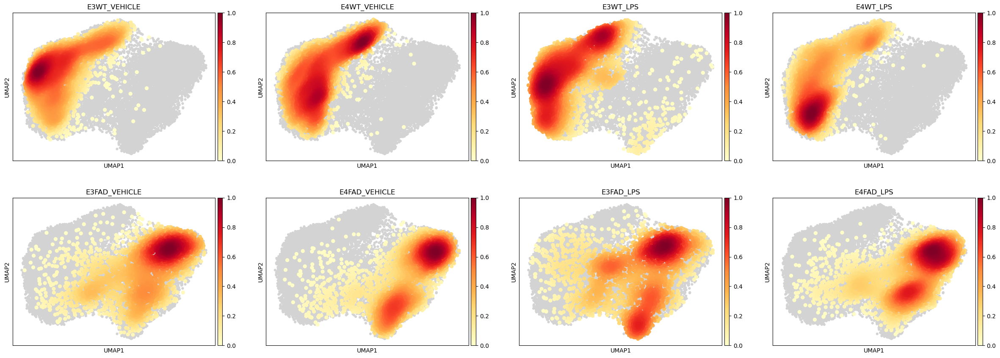

In [56]:
# Density plots for each genotype_treatment group
sc.tl.embedding_density(adata, basis='umap', groupby='genotype_treatment', key_added='umap_density_genotype_treatment')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_genotype_treatment', ncols=4, show=True, return_fig=True)

plt.savefig(str(FIG_DIR/"density_umap_genotype.pdf"), transparent=True, bbox_inches='tight')

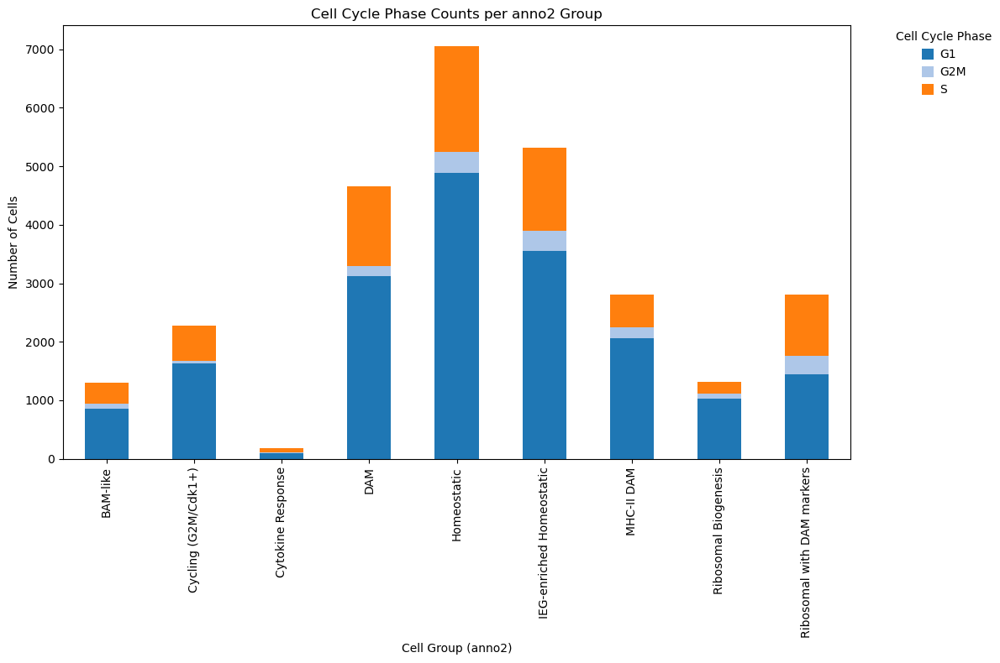

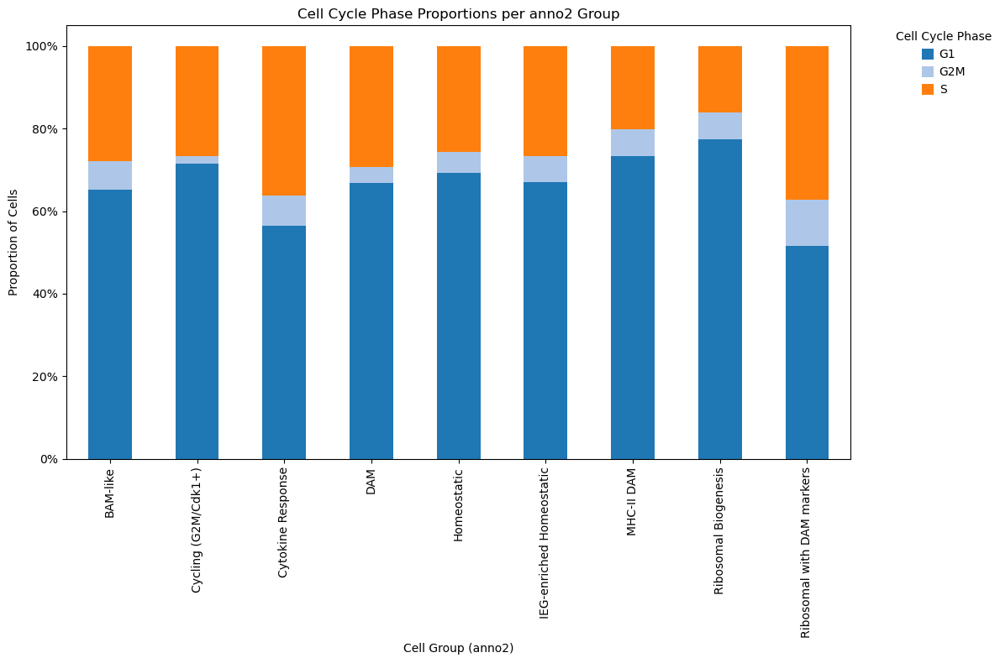

In [57]:


# create and save stacked counts bar chart
counts = pd.crosstab(adata.obs['anno2'], adata.obs['phase'])
colors = plt.get_cmap('tab20').colors[:counts.shape[1]]
ax = counts.plot(
    kind='bar',
    stacked=True,
    color=colors,
    figsize=(12, 8)
)
plt.xlabel('Cell Group (anno2)')
plt.ylabel('Number of Cells')
plt.title('Cell Cycle Phase Counts per anno2 Group')
plt.legend(title='Cell Cycle Phase', bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
plt.tight_layout()
plt.savefig(str(FIG_DIR / 'phase_counts_per_anno2.pdf'), transparent=True, bbox_inches='tight')
plt.show()
plt.close()
del counts

# create and save stacked proportions bar chart
counts = pd.crosstab(adata.obs['anno2'], adata.obs['phase'])
proportions = counts.div(counts.sum(axis=1), axis=0)
colors = plt.get_cmap('tab20').colors[:proportions.shape[1]]
ax = proportions.plot(
    kind='bar',
    stacked=True,
    color=colors,
    figsize=(12, 8)
)
plt.xlabel('Cell Group (anno2)')
plt.ylabel('Proportion of Cells')
plt.title('Cell Cycle Phase Proportions per anno2 Group')
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
plt.legend(title='Cell Cycle Phase', bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
plt.tight_layout()
plt.savefig(str(FIG_DIR / 'phase_proportions_per_anno2.pdf'), transparent=True, bbox_inches='tight')
plt.show()
plt.close()
del proportions, counts

anno2               BAM-like  Cycling (G2M/Cdk1+)  Cytokine Response   DAM  \
genotype_treatment                                                           
E3WT_VEHICLE             389                    5                  0    41   
E4WT_VEHICLE             282                    2                  1    31   
E3WT_LPS                 307                   69                  1   170   
E4WT_LPS                 280                    0                  0    31   
E3FAD_VEHICLE              8                  439                 40   936   
E4FAD_VEHICLE              7                  597                 33  1162   
E3FAD_LPS                 11                  381                 49  1039   
E4FAD_LPS                 20                  788                 53  1250   

anno2               Homeostatic  IEG-enriched Homeostatic  MHC-II DAM  \
genotype_treatment                                                      
E3WT_VEHICLE               1397                      1483         506   


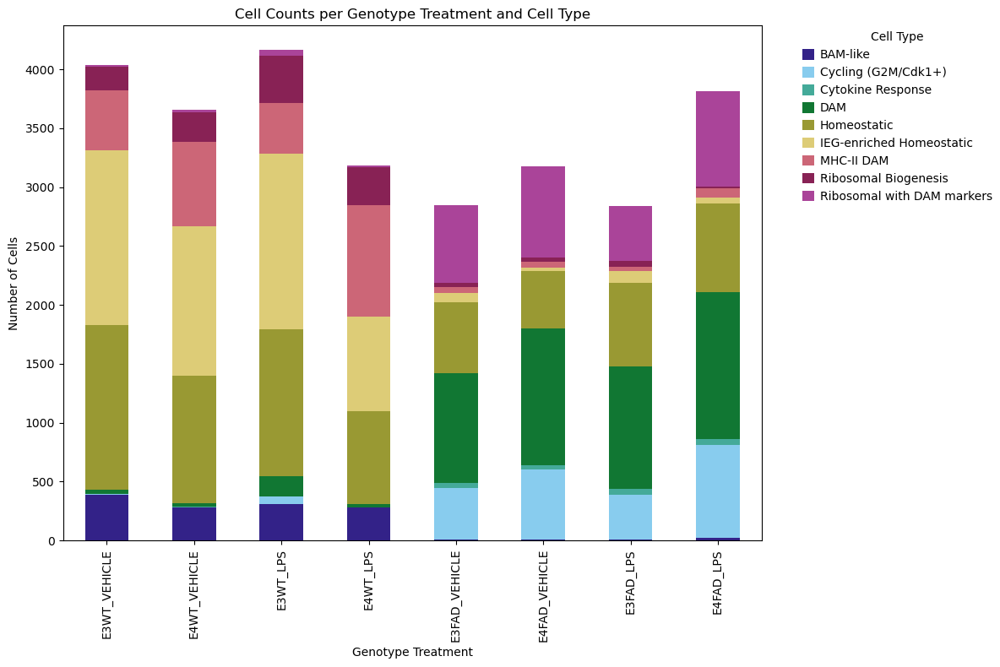

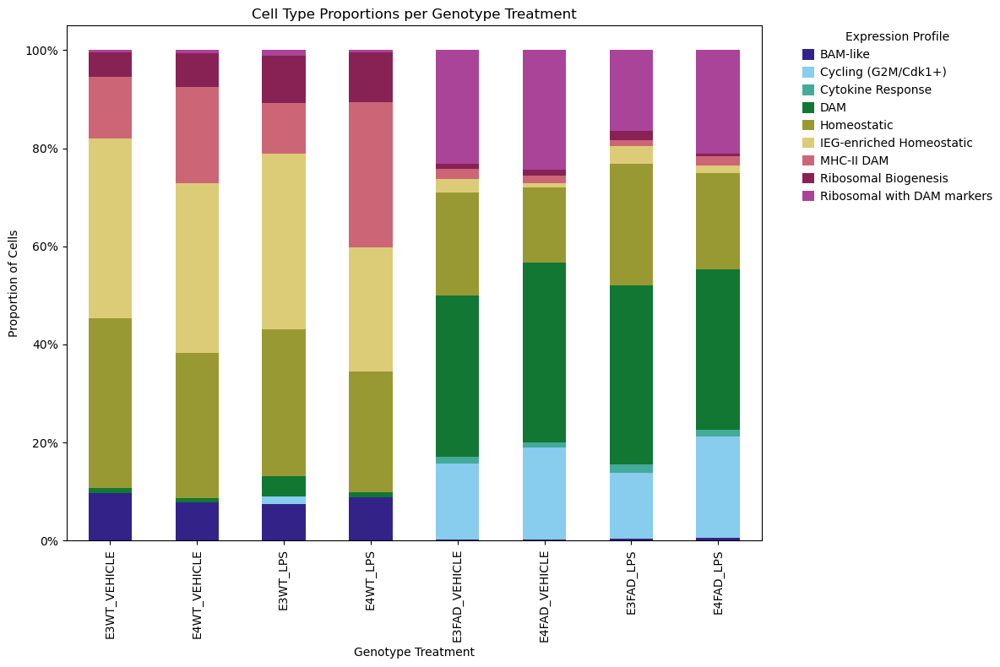

In [58]:

assign_cell_types2(adata)

# build contingency tables
counts = pd.crosstab(adata.obs['genotype_treatment'], adata.obs['anno2'])
print(counts)
proportions = counts.div(counts.sum(axis=1), axis=0)
print(proportions)

# colors
colors = custom_colors[:num_cell_types]

# plot and save raw counts
ax = counts.plot(kind='bar', stacked=True, color=colors, figsize=(12, 8))
plt.xlabel('Genotype Treatment')
plt.ylabel('Number of Cells')
plt.title('Cell Counts per Genotype Treatment and Cell Type')
plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
plt.tight_layout()
plt.savefig(str(FIG_DIR / 'stacked_bar_chart_counts.pdf'), transparent=True, bbox_inches='tight')
plt.show()
plt.close()

# plot and save proportions
ax = proportions.plot(kind='bar', stacked=True, color=colors, figsize=(12, 8))
plt.xlabel('Genotype Treatment')
plt.ylabel('Proportion of Cells')
plt.title('Cell Type Proportions per Genotype Treatment')
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
plt.legend(title='Expression Profile', bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
plt.tight_layout()
plt.savefig(str(FIG_DIR / 'stacked_bar_chart_proportions.pdf'), transparent=True, bbox_inches='tight')
plt.show()
plt.close()

del counts, proportions

# Proportions ANOVA & Tukey

Processing cell type: Ribosomal with DAM markers
Three-Way ANOVA Results for cell type Ribosomal with DAM markers:
                                      sum_sq    df           F        PR(>F)
C(apoe)                            19.896730   1.0    1.995722  1.717354e-01
C(disease)                       3266.473258   1.0  327.640315  1.060505e-14
C(treatment)                       44.216968   1.0    4.435138  4.684407e-02
C(apoe):C(disease)                 19.503505   1.0    1.956280  1.758515e-01
C(apoe):C(treatment)                3.955136   1.0    0.396716  5.352776e-01
C(disease):C(treatment)            45.878627   1.0    4.601810  4.323360e-02
C(apoe):C(disease):C(treatment)     7.758055   1.0    0.778164  3.872403e-01
Residual                          219.333239  22.0         NaN           NaN

OLS Model Summary:
                            OLS Regression Results                            
Dep. Variable:                percent   R-squared:                       0.940
Model:        

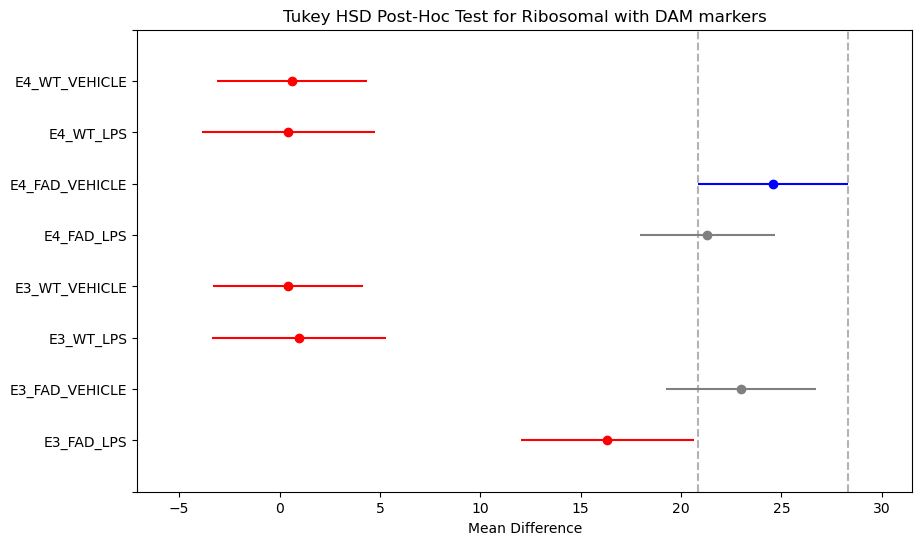

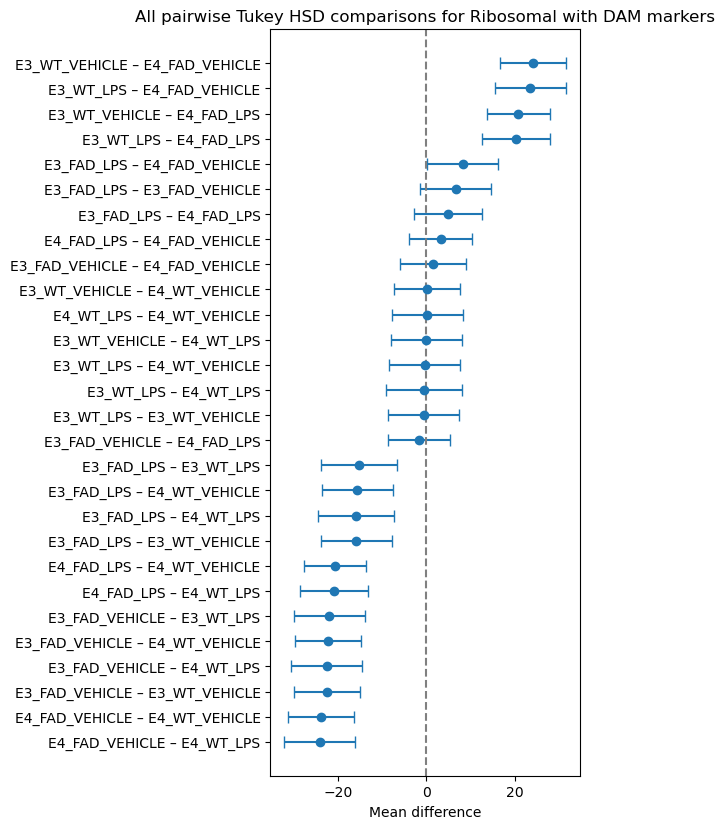

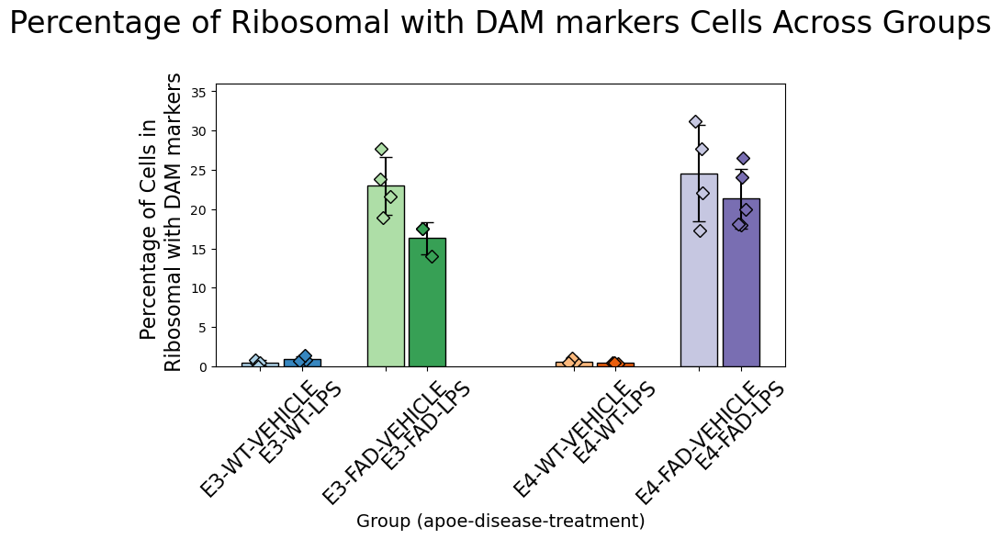

Processing cell type: Cycling (G2M/Cdk1+)
Three-Way ANOVA Results for cell type Cycling (G2M/Cdk1+):
                                      sum_sq    df           F        PR(>F)
C(apoe)                            42.341661   1.0    6.246614  2.039729e-02
C(disease)                       2137.482496   1.0  315.340202  1.574294e-14
C(treatment)                        2.041921   1.0    0.301242  5.886324e-01
C(apoe):C(disease)                 54.591177   1.0    8.053770  9.572936e-03
C(apoe):C(treatment)                2.226790   1.0    0.328516  5.723471e-01
C(disease):C(treatment)             0.010208   1.0    0.001506  9.693950e-01
C(apoe):C(disease):C(treatment)     7.169676   1.0    1.057734  3.149081e-01
Residual                          149.123437  22.0         NaN           NaN

OLS Model Summary:
                            OLS Regression Results                            
Dep. Variable:                percent   R-squared:                       0.940
Model:                      

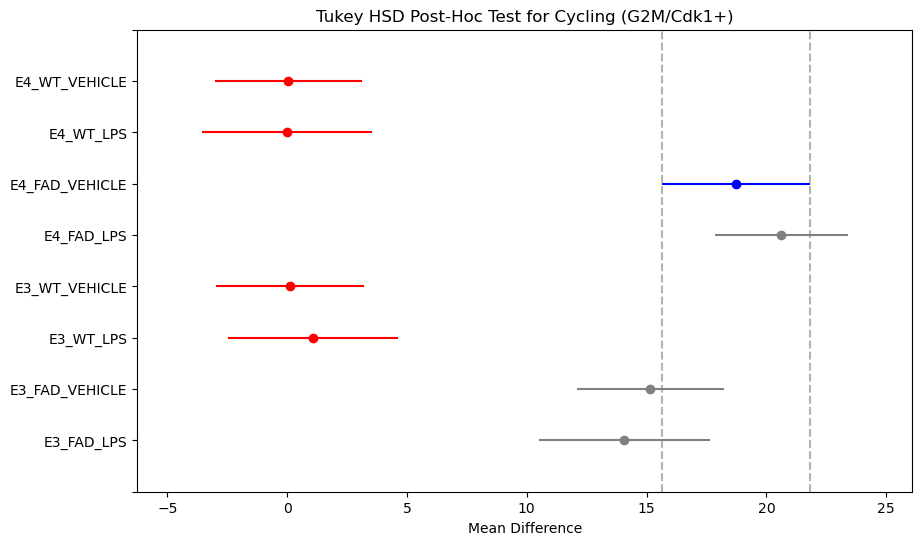

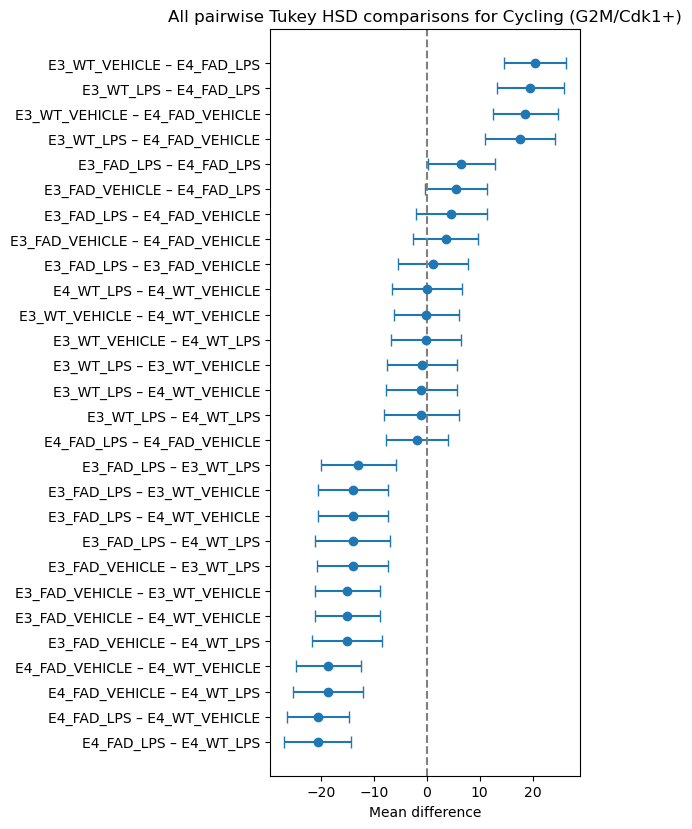

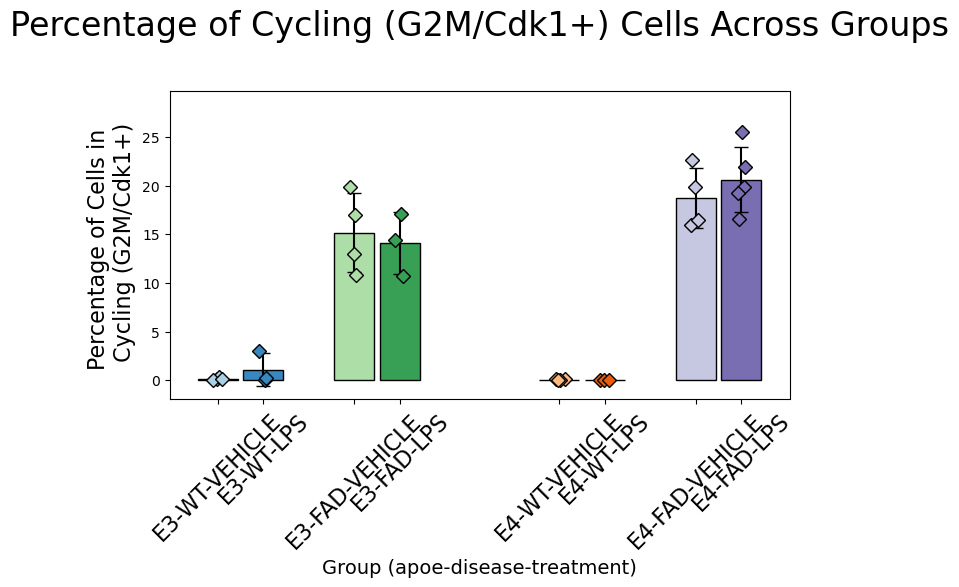

Processing cell type: DAM
Three-Way ANOVA Results for cell type DAM:
                                      sum_sq    df           F        PR(>F)
C(apoe)                             0.005427   1.0    0.000271  9.870158e-01
C(disease)                       7865.814702   1.0  392.702387  1.614994e-15
C(treatment)                        0.102449   1.0    0.005115  9.436319e-01
C(apoe):C(disease)                  7.956260   1.0    0.397218  5.350218e-01
C(apoe):C(treatment)               24.758629   1.0    1.236080  2.782305e-01
C(disease):C(treatment)             7.586333   1.0    0.378749  5.445879e-01
C(apoe):C(disease):C(treatment)     4.907736   1.0    0.245020  6.255115e-01
Residual                          440.659209  22.0         NaN           NaN

OLS Model Summary:
                            OLS Regression Results                            
Dep. Variable:                percent   R-squared:                       0.947
Model:                            OLS   Adj. R-squared:     

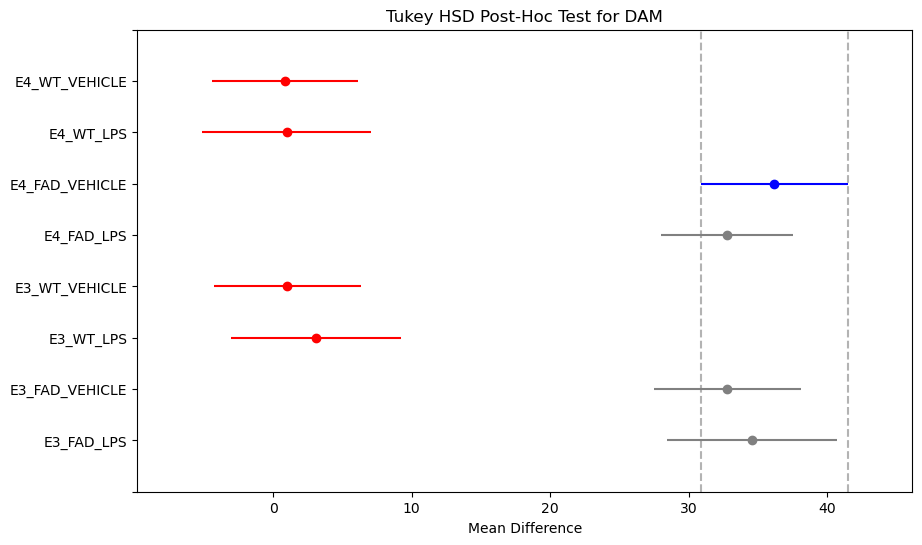

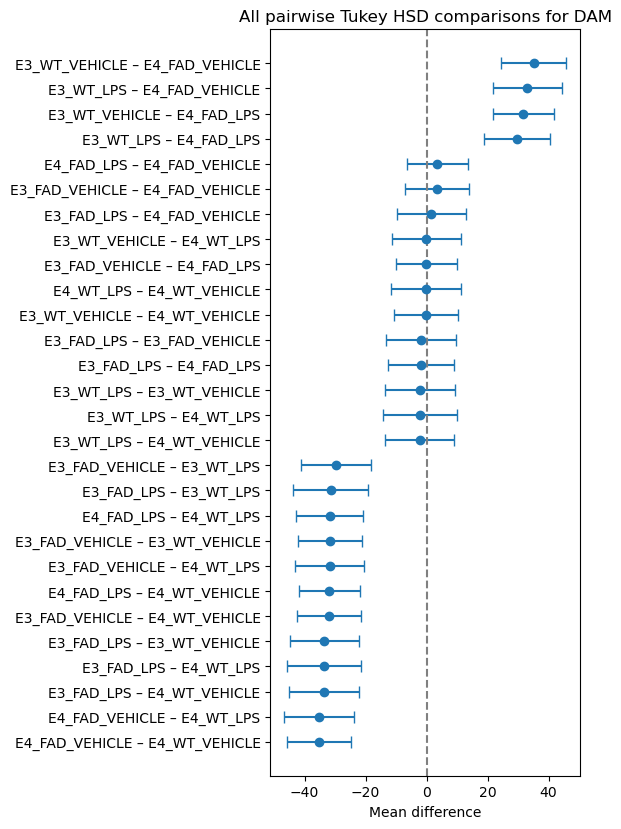

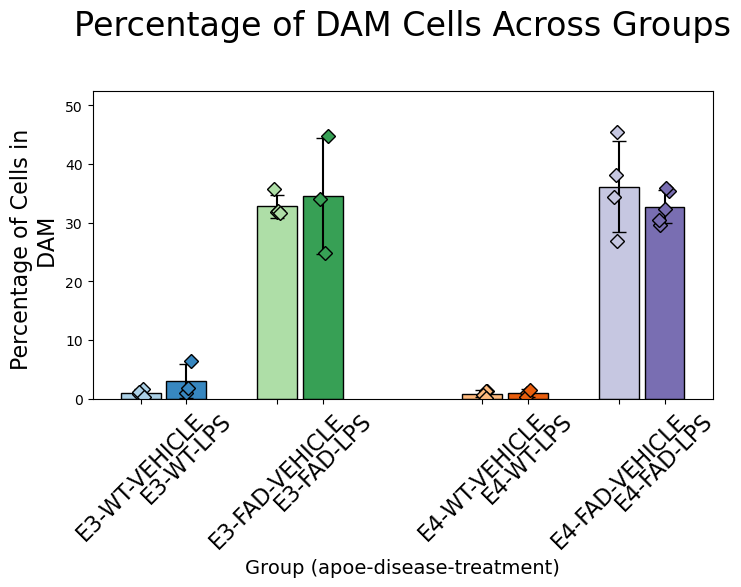

Processing cell type: Homeostatic
Three-Way ANOVA Results for cell type Homeostatic:
                                      sum_sq    df          F    PR(>F)
C(apoe)                           284.127824   1.0   5.580740  0.027422
C(disease)                        794.206751   1.0  15.599534  0.000682
C(treatment)                        3.639420   1.0   0.071484  0.791678
C(apoe):C(disease)                  0.481719   1.0   0.009462  0.923391
C(apoe):C(treatment)                7.622437   1.0   0.149717  0.702523
C(disease):C(treatment)           111.872784   1.0   2.197367  0.152430
C(apoe):C(disease):C(treatment)     4.155155   1.0   0.081614  0.777794
Residual                         1120.068593  22.0        NaN       NaN

OLS Model Summary:
                            OLS Regression Results                            
Dep. Variable:                percent   R-squared:                       0.527
Model:                            OLS   Adj. R-squared:                  0.377
Method:   

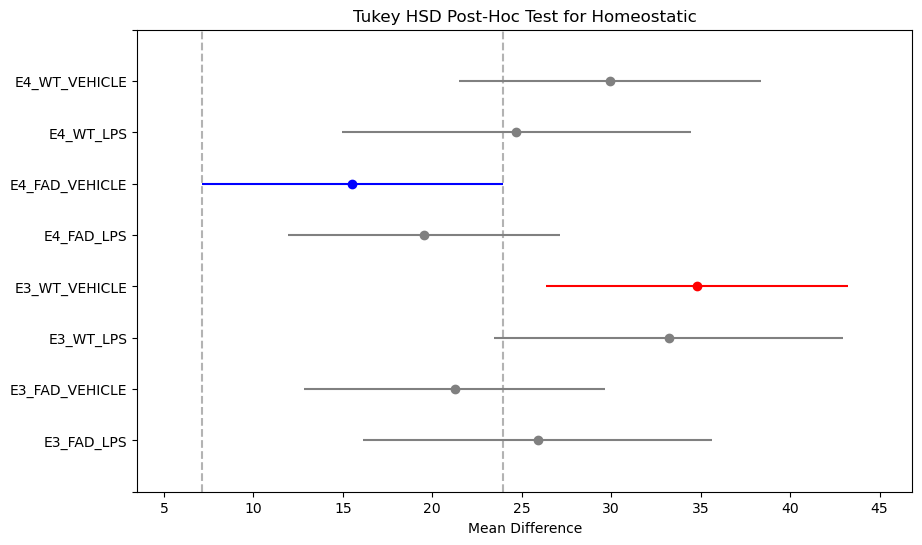

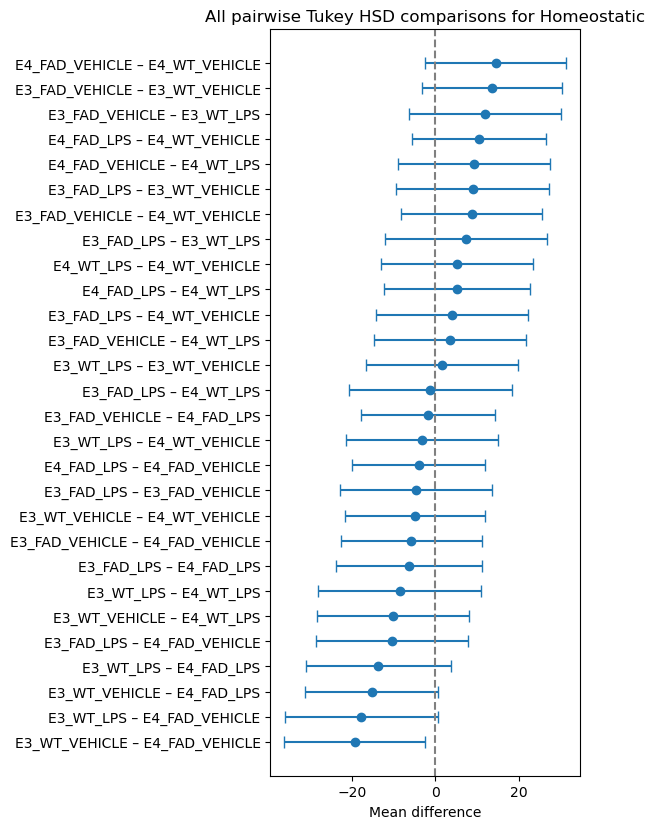

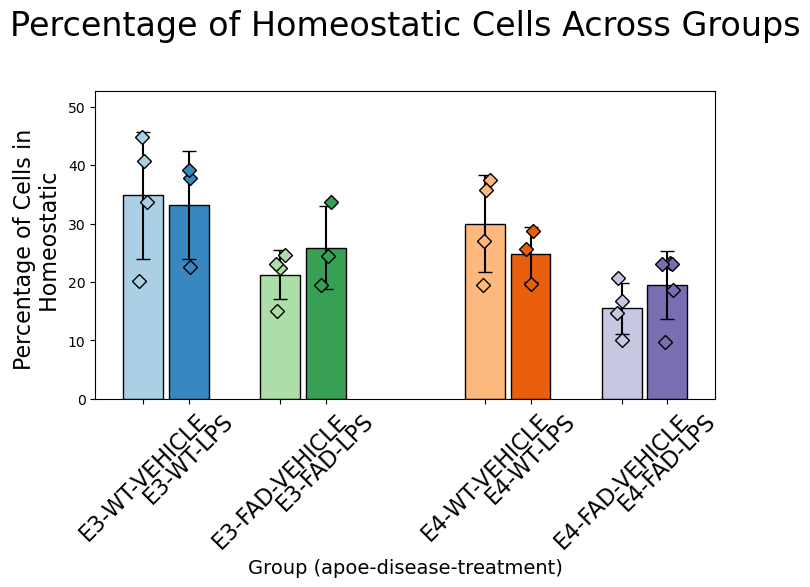

Processing cell type: Cytokine Response
Three-Way ANOVA Results for cell type Cytokine Response:
                                    sum_sq    df          F    PR(>F)
C(apoe)                           0.267809   1.0   0.724525  0.403834
C(disease)                       14.854181   1.0  40.186175  0.000002
C(treatment)                      0.358673   1.0   0.970347  0.335304
C(apoe):C(disease)                0.258884   1.0   0.700378  0.411656
C(apoe):C(treatment)              0.021101   1.0   0.057086  0.813375
C(disease):C(treatment)           0.341661   1.0   0.924323  0.346791
C(apoe):C(disease):C(treatment)   0.006570   1.0   0.017773  0.895155
Residual                          8.131950  22.0        NaN       NaN

OLS Model Summary:
                            OLS Regression Results                            
Dep. Variable:                percent   R-squared:                       0.665
Model:                            OLS   Adj. R-squared:                  0.559
Method:         

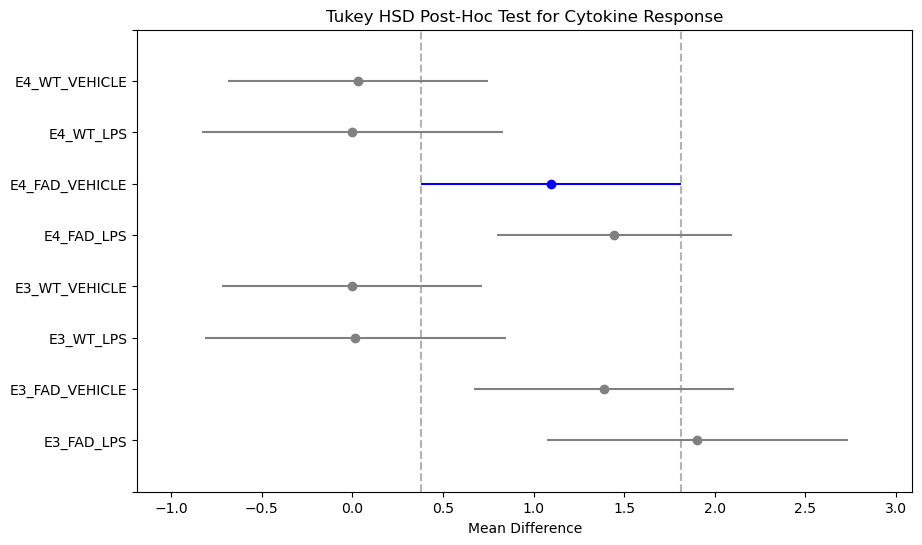

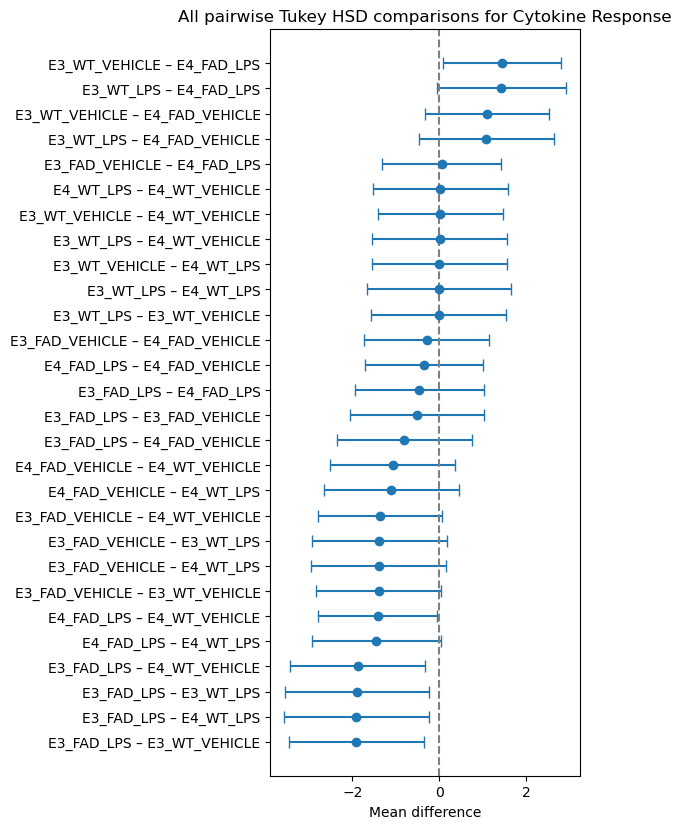

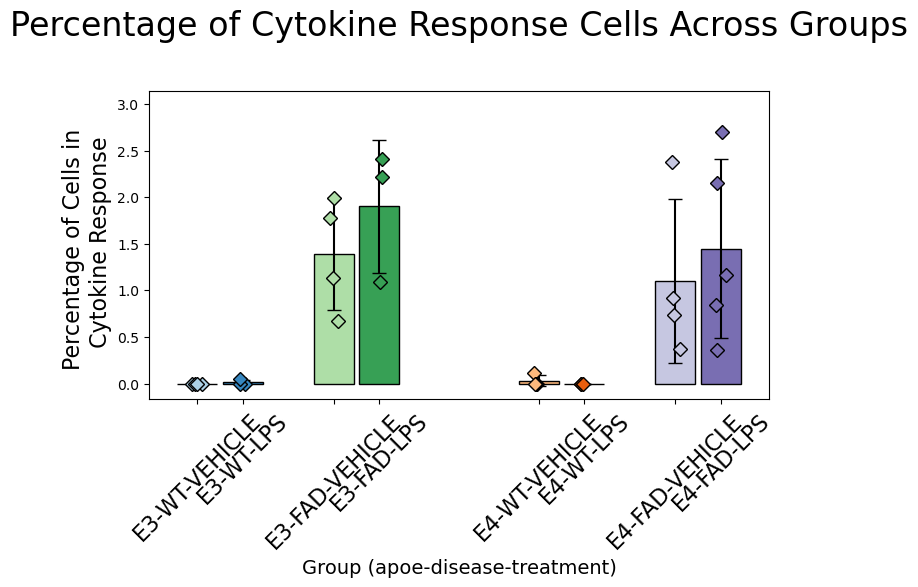

Processing cell type: IEG-enriched Homeostatic
Three-Way ANOVA Results for cell type IEG-enriched Homeostatic:
                                      sum_sq    df           F        PR(>F)
C(apoe)                           149.143802   1.0    5.083293  3.444842e-02
C(disease)                       7309.002115   1.0  249.113956  1.756168e-13
C(treatment)                       13.170363   1.0    0.448888  5.098356e-01
C(apoe):C(disease)                 44.078901   1.0    1.502349  2.332701e-01
C(apoe):C(treatment)               57.744497   1.0    1.968115  1.746038e-01
C(disease):C(treatment)            48.782593   1.0    1.662665  2.106361e-01
C(apoe):C(disease):C(treatment)    45.032430   1.0    1.534848  2.284420e-01
Residual                          645.479880  22.0         NaN           NaN

OLS Model Summary:
                            OLS Regression Results                            
Dep. Variable:                percent   R-squared:                       0.925
Model:            

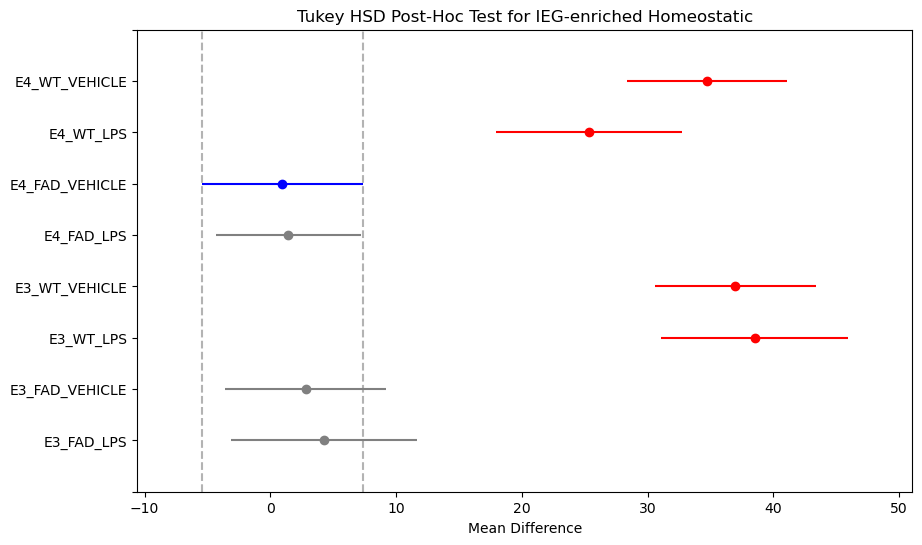

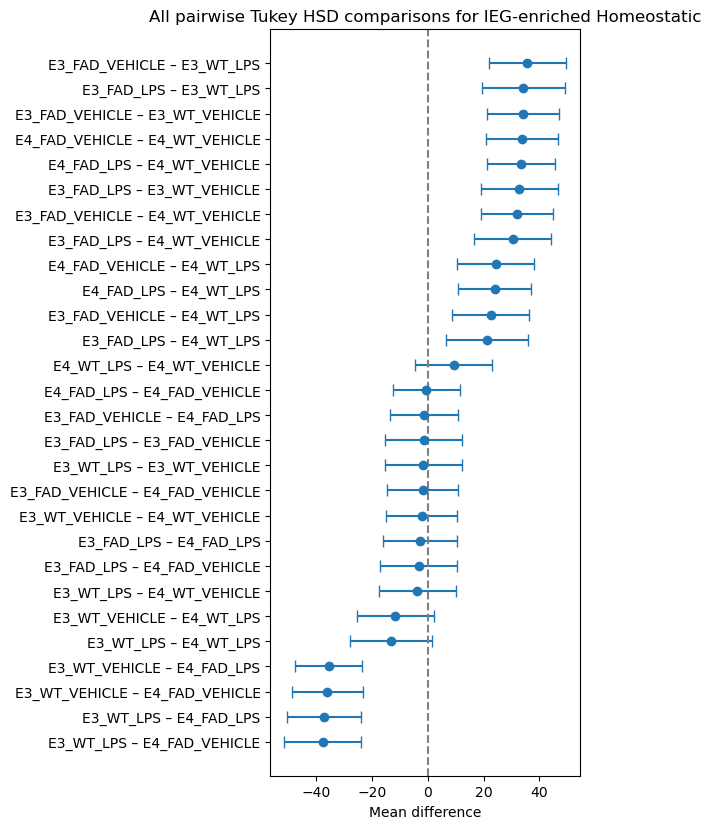

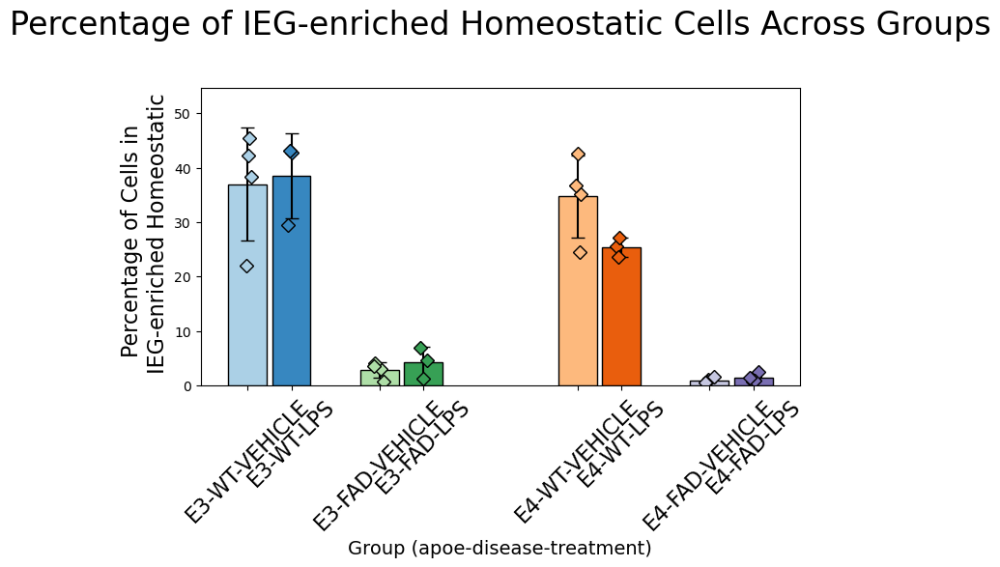

Processing cell type: MHC-II DAM
Three-Way ANOVA Results for cell type MHC-II DAM:
                                      sum_sq    df          F    PR(>F)
C(apoe)                           300.104548   1.0   4.472659  0.046002
C(disease)                       1894.911820   1.0  28.241136  0.000025
C(treatment)                       14.198276   1.0   0.211606  0.650025
C(apoe):C(disease)                334.221347   1.0   4.981124  0.036130
C(apoe):C(treatment)               95.639685   1.0   1.425382  0.245235
C(disease):C(treatment)            27.110506   1.0   0.404046  0.531564
C(apoe):C(disease):C(treatment)    71.597505   1.0   1.067065  0.312832
Residual                         1476.146691  22.0        NaN       NaN

OLS Model Summary:
                            OLS Regression Results                            
Dep. Variable:                percent   R-squared:                       0.636
Model:                            OLS   Adj. R-squared:                  0.521
Method:     

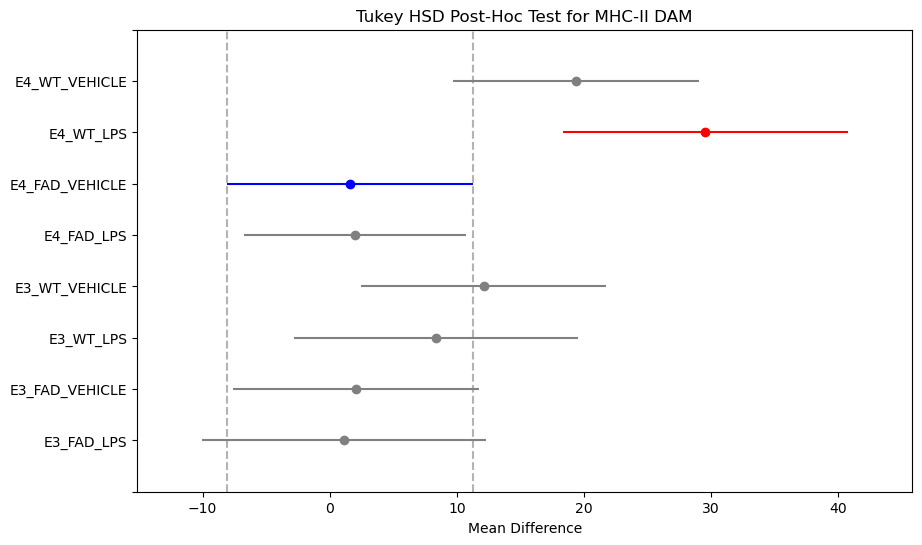

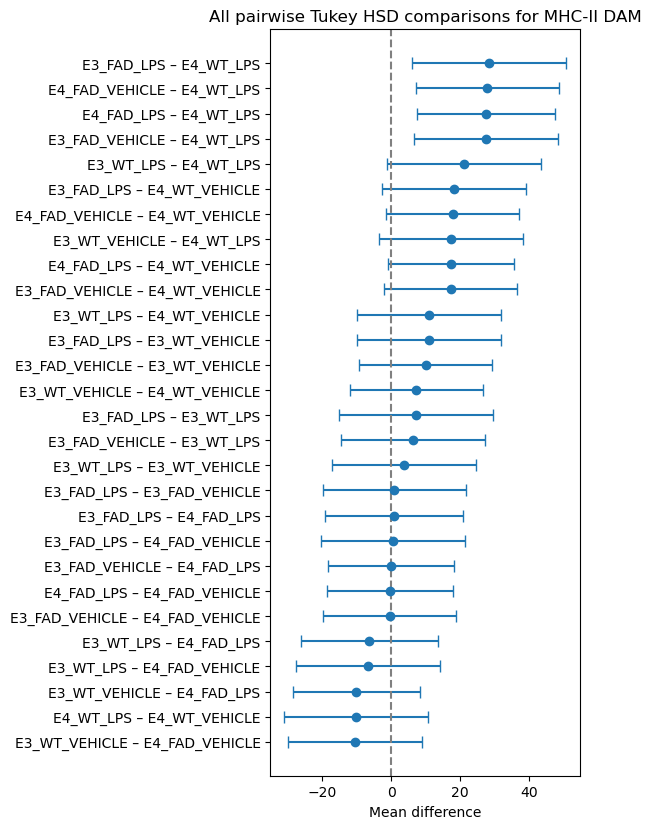

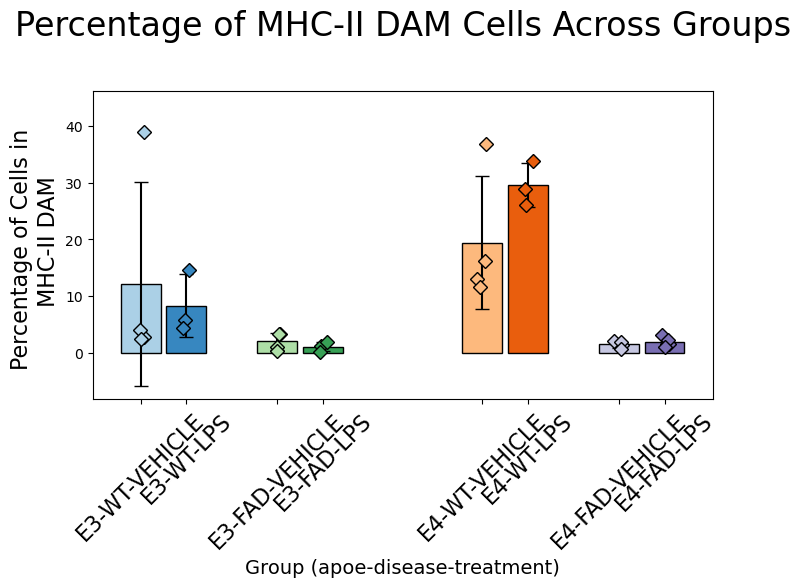

Processing cell type: Ribosomal Biogenesis
Three-Way ANOVA Results for cell type Ribosomal Biogenesis:
                                     sum_sq    df          F    PR(>F)
C(apoe)                            3.892408   1.0   0.443908  0.512169
C(disease)                       287.474548   1.0  32.784879  0.000009
C(treatment)                      11.343537   1.0   1.293668  0.267610
C(apoe):C(disease)                13.003794   1.0   1.483011  0.236205
C(apoe):C(treatment)               0.022833   1.0   0.002604  0.959762
C(disease):C(treatment)           20.510271   1.0   2.339083  0.140416
C(apoe):C(disease):C(treatment)    1.282533   1.0   0.146266  0.705800
Residual                         192.907228  22.0        NaN       NaN

OLS Model Summary:
                            OLS Regression Results                            
Dep. Variable:                percent   R-squared:                       0.632
Model:                            OLS   Adj. R-squared:                  0.515
M

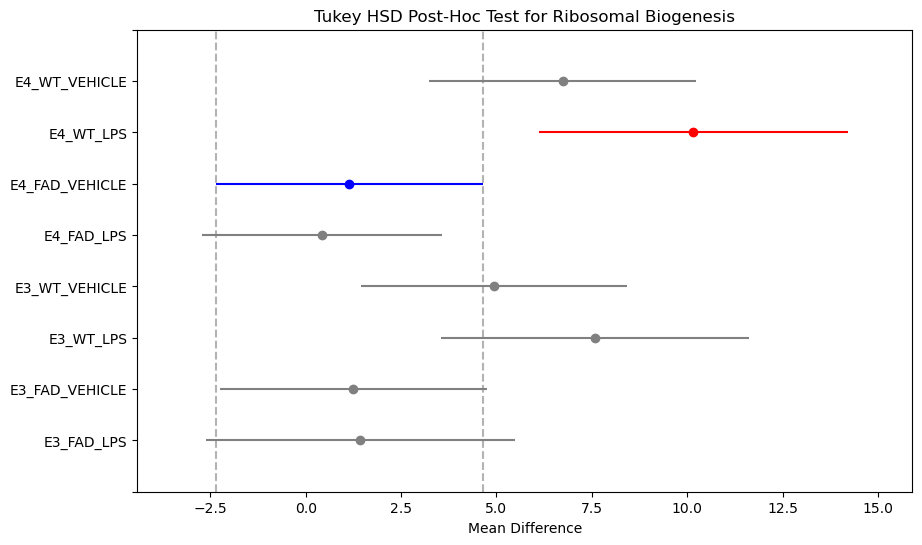

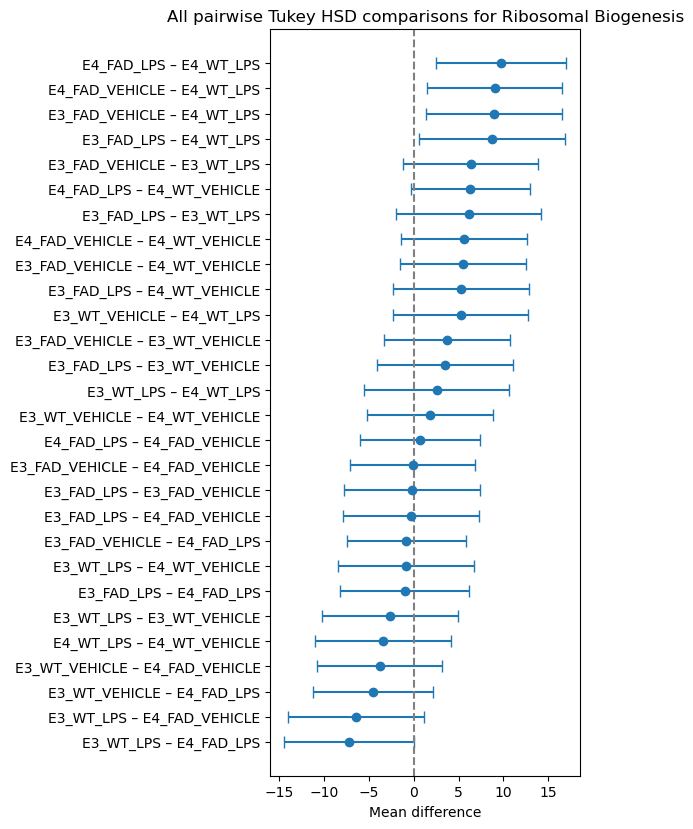

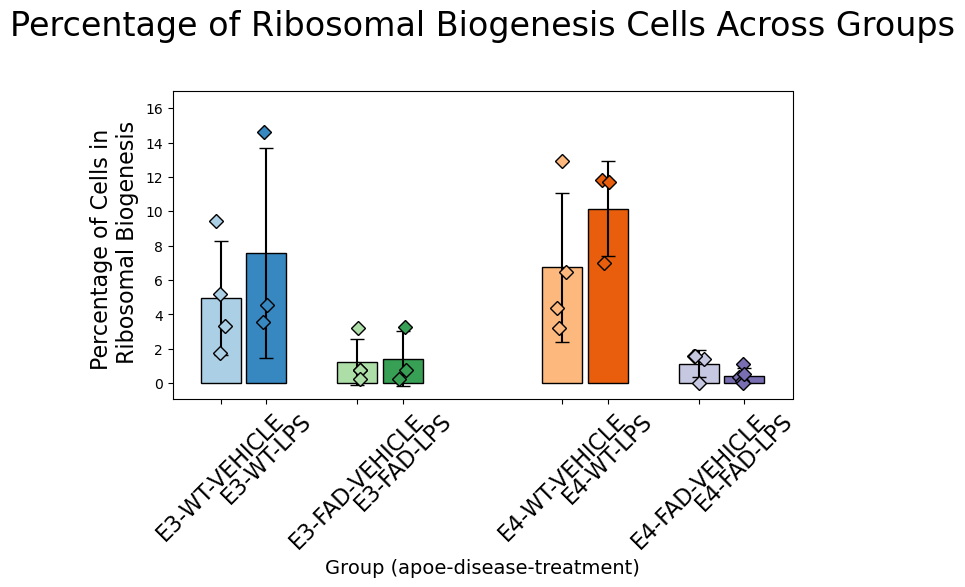

Processing cell type: BAM-like
Three-Way ANOVA Results for cell type BAM-like:
                                     sum_sq    df           F        PR(>F)
C(apoe)                            0.365253   1.0    0.116065  7.365739e-01
C(disease)                       473.910674   1.0  150.592958  2.583403e-11
C(treatment)                       0.223629   1.0    0.071062  7.922795e-01
C(apoe):C(disease)                 0.191673   1.0    0.060907  8.073559e-01
C(apoe):C(treatment)               5.623910   1.0    1.787090  1.949418e-01
C(disease):C(treatment)            1.032888   1.0    0.328217  5.725204e-01
C(apoe):C(disease):C(treatment)    5.389732   1.0    1.712677  2.041454e-01
Residual                          69.233216  22.0         NaN           NaN

OLS Model Summary:
                            OLS Regression Results                            
Dep. Variable:                percent   R-squared:                       0.876
Model:                            OLS   Adj. R-squared:    

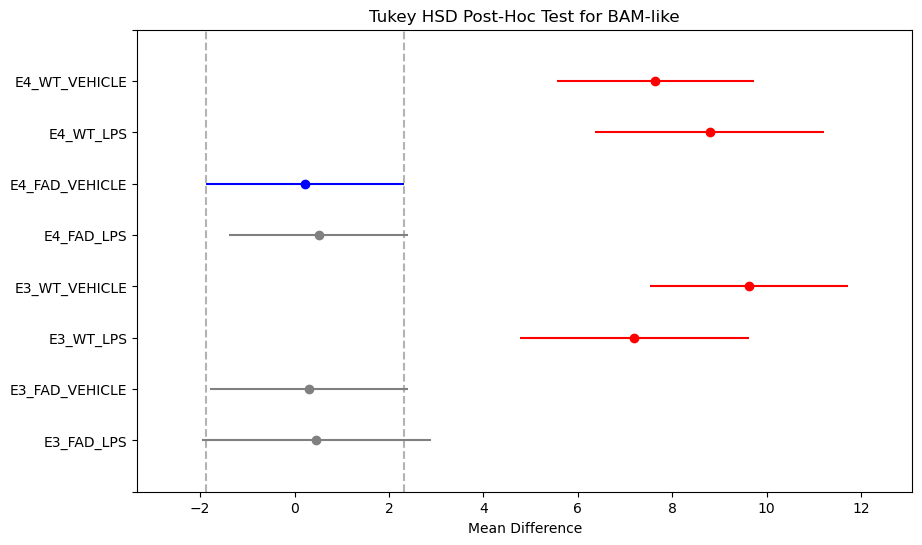

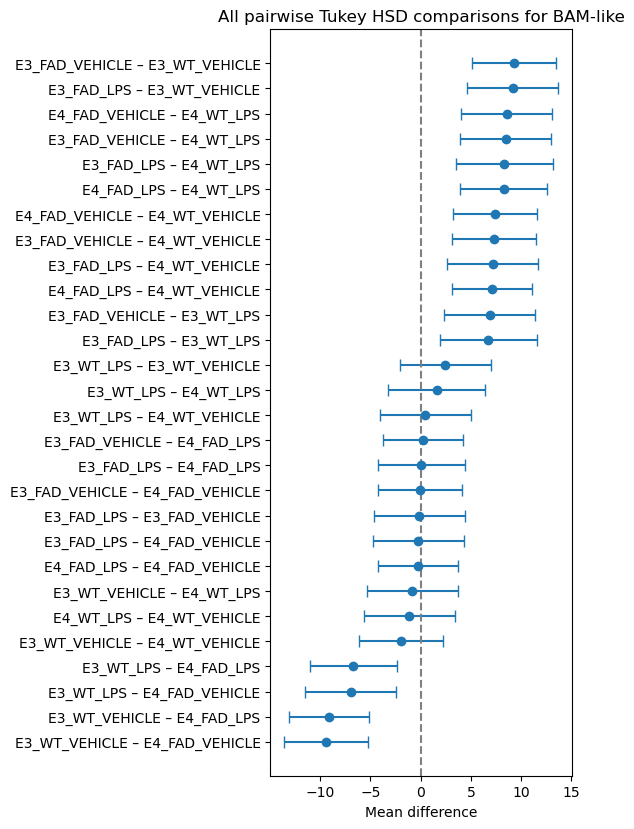

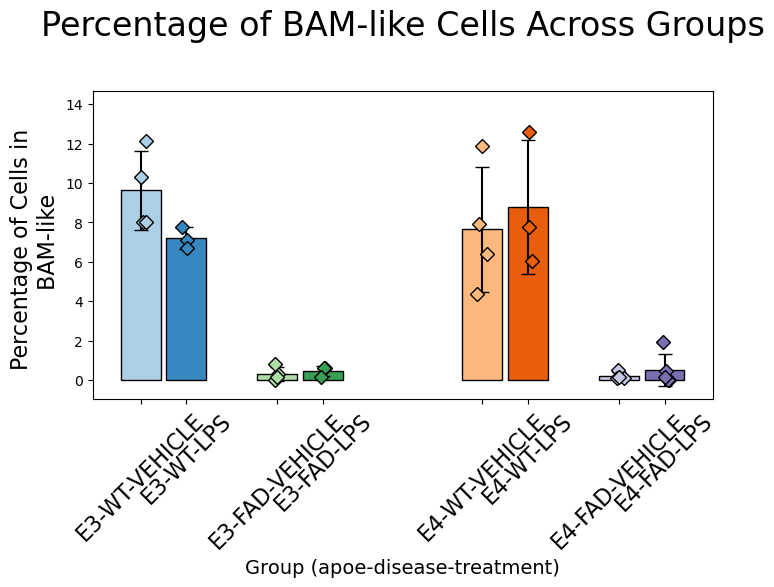

In [59]:

# Create a mapping from cell types to safe column names
cell_types = adata.obs['anno2'].unique()

# Set Order of 'treatment' so that it appears in the correct order in the plot.
adata.obs['treatment'] = adata.obs['treatment'].cat.reorder_categories(['VEHICLE', 'LPS'])

# Set Order of 'apoe' so that it appears in the correct order in the plot.
adata.obs['apoe'] = adata.obs['apoe'].cat.reorder_categories(['E3', 'E4'])

# Function to create safe column names
def make_safe_column_name(name):
    return re.sub(r'\W+', '_', name)

# Create a mapping from original cell type names to safe column names
cell_type_map = {ct: make_safe_column_name(ct) for ct in cell_types}

# Make a dataframe with each sample as a row
anv_df = pd.DataFrame(index=adata.obs['Classification'].unique())

# Add the 'apoe', 'treatment', and 'disease' columns
anv_df['apoe'] = adata.obs.groupby('Classification')['apoe'].first().values
anv_df['treatment'] = adata.obs.groupby('Classification')['treatment'].first().values
anv_df['disease'] = adata.obs.groupby('Classification')['disease'].first().values

# Convert columns to category type
anv_df['apoe'] = anv_df['apoe'].astype('category')
anv_df['treatment'] = anv_df['treatment'].astype('category')
anv_df['disease'] = anv_df['disease'].astype('category')

# Add the percentage of each cell type in each sample
for ct in cell_types:
    ct_safe = cell_type_map[ct]
    anv_df[ct_safe] = adata.obs.groupby('Classification')['anno2'].apply(
        lambda x: (x == ct).sum() / len(x) * 100
    ).values

# Make a summary statistics list
summary_stats = []


# Loop through each cell type to perform analysis and plotting
for ct in cell_types:
    ct_safe = cell_type_map[ct]
    print(f"Processing cell type: {ct}")

    # Prepare data for plotting and analysis by melting the dataframe
    df_long = anv_df.melt(
        id_vars=['apoe', 'treatment', 'disease'],
        var_name='cell_type',
        value_name='percent'
    )
    
    # Filter for the current cell type
    df_long = df_long[df_long['cell_type'] == ct_safe]
    
    # Check if there is data for this cell type
    if df_long.empty:
        print(f"No data for cell type {ct}.")
        continue  # Skip to the next cell type

    # Create a combined group that includes apoe, disease, and treatment.
    df_long['group'] = (df_long['apoe'].astype(str) + "_" +
                        df_long['disease'].astype(str) + "_" +
                        df_long['treatment'].astype(str))
        # Define the desired order for groups.
    # (Adjust these names to match your actual category names if needed)
    desired_order = [
        "E3_WT_VEHICLE", "E3_WT_LPS",
        "E3_FAD_VEHICLE", "E3_FAD_LPS",
        "E4_WT_VEHICLE", "E4_WT_LPS",
        "E4_FAD_VEHICLE", "E4_FAD_LPS"
    ]

    # Convert 'group' to a categorical variable with this order
    df_long['group'] = pd.Categorical(df_long['group'], categories=desired_order, ordered=True)
    df_long['apoe'] = df_long['apoe'].cat.reorder_categories(['E3', 'E4'], ordered=True)
    df_long['disease'] = df_long['disease'].cat.reorder_categories(['WT', 'FAD'], ordered=True)
    df_long['treatment'] = df_long['treatment'].cat.reorder_categories(['VEHICLE', 'LPS'], ordered=True)
    # Define custom x positions for each group.
    # Here, the first two (E3 WT) are placed close together, then a gap before E3 FAD, then a larger gap between E3 and E4.
    positions = {
        "E3_WT_VEHICLE": 0.0,
        "E3_WT_LPS": 0.4,
        "E3_FAD_VEHICLE": 1.2,
        "E3_FAD_LPS": 1.6,
        "E4_WT_VEHICLE": 3.0,
        "E4_WT_LPS": 3.4,
        "E4_FAD_VEHICLE": 4.2,
        "E4_FAD_LPS": 4.6,
    }
    # Map these positions into a new column
    df_long['x'] = df_long['group'].map(positions)
    # Define color palettes for E3 and E4.
    e3_wt_palette = sns.color_palette("Blues", 2)   # two shades for WT vs FAD in E3
    e3_fad_palette = sns.color_palette("Greens", 2)  # two shades for WT vs FAD in E3
    e4_wt_palette = sns.color_palette("Oranges", 2)  # two shades for WT vs FAD in E4
    e4_fad_palette = sns.color_palette("Purples", 2)    # two shades for WT vs FAD in E4


    # Map groups to colors (using the same color for the two treatments within each disease group)
    color_dict = {
        "E3_WT_VEHICLE": e3_wt_palette[0],
        "E3_WT_LPS": e3_wt_palette[1],
        "E3_FAD_VEHICLE": e3_fad_palette[0],
        "E3_FAD_LPS": e3_fad_palette[1],
        "E4_WT_VEHICLE": e4_wt_palette[0],
        "E4_WT_LPS": e4_wt_palette[1],
        "E4_FAD_VEHICLE": e4_fad_palette[0],
        "E4_FAD_LPS": e4_fad_palette[1],
    }

    # Compute group statistics (mean and standard deviation)
    group_stats = df_long.groupby('group')['percent'].agg(['mean', 'std']).reindex(desired_order)
    # Add x positions from our mapping
    group_stats['x'] = [positions[g] for g in desired_order]
            
    
    # Example: Perform a Three-Way ANOVA (apoe, disease, treatment and interactions)
    formula = ('percent ~ C(apoe) + C(disease) + C(treatment) + '
               'C(apoe):C(disease) + C(apoe):C(treatment) + C(disease):C(treatment) + '
               'C(apoe):C(disease):C(treatment)')
    model = ols(formula, data=df_long).fit()
    # ANOVA table
    anova_table = sm.stats.anova_lm(model, typ=2)
    print(f"Three-Way ANOVA Results for cell type {ct}:")
    print(anova_table)

    # Print full model summary
    print("\nOLS Model Summary:")
    print(model.summary())

    # Perform Tukey's HSD test using the new group definitions
    tukey = pairwise_tukeyhsd(
        endog=df_long['percent'],
        groups=df_long['group'],
        alpha=0.05
    )

    # Save Summary Statistics of ANOVA and Tukey's in a DataFrame
    f.summarize_celltype_results(
        cell_type=ct,
        model=model,
        anova_table=anova_table,
        tukey=tukey,
        output_dir=TABLE_DIR
    )

    print("All group levels in order:", tukey.groupsunique)
    print("Baseline (first level):", tukey.groupsunique[0])
    print(f"\nTukey HSD Post-Hoc Test Results for cell type {ct}:")
    print(tukey.summary())

    # Optional: Visualize the Tukey HSD test results
    tukey.plot_simultaneous(comparison_name=df_long['group'].unique()[0])
    plt.title(f'Tukey HSD Post-Hoc Test for {ct}')
    plt.xlabel('Mean Difference')
    plt.show()


    # ---------------------------------------------------------------------
    # 1) grab the stats out of the summary table
    res = pd.DataFrame(
        data=tukey._results_table.data[1:], 
        columns=tukey._results_table.data[0]
    )
    # make sure numeric columns are floats
    for col in ['meandiff','lower','upper']:
        res[col] = res[col].astype(float)

    # 2) build a “pair” label
    res['pair'] = res['group1'] + ' – ' + res['group2']

    # 3) sort however you like (here by mean difference)
    res = res.sort_values('meandiff')

    # 4) manual error‐bar plot
    fig, ax = plt.subplots(figsize=(6, len(res) * 0.3))
    y = np.arange(len(res))
    x = res['meandiff']
    err_low  = x - res['lower']
    err_high = res['upper'] - x

    ax.errorbar(x, y, 
                xerr=[err_low, err_high], 
                fmt='o', capsize=4)
    ax.axvline(0, color='gray', linestyle='--')

    ax.set_yticks(y)
    ax.set_yticklabels(res['pair'])
    ax.set_xlabel('Mean difference')
    ax.set_title(f'All pairwise Tukey HSD comparisons for {ct}')

    plt.tight_layout()
    plt.show()


    # Plot using matplotlib's bar
    plt.figure(figsize=(8, 4))
    ax = plt.gca()

    # Set a smaller bar width for “skinnier” bars
    bar_width = 0.35

    # Plot the bars with error bars
    ax.bar(
        group_stats['x'],
        group_stats['mean'],
        yerr=group_stats['std'],
        width=bar_width,
        color=[color_dict[g] for g in desired_order],
        capsize=5,
        edgecolor='black'
    )

    # Overlay individual sample points (as diamonds) with slight x jitter
    for g in desired_order:
        subset = df_long[df_long['group'] == g]
        x_pos = positions[g]
        # Create a small random jitter around the x position
        jitter = np.random.uniform(-0.05, 0.05, size=len(subset))
        ax.plot(
            x_pos + jitter,
            subset['percent'],
            'D',
            markersize=7,
            markeredgecolor='black',
            markerfacecolor=color_dict[g],  # Use same color as the corresponding bar
            linestyle='none'
        )


    # Set custom x-axis ticks and labels
    ax.set_xticks([positions[g] for g in desired_order])
    # Replace underscores with dashes for prettier labels (e.g. "E3-WT-VEHICLE")
    ax.set_xticklabels([g.replace("_", "-") for g in desired_order], rotation=45, fontsize=16)

    # Add y-axis padding
    ymin, ymax = ax.get_ylim()
    padding = (ymax - ymin) * 0.1  # 10% padding
    ax.set_ylim(ymin, ymax + padding)

    plt.title(f'Percentage of {ct} Cells Across Groups', fontsize=24, pad=40)
    plt.ylabel(f'Percentage of Cells in \n {ct}', fontsize=16)
    plt.xlabel('Group (apoe-disease-treatment)', fontsize=14)


    # Transform {ct} to a safe name for saving, removing spaces\
    safe_ct = re.sub(r'\W+', '_', ct)
    # Remove brackets
    safe_ct = re.sub(r'[()\+/\\]', '', safe_ct)

    plt.savefig(str(FIG_DIR / f"{safe_ct}_cells_across_groups.pdf"),transparent=True, bbox_inches='tight')
    plt.show()
    plt.close()



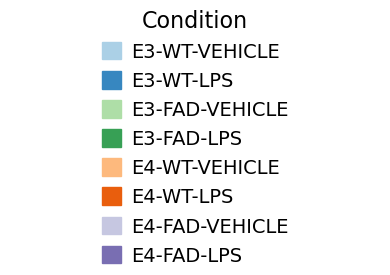

In [61]:

# Create a list of patches for the legend
patches = [
    mpatches.Patch(color=color_dict[g], label=g.replace("_", "-"))
    for g in desired_order
]

# Create an empty figure with no axes visible
fig, ax = plt.subplots(figsize=(4, 3))

# Create the legend in the center. You can adjust loc and number of columns as needed.
legend = ax.legend(handles=patches,
                    loc='center', 
                    frameon=False,   # Remove box if desired
                    ncol=1,          # Number of columns in the legend
                    title='Condition', 
                    title_fontsize=16,
                    fontsize=14)

# Remove the axes since you just want the legend
ax.axis('off')

# Use tight layout for a neat bounding box
plt.tight_layout()

# Save the legend as a separate file
plt.savefig(str(FIG_DIR/"bar_dot_legend.pdf"), transparent=True, bbox_inches='tight')
plt.show()

/opt/homebrew/Caskroom/mambaforge/envs/sc_env3_omni/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


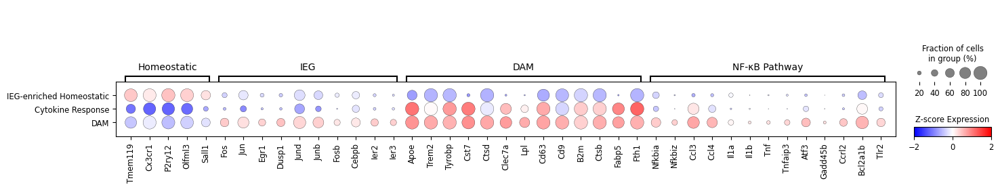

In [62]:



# Step 1: Subset to groups of interest
groups_of_interest = ['IEG-enriched Homeostatic', 'Cytokine Response', 'DAM']
adata_subset = adata[adata.obs['anno2'].isin(groups_of_interest)].copy()
adata_subset.obs['anno2'] = adata_subset.obs['anno2'].astype('category')
adata_subset.obs['anno2'] = adata_subset.obs['anno2'].cat.reorder_categories(groups_of_interest, ordered=True)

# Step 2: Define marker groups
homeostatic_genes = ['Tmem119', 'Cx3cr1', 'P2ry12', 'Olfml3', 'Sall1']
DAM_genes = ['Apoe', 'Trem2', 'Tyrobp', 'Cst7', 'Ctsd', 'Clec7a', 'Lpl', 'Cd63', 'Cd9', 'B2m', 'Ctsb', 'Fabp5', 'Fth1']
IEG_genes = ['Fos', 'Jun', 'Egr1', 'Dusp1', 'Jund', 'Junb', 'Fosb', 'Cebpb', 'Ier2', 'Ier3']
NFKB_canon_genes = ['Nfkbia', 'Nfkbiz', 'Ccl3', 'Ccl4', 'Il1a', 'Il1b', 'Tnf', 'Tnfaip3', 'Atf3', 'Gadd45b', 'Ccrl2', 'Bcl2a1b', 'Tlr2']

marker_dict = {
    "Homeostatic": homeostatic_genes,
    "IEG": IEG_genes,
    "DAM": DAM_genes,
    "NF-κB Pathway": NFKB_canon_genes
}

# Flatten list of all genes
all_genes = [gene for group in marker_dict.values() for gene in group]
all_genes = [gene for gene in all_genes if gene in adata_subset.var_names]  # Ensure all genes exist

# Step 3: Compute scaled expression (z-score) per gene per cell
adata_scaled = sc.pp.scale(adata_subset, copy=True)

# Step 4: Create base dotplot using original data (for size)
dotplot = sc.pl.DotPlot(
    adata_subset,
    var_names=marker_dict,
    groupby='anno2',
    use_raw=False,
    vmin=-2,
    vmax=2,
    var_group_rotation=0,
)

# Step 5: Inject scaled expression for color (adata_scaled)
dot_color_df = pd.DataFrame(index=dotplot.dot_color_df.index, columns=dotplot.dot_color_df.columns)

for gene in all_genes:
    gene_idx = adata_scaled.var_names.get_loc(gene)
    scaled_values = adata_scaled.X[:, gene_idx]

    for group in groups_of_interest:
        cells = adata_scaled.obs['anno2'] == group
        mean_scaled = scaled_values[cells].mean()
        dot_color_df.loc[group, gene] = mean_scaled

# Cast to float
dot_color_df = dot_color_df.astype(float)

# Step 6: Apply custom color data to the plot
dotplot.dot_color_df = dot_color_df

dotplot = dotplot.style(
    dot_edge_color='black',
    cmap='bwr',
).legend(
    colorbar_title="Z-score Expression").savefig(str(FIG_DIR/
    "dotplot_3_groups.pdf"),
    dpi=300,
    bbox_inches='tight',
    transparent=True,)

del adata_subset, adata_scaled

... storing 'anno2' as categorical
/opt/homebrew/Caskroom/mambaforge/envs/sc_env3_omni/lib/python3.12/functools.py:912: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


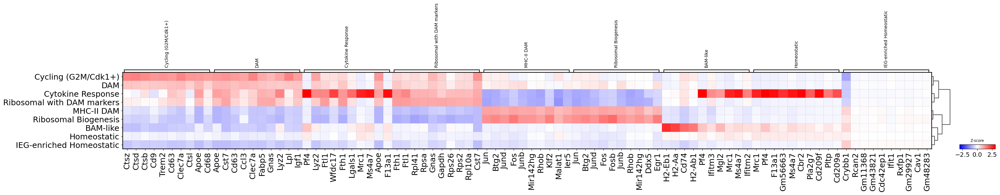

In [63]:
adata.X = adata.layers['log_norm'].copy()
sc.tl.rank_genes_groups(adata, groupby='anno2', method='wilcoxon', rankby_abs=False, pts=True)

adata.X = adata.layers['log_norm'].copy()
adata_scale = sc.pp.scale(adata, copy=True)

fig = sc.pl.rank_genes_groups_matrixplot(
    adata_scale,
    n_genes=10,
    groupby='anno2',
    key='rank_genes_groups',
    min_logfoldchange=0.9,
    vmax=3,
    vmin=-3,
    cmap='bwr',
    show=False,
    return_fig=True,
    colorbar_title='Z-score',
)

# First, trigger figure creation
fig.make_figure()

# Now safely adjust fonts
axes = fig.get_axes()
axes['mainplot_ax'].tick_params(axis='x', labelsize=18)
axes['mainplot_ax'].tick_params(axis='y', labelsize=18)

for text in axes['group_extra_ax'].texts:
    text.set_fontsize(24)

if 'color_legend_ax' in axes:
    axes['color_legend_ax'].tick_params(labelsize=14)

    plt.savefig(str(FIG_DIR / "rank_genes_groups_matrixplot.pdf"), transparent=True, bbox_inches="tight")

# Pseudobulk 

/opt/homebrew/Caskroom/mambaforge/envs/sc_env3_omni/lib/python3.12/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)


AttributeError: module 'decoupler' has no attribute 'get_metadata_associations'

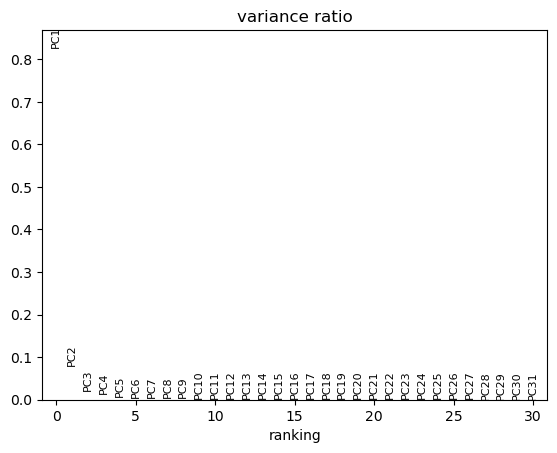

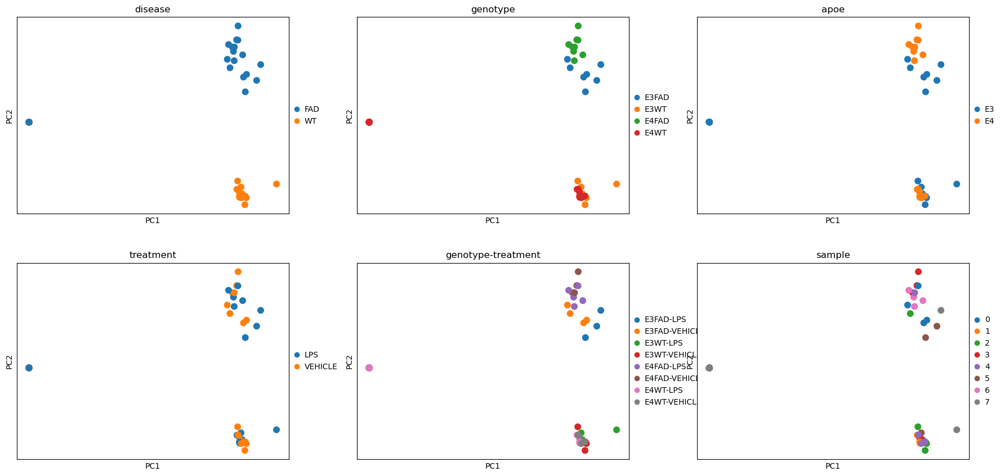

In [ ]:

# results containers
vehlps_stats = {}
dc_vehlps_results = {}
dc_vehlps_results_sig = {}
dc_vehlps_upreg = {}
dc_vehlps_downreg = {}



# 1) build one pseudobulk across all cells
adata.X = adata.layers['counts'].toarray()
psb = dc.pp.pseudobulk(
    adata,
    sample_col='Classification',
    groups_col='genotype',
    mode='sum',
)
psb.layers['counts'] = psb.X.copy()

# 2) normalize, log, scale, PCA
sc.pp.normalize_total(psb, target_sum=1e4)
sc.pp.log1p(psb)
sc.pp.scale(psb, max_value=10)
sc.tl.pca(psb)
dc.pp.swap_layer(psb, 'counts', inplace=True)

# if they aren't categories yet, make them
if 'genotype' not in psb.obs.select_dtypes(['category']).columns:
    psb.obs['genotype'] = psb.obs['genotype'].astype('category')

if 'treatment' not in psb.obs.select_dtypes(['category']).columns:
    psb.obs['treatment'] = psb.obs['treatment'].astype('category')


# 3) ensure combined factor
psb.obs['genotype-treatment'] = (
    psb.obs['genotype'].astype(str) + '-' + psb.obs['treatment'].astype(str)
).astype('category')

# Check PCA
sc.pl.pca_variance_ratio(psb, show = False)
plt.savefig(str(FIG_DIR / f"Pseudobulk_pca_scree.pdf"), dpi=300, bbox_inches='tight', transparent=True)
sc.pl.pca(psb, color=['disease', 'genotype', 'apoe', 'treatment', 'genotype-treatment', 'sample'], ncols=3, size=300, show = False)
plt.savefig(str(FIG_DIR / f"Pseudobulk_pca.pdf"), dpi=300, bbox_inches='tight', transparent=True)

# Check metadata associations
dc.tl.rankby_obsm(
    psb,
    key='X_pca', 
    obs_keys = ['apoe','disease','treatment', 'psbulk_n_cells', 'psbulk_counts',],  # Metadata columns to associate to PCs
    uns_key='pca_anova',  # Where the results are stored
    inplace=True
)

dc.pl.obsm(
    psb,
    key='pca_anova',  # Summary statistics from the anova tests
    names = ['apoe','disease','treatment'], # which sample annotations to plot,
    figsize=(7, 5)
)
plt.savefig(str(FIG_DIR / f"Pseudobulk_metadata"), dpi=300, bbox_inches='tight', transparent=True)


# 4) loop genotypes
for genotype in ('E3WT','E3FAD','E4WT','E4FAD'):
    key = f'{genotype}_vehlps'
    contrast = [ 'genotype-treatment',
                 f'{genotype}-LPS',
                 f'{genotype}-VEHICLE' ]

    # DESeq2
    inference = DefaultInference(n_cpus=8)
    dds = DeseqDataSet(
        adata=psb,
        design_factors=['genotype-treatment'],
        refit_cooks=True,
        inference=inference
    )
    dds.deseq2()
    stats = DeseqStats(dds, contrast=contrast)
    stats.summary()

    # store
    vehlps_stats[key]         = stats
    df                        = stats.results_df
    dc_vehlps_results[key]    = df
    sig                       = df.loc[
        (df['padj'] < 0.05) &
        (df['log2FoldChange'].abs() > 0.25)
    ].sort_values(by='log2FoldChange', key=abs, ascending=False)
    dc_vehlps_results_sig[key] = sig
    dc_vehlps_upreg[key]      = set(sig.loc[sig['log2FoldChange'] > 0].index)
    dc_vehlps_downreg[key]    = set(sig.loc[sig['log2FoldChange'] < 0].index)

    # print lists
    print(f"{genotype} up ({len(dc_vehlps_upreg[key])}):",
          sorted(dc_vehlps_upreg[key]))
    print(f"{genotype} down ({len(dc_vehlps_downreg[key])}):",
          sorted(dc_vehlps_downreg[key]))


    #My volcano
    fig = f.custom_volcano_plot(
        df=dc_vehlps_results[key],
        logfc_col='log2FoldChange',
        pval_col='padj',
        lfc_thresh=0.25,
        pval_thresh=0.05,
        top_n=15,
        x_lim=(-6,6),
        y_lim=(0,5),
        title=f"{genotype}: LPS vs VEHICLE",
        use_adjust_text=True
    )

    fig.savefig(str(FIG_DIR / f"{genotype}_volcano.pdf"), dpi=300, bbox_inches='tight', transparent=True)
    plt.close(fig)



from matplotlib.colors import to_rgba

# 5) Venn diagrams
up_sets   = [dc_vehlps_upreg[f'{g}_vehlps']   for g in ('E3WT','E3FAD','E4WT','E4FAD')]
down_sets = [dc_vehlps_downreg[f'{g}_vehlps'] for g in ('E3WT','E3FAD','E4WT','E4FAD')]

# Mapping from base labels to full condition keys
group_keys = {
    'E3WT': 'E3_WT',
    'E3FAD': 'E3_FAD',
    'E4WT': 'E4_WT',
    'E4FAD': 'E4_FAD'
}

# Save original generate_colors function
original_generate_colors = venn.generate_colors

for name, sets, suffix in (
    ('Up', up_sets, '_LPS'),
    ('Down', down_sets, '_VEHICLE')
):
    # Extract RGBA colors with alpha=0.4
    colors = [to_rgba(color_dict[group_keys[g] + suffix], alpha=0.4) for g in ('E3WT','E3FAD','E4WT','E4FAD')]

    # Monkey-patch generate_colors to return these
    venn.generate_colors = lambda *args, **kwargs: colors

    # Create dataset dictionary
    label_dict = dict(zip(['E3WT','E3FAD','E4WT','E4FAD'], sets))

    # Generate and show Venn diagram
    fig = venn.venn(label_dict)
    plt.title(f"{name}-regulated Genes in LPS vs Vehicle by Genotype")
    plt.savefig(str(FIG_DIR / f"{name}_regulated_genes_venn.pdf"), dpi=300, bbox_inches='tight', transparent=True)
    plt.show()

# Restore original generate_colors function
venn.generate_colors = original_generate_colors

# 6) pairwise intersections printout
pairs = [
    ('E3FAD','E4FAD'),
    ('E3WT','E4WT'),
    ('E3FAD','E3WT'),
    ('E4FAD','E4WT'),
]
for name, col in (('Up','up_sets'), ('Down','down_sets')):
    print(f"\n{name}-regulated intersections:")
    for a,b in pairs:
        s = locals()[col][['E3WT','E3FAD','E4WT','E4FAD'].index(a)].intersection(
            locals()[col][['E3WT','E3FAD','E4WT','E4FAD'].index(b)]
        )
        print(f" {a} ∩ {b}: {s}")

# Bivariate DEG plot

In [ ]:
fig = f.bivariate_quadrant_plot(
    dc_vehlps_results['E3FAD_vehlps'],
    dc_vehlps_results['E4FAD_vehlps'],
    x_label='E3FAD LPS vs Vehicle',
    y_label='E4FAD LPS vs Vehicle',   
    use_adjust_text=True,
    label_genes=NFKB_canon_genes,
    x_lim=(-2, 2),
    y_lim=(-4, 4),
    dpi=300,
    title="E3FAD vs E4FAD LPS Responses"
)

fig.savefig(str(FIG_DIR / "E3FAD_vs_E4FAD_LPS_Responses.pdf"),dpi=300,bbox_inches="tight",transparent=True)
plt.close(fig)

: 

: 

: 

: 

: 

: 

: 

: 

# Comparison Of Wilcoxon vs Pseudobulk DEGs

In [ ]:
# Format full gene list for display
def format_gene_list(gene_set):
    gene_list = sorted(gene_set)
    return 'None' if len(gene_list) == 0 else ', '.join(gene_list)

# Helper to plot Venn diagrams + full gene lists
def plot_venn_with_genes(sets_dict, title):
    sets = list(sets_dict.values())
    names = list(sets_dict.keys())
    
    labels = venn.get_labels(sets, fill=['number'])
    fig, ax = venn.venn2(labels, names=names)
    
    set1, set2 = sets
    unique_set1 = set1 - set2
    unique_set2 = set2 - set1
    intersection = set1 & set2

    text = (
        f"Unique to {names[0]} ({len(unique_set1)} genes):\n{format_gene_list(unique_set1)}\n\n"
        f"Unique to {names[1]} ({len(unique_set2)} genes):\n{format_gene_list(unique_set2)}\n\n"
        f"Intersection ({len(intersection)} genes):\n{format_gene_list(intersection)}"
    )
    
    plt.subplots_adjust(bottom=0.4)  # More room for big lists
    plt.figtext(0.5, 0.02, text, wrap=True, ha='center', fontsize=9)
    plt.title(title)
    plt.show()

# Upregulated E3FAD
e3fad_up = {
    "Pseudobulk": dc_vehlps_upreg["E3FAD_vehlps"],
    "Wilcoxon": set(e3fad_LPS_sig_genes['Up-regulated'])
}
plot_venn_with_genes(e3fad_up, title="E3FAD Upregulated Genes Venn Diagram")

# Upregulated E4FAD
e4fad_up = {
    "Pseudobulk": dc_vehlps_upreg["E4FAD_vehlps"],
    "Wilcoxon": set(e4fad_LPS_sig_genes['Up-regulated'])
}
plot_venn_with_genes(e4fad_up, title="E4FAD Upregulated Genes Venn Diagram")

# Downregulated E3FAD
e3fad_down = {
    "Pseudobulk": dc_vehlps_downreg["E3FAD_vehlps"],
    "Wilcoxon": set(e3fad_LPS_sig_genes['Down-regulated'])
}
plot_venn_with_genes(e3fad_down, title="E3FAD Downregulated Genes Venn Diagram")

# Downregulated E4FAD
e4fad_down = {
    "Pseudobulk": dc_vehlps_downreg["E4FAD_vehlps"],
    "Wilcoxon": set(e4fad_LPS_sig_genes['Down-regulated'])
}
plot_venn_with_genes(e4fad_down, title="E4FAD Downregulated Genes Venn Diagram")

NameError: name 'e3fad_LPS_sig_genes' is not defined

: 

: 

: 

: 

: 

: 

: 

: 

# Functional & TF Analysis

## Decoupler GSEA on Hallmark


In [ ]:
gsea_results = {}

for comp in dc_vehlps_results:
    print(f"Running GSEA for {comp}...")
    gsea_results[comp] = dc.get_gsea_df(
        dc_vehlps_results[comp],
        stat='stat',
        net=msigdb_mouse_hallmark,
        source='geneset',
        target='genesymbol',
        times=1000,
        min_n=5,
        seed=42,
        verbose=True
    )

Running GSEA for E3WT_vehlps...
Running gsea on df with 17329 targets for 50 sources.
Running GSEA for E3FAD_vehlps...
Running gsea on df with 17329 targets for 50 sources.
Running GSEA for E4WT_vehlps...
Running gsea on df with 17329 targets for 50 sources.
Running GSEA for E4FAD_vehlps...
Running gsea on df with 17329 targets for 50 sources.


: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 


GSEA results for E3WT_vehlps (FDR p-value < 0.05):
                                   Term        ES       NES  NOM p-value  \
11                  HALLMARK_DNA_REPAIR -0.437844 -1.948373     0.000000   
35   HALLMARK_OXIDATIVE_PHOSPHORYLATION -0.399161 -1.813601     0.000000   
31              HALLMARK_MYC_TARGETS_V1 -0.376446 -1.734737     0.000000   
32              HALLMARK_MYC_TARGETS_V2 -0.458194 -1.730396     0.000000   
0                 HALLMARK_ADIPOGENESIS -0.295859 -1.341670     0.010695   
26   HALLMARK_INTERFERON_GAMMA_RESPONSE  0.308773  1.340990     0.010067   
6                    HALLMARK_APOPTOSIS  0.328836  1.389468     0.019264   
12                 HALLMARK_E2F_TARGETS  0.317791  1.408826     0.011609   
18                  HALLMARK_GLYCOLYSIS  0.331222  1.437199     0.004724   
43          HALLMARK_TGF_BETA_SIGNALING  0.435501  1.535889     0.007233   
33                  HALLMARK_MYOGENESIS  0.365785  1.545578     0.003190   
38                  HALLMARK_PEROXIS

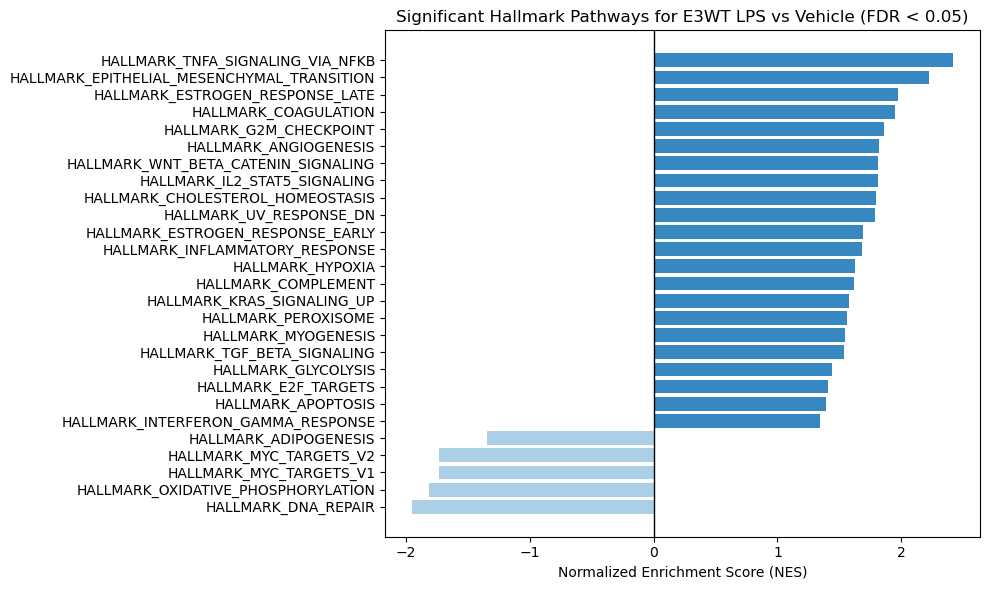


GSEA results for E3FAD_vehlps (FDR p-value < 0.05):
                                          Term        ES       NES  \
35          HALLMARK_OXIDATIVE_PHOSPHORYLATION -0.723306 -3.082461   
31                     HALLMARK_MYC_TARGETS_V1 -0.623991 -2.681081   
11                         HALLMARK_DNA_REPAIR -0.530359 -2.217579   
16              HALLMARK_FATTY_ACID_METABOLISM -0.528836 -2.185817   
0                        HALLMARK_ADIPOGENESIS -0.504145 -2.163779   
30                   HALLMARK_MTORC1_SIGNALING -0.479005 -2.049842   
25          HALLMARK_INTERFERON_ALPHA_RESPONSE -0.497829 -1.981119   
8             HALLMARK_CHOLESTEROL_HOMEOSTASIS -0.482545 -1.792930   
41    HALLMARK_REACTIVE_OXYGEN_SPECIES_PATHWAY -0.506842 -1.750213   
32                     HALLMARK_MYC_TARGETS_V2 -0.482125 -1.697854   
18                         HALLMARK_GLYCOLYSIS -0.395587 -1.676226   
26          HALLMARK_INTERFERON_GAMMA_RESPONSE -0.382666 -1.637099   
37                HALLMARK_PANCREAS_B

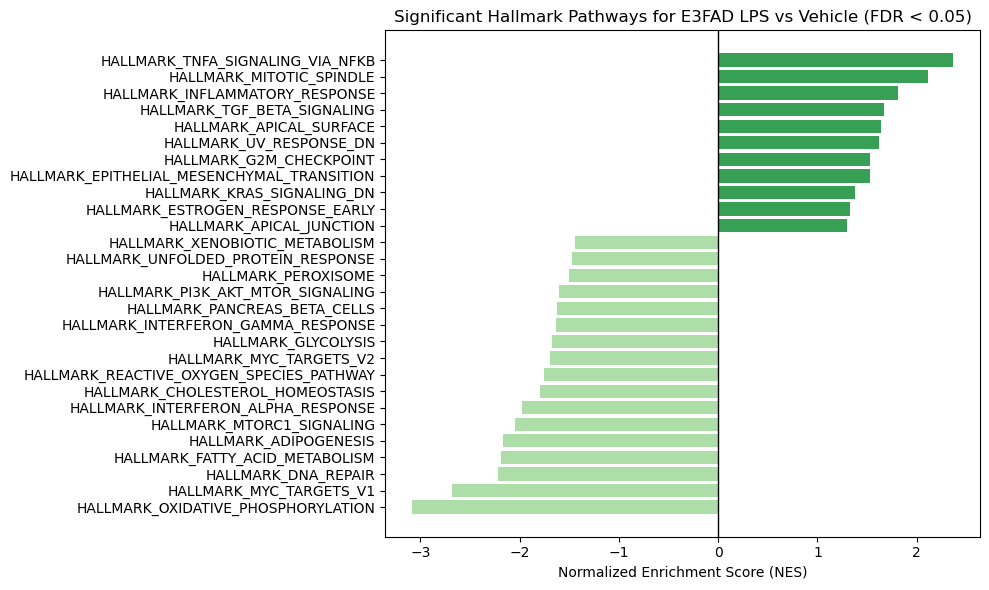


GSEA results for E4WT_vehlps (FDR p-value < 0.05):
                                          Term        ES       NES  \
17                     HALLMARK_G2M_CHECKPOINT -0.464874 -2.058005   
12                        HALLMARK_E2F_TARGETS -0.416117 -1.861516   
29                    HALLMARK_MITOTIC_SPINDLE -0.397315 -1.765790   
33                         HALLMARK_MYOGENESIS -0.411238 -1.762864   
32                     HALLMARK_MYC_TARGETS_V2 -0.451399 -1.632802   
13  HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION -0.351949 -1.497273   
49              HALLMARK_XENOBIOTIC_METABOLISM -0.346685 -1.488027   
26          HALLMARK_INTERFERON_GAMMA_RESPONSE  0.351753  1.564679   

    NOM p-value  FDR p-value  Set size     Tag %    Rank %  \
17     0.000000     0.000000       194  0.458763  0.200242   
12     0.000000     0.000000       195  0.379487  0.204224   
29     0.000000     0.000000       197  0.436548  0.240579   
33     0.000000     0.000000       143  0.286713  0.157424   
32     

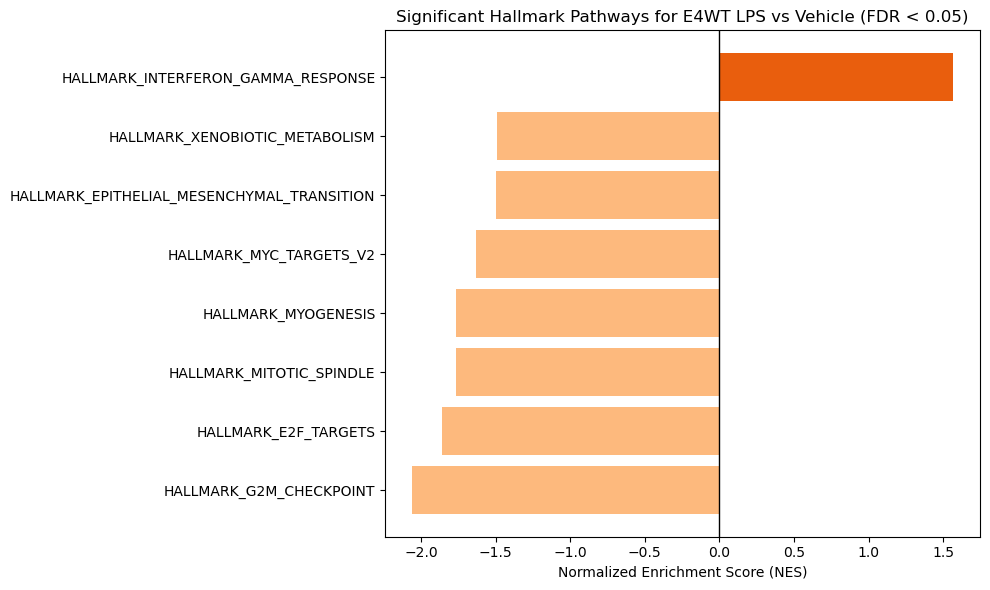


GSEA results for E4FAD_vehlps (FDR p-value < 0.05):
                                Term        ES       NES  NOM p-value  \
44  HALLMARK_TNFA_SIGNALING_VIA_NFKB -0.603143 -2.611565     0.000000   
47           HALLMARK_UV_RESPONSE_UP -0.435333 -1.811063     0.000000   
23  HALLMARK_IL6_JAK_STAT3_SIGNALING -0.478676 -1.801147     0.002137   
21                  HALLMARK_HYPOXIA -0.408087 -1.746602     0.000000   
6                 HALLMARK_APOPTOSIS -0.333653 -1.416699     0.004357   
24    HALLMARK_INFLAMMATORY_RESPONSE -0.328616 -1.407717     0.010460   
20          HALLMARK_HEME_METABOLISM -0.322428 -1.386887     0.006122   
2         HALLMARK_ANDROGEN_RESPONSE  0.375661  1.469835     0.006303   
19       HALLMARK_HEDGEHOG_SIGNALING  0.533916  1.599779     0.007576   
29          HALLMARK_MITOTIC_SPINDLE  0.374660  1.638682     0.000000   
30         HALLMARK_MTORC1_SIGNALING  0.390392  1.697671     0.000000   
31           HALLMARK_MYC_TARGETS_V1  0.390263  1.700805     0.000000  

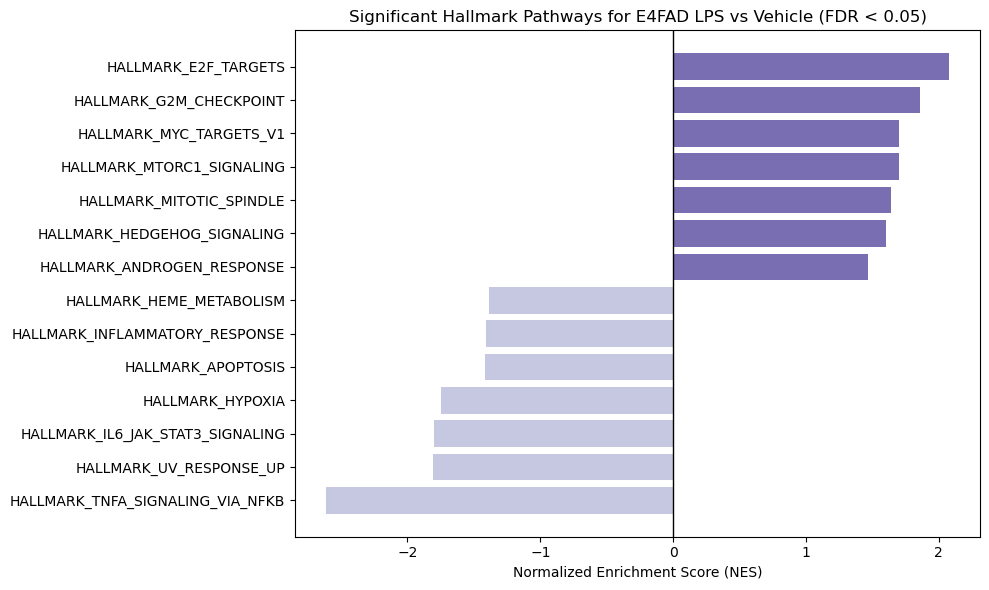

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

In [ ]:
for comp, gsea_df in gsea_results.items():
    print(f"\nGSEA results for {comp} (FDR p-value < 0.05):")
    sig_gsea_results = gsea_df[gsea_df["FDR p-value"] < 0.05]
    sig_gsea_results = sig_gsea_results.sort_values(by="NES", ascending=True)
    print(sig_gsea_results.head(25))
    # Plot
    genotype = comp.split('_')[0]            # e.g. 'E3WT'
    prefix = genotype[:2] + '_' + genotype[2:]  # e.g. 'E3_WT'

    vehicle_key = f"{prefix}_VEHICLE"  # e.g. 'E3_WT_VEHICLE'
    lps_key     = f"{prefix}_LPS"      # e.g. 'E3_WT_LPS'

    # 2. build a list of colors for each NES value
    nes = sig_gsea_results["NES"]
    bar_colors = [
        color_dict[vehicle_key] if v < 0 else color_dict[lps_key]
        for v in nes
    ]

    # 3. plot with those colors
    plt.figure(figsize=(10, 6))
    plt.barh(
        sig_gsea_results["Term"],
        nes,
        color=bar_colors
    )
    plt.axvline(x=0, color='black', linewidth=1)
    plt.xlabel("Normalized Enrichment Score (NES)")
    plt.title(f"Significant Hallmark Pathways for {genotype} LPS vs Vehicle (FDR < 0.05)")
    plt.tight_layout()
    plt.savefig(str(FIG_DIR / f"{genotype}_gsea_hallmark.pdf"), dpi=300, bbox_inches="tight", transparent=True)
    plt.show()

## Transcription Factor Inference with Decoupler

Processing comparison: E3WT_vehlps

Top 12 TFs by activity for E3WT_vehlps:
        activity       p-value
Sp1     7.204473  6.066332e-13
Egr1    6.607330  4.027053e-11
Jun     6.411884  1.474474e-10
Nfkb1   5.890744  3.915761e-09
Nr4a2   5.703865  1.190315e-08
Sp3     5.686212  1.319811e-08
Foxm1   5.665173  1.492089e-08
Mitf    5.590629  2.296602e-08
Cebpg   5.500718  3.836025e-08
Esr1    5.455745  4.943640e-08
Rela    5.356041  8.615022e-08
Tfap2a  4.821177  1.439240e-06


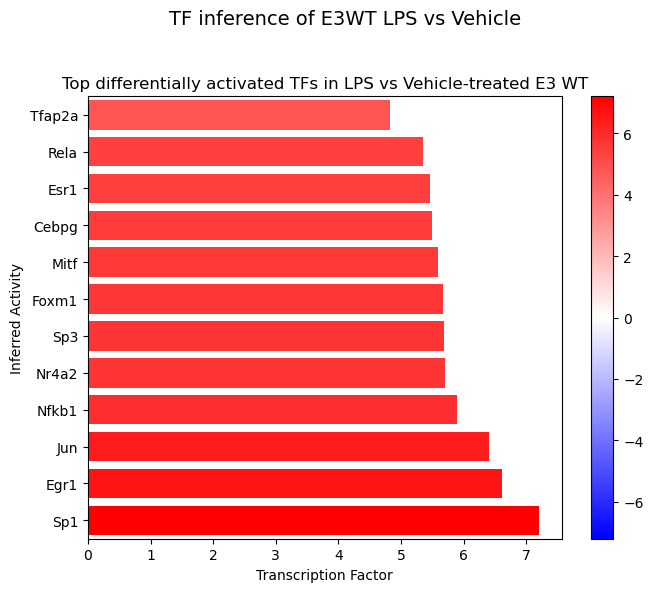

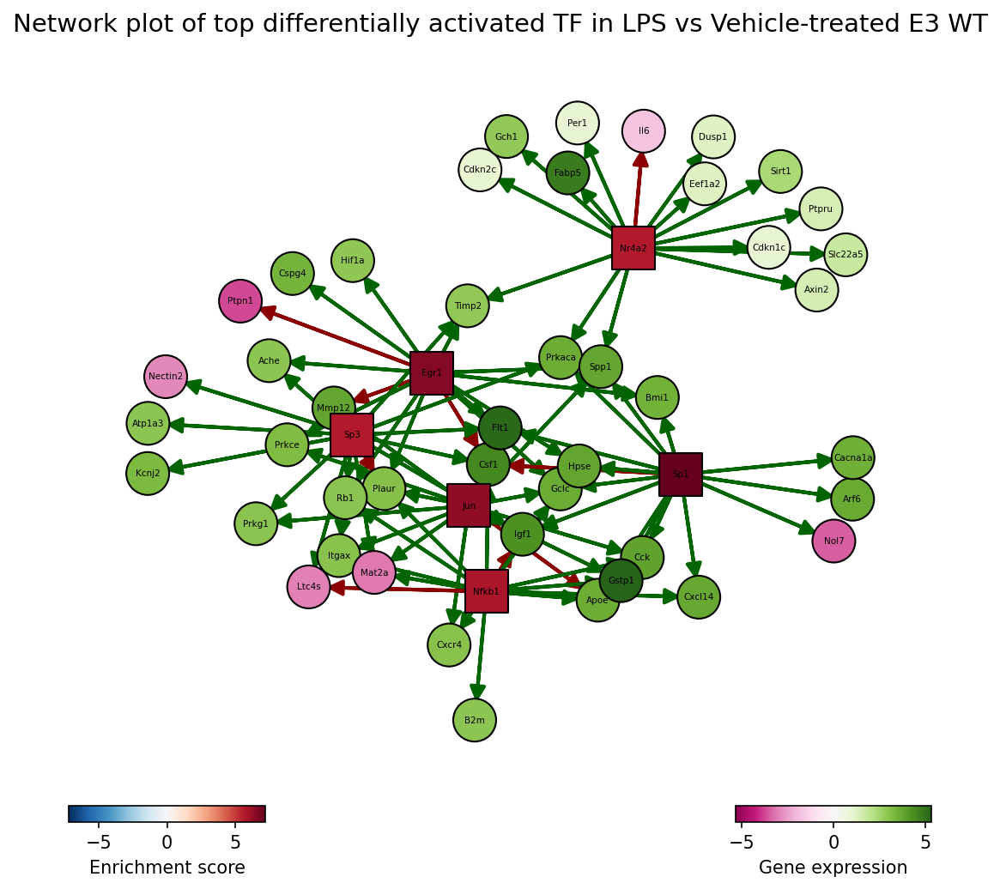

Processing comparison: E3FAD_vehlps

Top 12 TFs by activity for E3FAD_vehlps:
        activity   p-value
E2f3    4.130114  0.000036
Egr1    3.847957  0.000120
Clock   3.704793  0.000212
Elk1    3.696530  0.000219
Sox4    3.248407  0.001163
E2f1    3.188821  0.001431
Nfatc1  3.118361  0.001822
Bmal1   3.101295  0.001930
Tp63    3.080089  0.002073
Lmx1a   3.041550  0.002357
Foxm1   2.969844  0.002984
Nr2c2   2.948211  0.003200


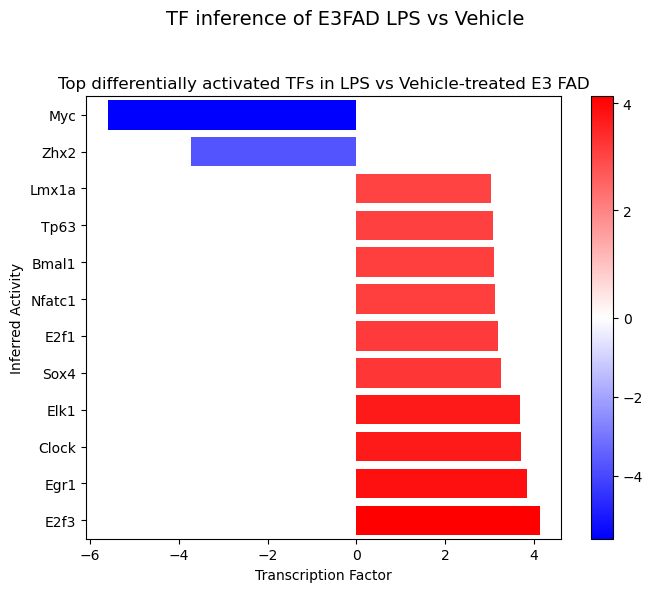

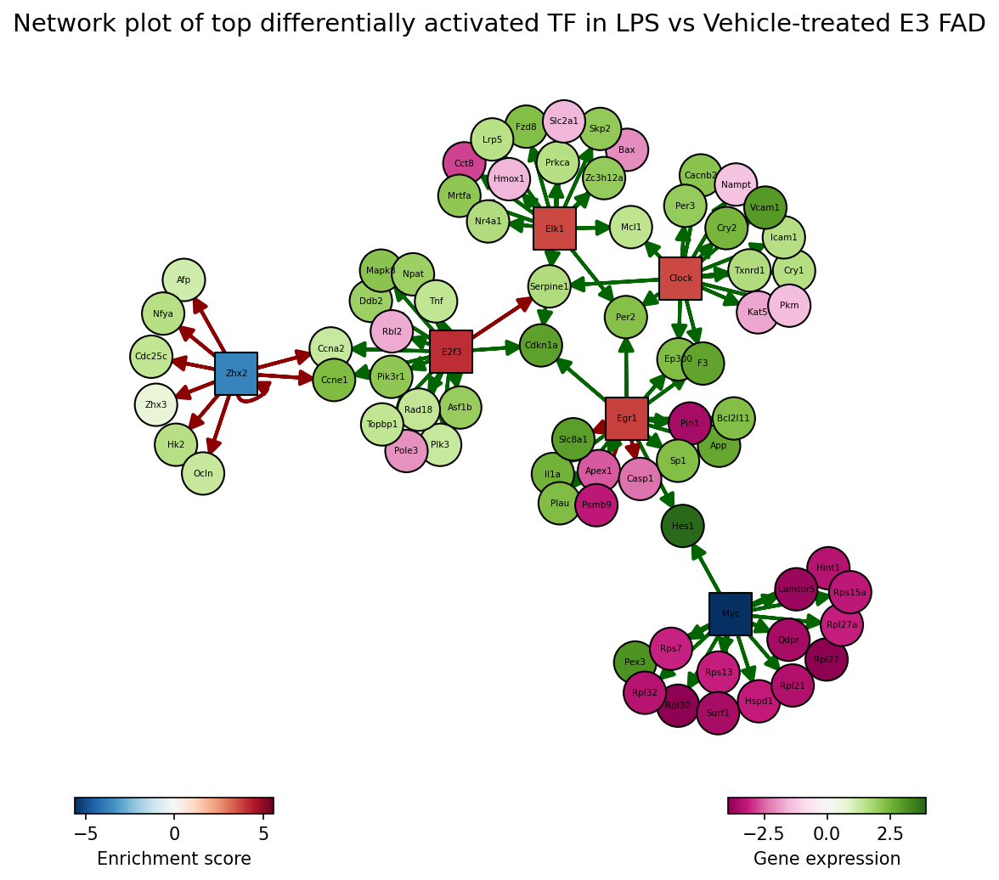

Processing comparison: E4WT_vehlps

Top 12 TFs by activity for E4WT_vehlps:
        activity   p-value
Irf1    3.522776  0.000428
Klf2    3.266987  0.001089
Foxo3   3.130408  0.001749
Hif3a   2.760909  0.005770
Kat2b   2.618632  0.008836
Zfx     2.559085  0.010503
Ing4    2.506571  0.012200
Taf1    2.454217  0.014129
Etv3    2.406138  0.016133
Smad5   2.354099  0.018579
Runx3   2.323627  0.020157
Hivep2  2.315356  0.020605


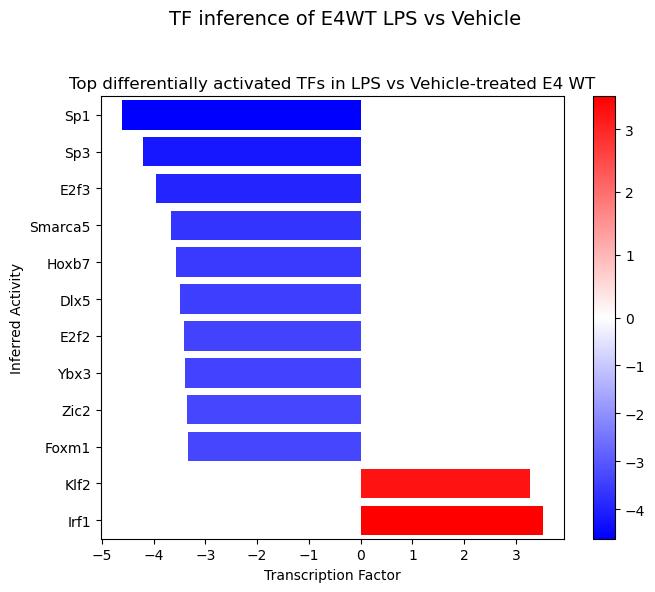

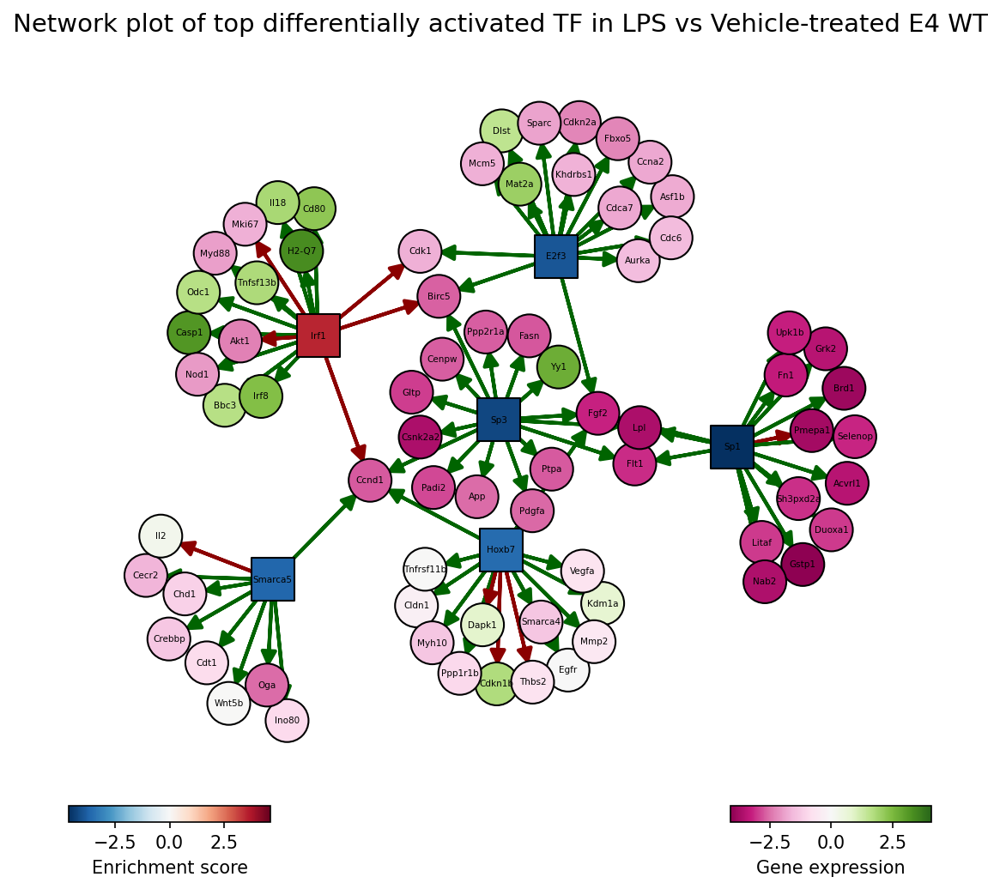

Processing comparison: E4FAD_vehlps

Top 12 TFs by activity for E4FAD_vehlps:
        activity   p-value
E2f4    4.693092  0.000003
Nfya    3.613195  0.000303
Srebf1  3.244862  0.001177
Lmo2    3.193363  0.001409
E2f1    3.133028  0.001733
Srebf2  2.816499  0.004861
Bach1   2.723855  0.006459
Gli2    2.683984  0.007282
Btg2    2.535874  0.011225
Hcfc1   2.460321  0.013891
E2f5    2.458802  0.013950
Ezh2    2.454628  0.014113


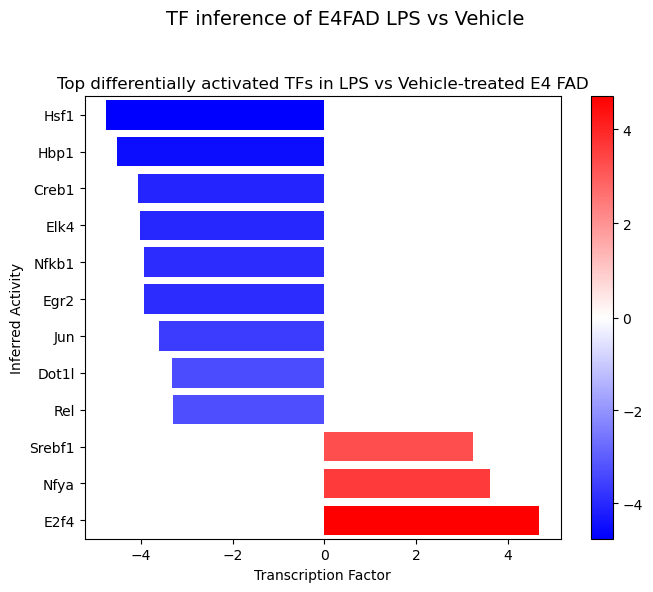

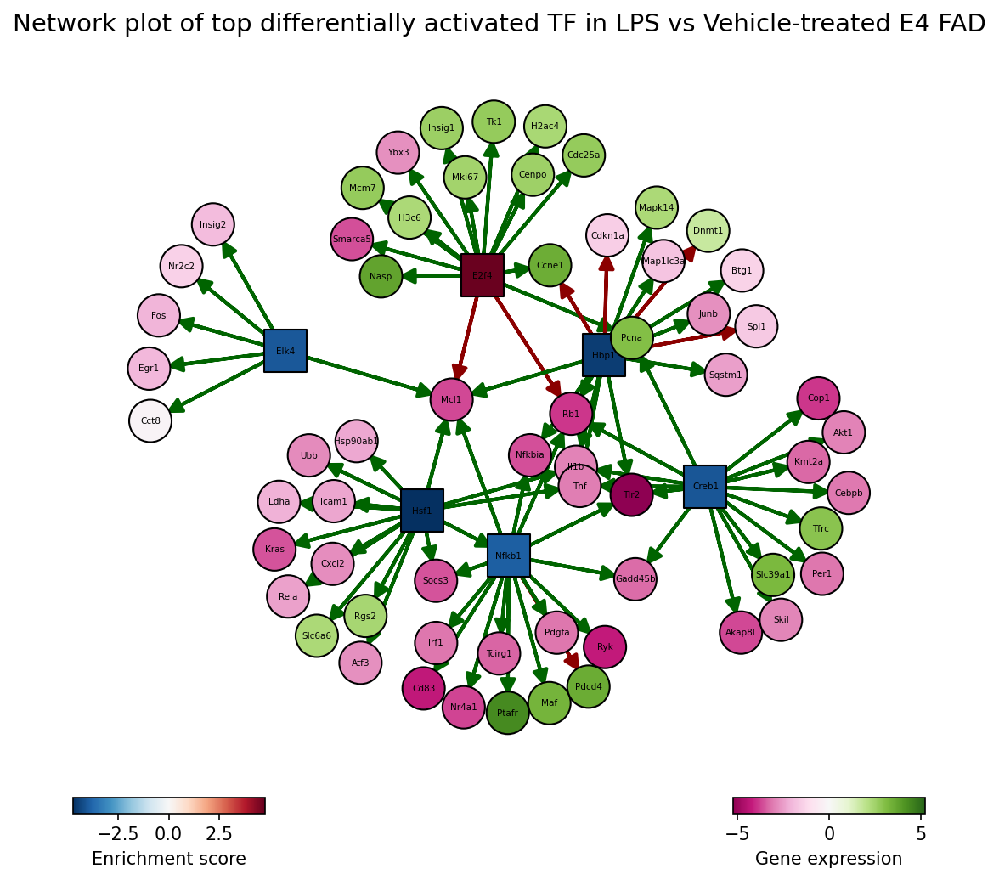

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

In [ ]:

# Retrieve the CollecTRI gene regulatory network once
collectri = dc.get_collectri(organism='mouse', split_complexes=False)

# Dictionary to store results from each comparison
ulm_results = {}

# Loop over each dataset in your dictionary
for comparison_name, df_res in dc_vehlps_results.items():
    print(f"Processing comparison: {comparison_name}")

    # Prepare `mat` for decoupler
    mat = df_res[['stat']].T.rename(index={'stat': comparison_name})

    # Run ULM
    tf_acts, tf_pvals = dc.run_ulm(mat=mat, net=collectri)
    
    ulm_results[comparison_name] = {
        'tf_acts': tf_acts,
        'tf_pvals': tf_pvals
    }

    # Extract the activity and p-value rows as Series
    tf_acts_series = tf_acts.loc[comparison_name]
    tf_pvals_series = tf_pvals.loc[comparison_name]

    # Get the top 12 TFs by activity
    top12_tfs = tf_acts_series.sort_values(ascending=False).head(12)

    # Get the corresponding p-values
    top12_pvals = tf_pvals_series[top12_tfs.index]

    # Combine into a single DataFrame for clean printing
    top12_df = pd.DataFrame({
        'activity': top12_tfs,
        'p-value': top12_pvals
    })

    print(f"\nTop 12 TFs by activity for {comparison_name}:")
    print(top12_df)


    # Parse comparison name
    parts = comparison_name.split('_')
    genotype = parts[0]
    contrast = parts[1]
    apoe_val = genotype[0:2]
    status_val = genotype[2:]
    
    barplot_title = f"Top differentially activated TFs in LPS vs Vehicle-treated {apoe_val} {status_val}"
    network_title = f"Network plot of top differentially activated TF in LPS vs Vehicle-treated {apoe_val} {status_val}"
    suptitle = f"TF inference of {genotype} LPS vs Vehicle"


    # === BARPLOT ===
    fig_bar, ax_bar = plt.subplots(figsize=(7, 6))
    dc.plot_barplot(
        acts=tf_acts,
        contrast=comparison_name,
        top=12,
        vertical=True,
        ax=ax_bar,
        cmap='bwr'
    )
    ax_bar.set_xlabel("Transcription Factor")
    ax_bar.set_ylabel("Inferred Activity")
    ax_bar.set_title(barplot_title)
    fig_bar.suptitle(suptitle, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    
    # Save and show barplot
    fig_bar.savefig(str(FIG_DIR / f"ULM_{comparison_name}_barplot.pdf"), dpi=300, transparent=True)
    plt.show()
    plt.close(fig_bar)

    # === NETWORK PLOT ===
    fig_net = dc.plot_network(
        net=collectri,
        obs=mat,
        act=tf_acts,
        n_sources=6,
        n_targets=15,
        node_size=50,
        figsize=(7, 7),
        c_pos_w='darkgreen',
        c_neg_w='darkred',
        t_cmap='PiYG',
        vcenter=True,
        return_fig=True
    )
    fig_net.suptitle(network_title, fontsize=14)

    # Save and show network plot
    fig_net.savefig(str(FIG_DIR / f"ULM_{comparison_name}_network.pdf"), dpi=300, transparent=True)
    plt.show()
    plt.close(fig_net)

# Save Results

In [ ]:
# differential expression tables
for name, df in dc_vehlps_results.items():
    df.to_csv(str(TABLE_DIR / f"dc_vehlps_{name}.csv"), index=True)

for name, df in dc_vehlps_results_sig.items():
    df.to_csv(str(TABLE_DIR / f"dc_vehlps_sig_{name}.csv"), index=True)

# GSEA result tables
for name, df in gsea_results.items():
    df.to_csv(str(TABLE_DIR / f"gsea_{name}.csv"), index=True)

# build a minimal AnnData with filtered obs/uns
keys_to_remove = (
    'Antigen-presenting response (HLA)',
    'Cytokines response 1 (CRM-1)',
    'Cytokines response 2 (CRM-2)',
    'Disease associated (DAM)',
    'Homeostatic (HM)',
    'Interferon response (IRM)',
    'Ribosomal response (RM)',
    'Transitioning CRM'
)

obs_keys = [
    k for k in adata.obs.keys()
    if not re.match(r'leiden_|K\d+|G\d+', k)
    and k not in keys_to_remove
]

uns_keys = [
    k for k in adata.uns.keys()
    if not re.match(r'leiden_', k)
]

adata_minimal = adata.copy()
adata_minimal.obs = adata.obs[obs_keys].copy()
adata_minimal.uns = {k: adata.uns[k] for k in uns_keys}

# save the minimal object into your tables directory (ignored by git)
adata_minimal.write_h5ad(str(TABLE_DIR / "Logan_adata.h5ad"))

# clean up
del adata_minimal, obs_keys, uns_keys, keys_to_remove

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

: 

In [ ]:
# plot the genes ATF3, Tlr2, and Ccl2 in violin plots. total expression level, grouped by cell type, and grouped by conditional group. 

sc.pl.violin(
    adata,
    keys=['Atf3', 'Tlr2', 'Ccl2'],
    stripplot=True,
    jitter=True,
    rotation=45,
    size=2,
    show=False
)

sc.pl.violin(
    adata,
    keys=['Atf3', 'Tlr2', 'Ccl2'],
    groupby='anno2',
    stripplot=True,
    jitter=True,
    rotation=45,
    size=2,
    show=False
)

sc.pl.violin(
    adata,
    keys=['Atf3', 'Tlr2', 'Ccl2'],
    groupby='genotype-treatment',
    stripplot=True,
    jitter=True,
    rotation=45,
    size=2,
    show=False
)

